In [1]:
!pip install catboost
!pip install rulefit
!pip install pwlf
!pip install gplearn



[notice] A new release of pip available: 22.3.1 -> 23.1.2
[notice] To update, run: C:\Users\mznas\AppData\Local\Microsoft\WindowsApps\PythonSoftwareFoundation.Python.3.11_qbz5n2kfra8p0\python.exe -m pip install --upgrade pip



[notice] A new release of pip available: 22.3.1 -> 23.1.2
[notice] To update, run: C:\Users\mznas\AppData\Local\Microsoft\WindowsApps\PythonSoftwareFoundation.Python.3.11_qbz5n2kfra8p0\python.exe -m pip install --upgrade pip



[notice] A new release of pip available: 22.3.1 -> 23.1.2
[notice] To update, run: C:\Users\mznas\AppData\Local\Microsoft\WindowsApps\PythonSoftwareFoundation.Python.3.11_qbz5n2kfra8p0\python.exe -m pip install --upgrade pip



[notice] A new release of pip available: 22.3.1 -> 23.1.2
[notice] To update, run: C:\Users\mznas\AppData\Local\Microsoft\WindowsApps\PythonSoftwareFoundation.Python.3.11_qbz5n2kfra8p0\python.exe -m pip install --upgrade pip


In [2]:
from sklearn.datasets import make_regression
from sklearn.ensemble import BaggingRegressor, AdaBoostRegressor, RandomForestRegressor, GradientBoostingRegressor
from sklearn.linear_model import ElasticNet, Lasso, Ridge, BayesianRidge, HuberRegressor
from sklearn.tree import DecisionTreeRegressor
from sklearn.svm import SVR
from sklearn.neighbors import KNeighborsRegressor, NearestNeighbors
from sklearn.inspection import permutation_importance
from sklearn.preprocessing import StandardScaler
from sklearn.model_selection import cross_validate, KFold
from sklearn.metrics import mean_absolute_error, r2_score
from catboost import CatBoostRegressor
from xgboost import XGBRegressor
from lightgbm import LGBMRegressor
import numpy as np
import time
from scipy import stats
from sklearn.base import BaseEstimator, RegressorMixin
from sklearn.impute import SimpleImputer
from sklearn.feature_selection import SelectFromModel
import itertools
from scipy.spatial import distance
from sklearn.metrics import pairwise_distances
from scipy.spatial.distance import cdist
from sklearn.metrics import r2_score
from sklearn.base import BaseEstimator, RegressorMixin
from sklearn.metrics.pairwise import euclidean_distances
import math
from itertools import combinations
from sklearn.ensemble import StackingRegressor
from sklearn.linear_model import LinearRegression
from sklearn.base import BaseEstimator, RegressorMixin
from sklearn.feature_selection import SequentialFeatureSelector
from sklearn.preprocessing import OneHotEncoder
from concurrent.futures import ThreadPoolExecutor
import itertools
from sklearn.base import clone
import sys
import pickle
from joblib import Parallel, delayed
import matplotlib.pyplot as plt
from sklearn.preprocessing import StandardScaler, MinMaxScaler, RobustScaler, PowerTransformer


class SPINEX(BaseEstimator, RegressorMixin):
    def __init__(self, n_neighbors=5, distance_threshold=0.05, distance_threshold_decay=0.95, ensemble_method='None',
                 n_features_to_select=None, auto_select_features=False,
                 use_local_search=False, prioritized_features=None,
                 missing_data_method='mean_imputation', outlier_handling_method='z_score_outlier_handling',
                 exclude_method='zero'):
        self.n_neighbors = n_neighbors
        self.distance_threshold = distance_threshold
        self.distance_threshold_decay = distance_threshold_decay
        self.ensemble_method = ensemble_method
        self.n_features_to_select = n_features_to_select
        self.auto_select_features = auto_select_features
        self.use_local_search = use_local_search
        self.prioritized_features = prioritized_features
        self.missing_data_method = missing_data_method
        self.outlier_handling_method = outlier_handling_method
        self.exclude_method = exclude_method
        self.feature_combination_size = None
        self.X_train_ = None
        self.y_train_ = None
        self.eps = 1e-8
        self.feature_combinations = None
        self.internal_call = False  # Initialize the flag as False
        self.model = None

    def _auto_select_features(self, X, y):
        selected_features = None

        if self.use_local_search:
            # Local search feature selection logic
            model = LinearRegression()
            # Set n_features_to_select='auto' and tol=None to avoid the warning
            n_features_to_select = 'auto' if self.n_features_to_select is None else self.n_features_to_select
            sfs = SequentialFeatureSelector(model, n_features_to_select=n_features_to_select,
                                            direction='forward', scoring='neg_mean_squared_error', tol=None)
            if y is not None:
                sfs.fit(X, y)
            X_new = sfs.transform(X)
            selected_features = sfs.get_support(indices=True)

        elif self.n_features_to_select is not None and not self.use_local_search:
            correlations = np.abs(np.corrcoef(X, y, rowvar=False)[-1, :-1])
            top_feature_indices = np.argsort(correlations)[-self.n_features_to_select:]
            X_new = X[:, top_feature_indices]
            selected_features = top_feature_indices

        else:
            X_new = X

        return X_new, selected_features

    def fit(self, X, y):
        # External call: Apply ensemble logic (if specified) and train the model
        if not self.internal_call:
            # Perform feature selection if auto_select_features is True
            if self.auto_select_features:
                X, self.selected_features_ = self._auto_select_features(X, y)

            # Set the training data attributes
            self.X_train_ = X.copy()
            self.y_train_ = y.copy()

            # Dynamically determine the feature combination size (n) based on the number of features
            n_features = X.shape[1]
            self.feature_combination_size = math.ceil(n_features / 2)

            # Ensure that the combination size does not exceed the number of features
            self.feature_combination_size = min(self.feature_combination_size, n_features)
            self.feature_combinations = list(combinations(range(min(self.X_train_.shape[1], X.shape[1])), self.feature_combination_size))

            if self.ensemble_method == 'bagging':
                base_model = SPINEX(auto_select_features=self.auto_select_features, ensemble_method='None')  # Set other parameters as needed
                self.model = BaggingRegressor(estimator=base_model, n_estimators=10, random_state=42)
                self.internal_call = True  # Set the flag to True for internal call
                self.model.fit(X, y)
                self.internal_call = False  # Set the flag back to False for future external calls
            elif self.ensemble_method == 'boosting':
                base_model = SPINEX(auto_select_features=self.auto_select_features, ensemble_method='None')  # Set other parameters as needed
                self.model = AdaBoostRegressor(estimator=base_model, n_estimators=10, random_state=42)
                self.internal_call = True  # Set the flag to True for internal call
                self.model.fit(X, y)
                self.internal_call = False  # Set the flag back to False for future external calls
            elif self.ensemble_method == 'stacking':
                estimators = [('model1', SPINEX(ensemble_method='None')),
                              ('model2', SPINEX(ensemble_method='None'))]
                meta_estimator = ElasticNet()
                self.model = StackingRegressor(estimators=estimators, final_estimator=meta_estimator)
                self.internal_call = True  # Set the flag to True for internal call
                self.model.fit(X, y)
                self.internal_call = False  # Set the flag back to False for future external calls
            else:
                # No ensemble case (use SPINEX directly)
                self.model = None
                # Include the fitting logic directly here
                # Use the existing logic from your original fit method
                # ...
        return self

    def _calculate_feature_combination_distances(self, instances, train_instances):
        def calculate_combination_distance(comb):
            #comb_distance = np.sqrt(np.sum((train_instances[:, comb] - instances[:, comb][:, np.newaxis]) ** 2, axis=-1)) Euclidean 
            comb_distance = np.sum(np.abs(train_instances[:, comb] - instances[:, comb][:, np.newaxis]), axis=-1) #Manhattan
            return comb_distance

        distances = np.zeros((instances.shape[0], train_instances.shape[0]))

        # Parallelize the loop
        comb_distances = Parallel(n_jobs=-1)(delayed(calculate_combination_distance)(comb) for comb in self.feature_combinations)

        for comb_distance in comb_distances:
            distances += comb_distance

        overall_distance = distances / len(self.feature_combinations)
        return overall_distance

    def predict(self, X):
        # Check types and shapes
        assert isinstance(X, np.ndarray)
        assert len(X.shape) == 2
        assert isinstance(self.y_train_, np.ndarray)
        assert len(self.y_train_.shape) == 1
        
        # Check if ensemble logic was applied
        if self.model is not None:
            if self.auto_select_features:
                X = X[:, self.selected_features_]  # Use the ensemble model for prediction
            predictions = self.model.predict(X)
        else:
            # No ensemble case (use SPINEX directly)
            # Calculate distances based on feature combinations for all instances in X
            distances = self._calculate_feature_combination_distances(X, self.X_train_)
            # Find the indices of the k-nearest neighbors for all instances in X
            sorted_indices = np.argsort(distances, axis=1)
            nearest_indices = sorted_indices[:, :self.n_neighbors]
            # Calculate the weighted average of the target values of nearest neighbors
            nearest_distances = np.take_along_axis(distances, nearest_indices, axis=1)
            # Apply distance threshold decay
            decayed_distance_threshold = self.distance_threshold * self.distance_threshold_decay
            weights = 1 / (nearest_distances + decayed_distance_threshold)
            nearest_targets = self.y_train_[nearest_indices]
            predictions = np.sum(nearest_targets * weights, axis=1) / np.sum(weights, axis=1)

        # Ensure predictions is a 1D array
        predictions = np.atleast_1d(predictions)
        assert len(predictions.shape) == 1
        return predictions

    def predict_contributions(self, X, instances_to_predict=None):
        if instances_to_predict is None:
            instances_to_predict = range(X.shape[0])
        
        # Use only selected features
        selected_features = self.X_train_.shape[1]
        X = X[:, :selected_features]

        # Check if ensemble logic was applied
        if self.model is not None:
            contributions = []
            for estimator in self.model.estimators_:
                _, est_contributions, _ = estimator.predict_contributions(X[instances_to_predict])
                contributions.append(est_contributions)
            contributions = np.mean(contributions, axis=0)
            return contributions
        else:

            # Make overall predictions for selected instances
            final_predictions = self.predict(X[instances_to_predict])

        # Calculate feature contributions
        contributions = []
        for i in range(X.shape[1]):
            # Prediction with the feature excluded (set to zero or mean value)
            X_excluded = X.copy()
            X_excluded[:, i] = 0  # You may replace this with mean imputation
            excluded_predictions = self.predict(X_excluded[instances_to_predict])

            # Contribution of the feature
            feature_contributions = final_predictions - excluded_predictions
            contributions.append(feature_contributions)

        # Combine contributions into an array
        contributions = np.array(contributions).T

        # Calculate pairwise interaction effects
        interaction_effects = []
        for i in range(X.shape[1]):
            interaction_effects_row = []
            for j in range(X.shape[1]):
                if i == j:
                    interaction_effects_row.append(0)
                    continue
                # Prediction with both features i and j excluded
                X_excluded = X.copy()
                X_excluded[:, i] = 0
                X_excluded[:, j] = 0
                excluded_predictions = self.predict(X_excluded[instances_to_predict])

                # Interaction effect of features i and j
                interaction_effect = final_predictions - excluded_predictions - contributions[:, i] - contributions[:, j]
                interaction_effects_row.append(interaction_effect)
            interaction_effects.append(interaction_effects_row)

        # Combine interaction effects into an array
        interaction_effects = np.array(interaction_effects, dtype=object)

        return final_predictions, contributions, interaction_effects

    def get_feature_importance(self, X, instances_to_explain=None):
        if instances_to_explain is None:
            instances_to_explain = range(X.shape[0])
        
        # Use only selected features
        selected_features = self.X_train_.shape[1]
        X = X[:, :selected_features]

        # Check if ensemble logic was applied
        if self.model is not None:
            feature_importances = []
            interaction_effects_list = []
            for estimator in self.model.estimators_:
                # Get feature importances and interaction effects for each base estimator
                est_importances, est_interaction_effects = estimator.get_feature_importance(X, instances_to_explain)
                feature_importances.append(est_importances)
                interaction_effects_list.append(est_interaction_effects)
            return feature_importances, interaction_effects_list
        else:
            # Contribution of each feature to the model's predictions for each instance
            predictions, contributions, interaction_effects = self.predict_contributions(X)

            # Calculate the contribution of each feature
            feature_importances = np.mean(np.abs(contributions), axis=0)

            # Calculate the interaction effects
            interaction_effects = np.zeros((X.shape[1], X.shape[1]))
            for i in range(X.shape[1]):
                for j in range(i+1, X.shape[1]):
                    interaction_effect = np.mean(predictions - contributions[:, i] - contributions[:, j])
                    interaction_effects[i, j] = interaction_effect
                    interaction_effects[j, i] = interaction_effect

            return feature_importances, interaction_effects

    def _handle_missing_data(self, X, y):
        if self.missing_data_method == 'mean_imputation':
            col_means = np.nanmean(X, axis=0)
            return np.where(np.isnan(X), col_means, X), y  # Return y unchanged
        elif self.missing_data_method == 'deletion':
            not_missing = ~np.isnan(X).any(axis=1)
            return X[not_missing], y[not_missing]
        else:
            raise ValueError("Unsupported missing_data_method. Please use 'mean_imputation' or 'deletion'.")

    def _handle_outliers(self, X, y):
        if self.outlier_handling_method == 'z_score_outlier_handling':
            z_scores = np.abs(stats.zscore(X))
            not_outliers = (z_scores < 3).all(axis=1)
            return X[not_outliers], y[not_outliers]
        elif self.outlier_handling_method == 'iqr_outlier_handling':
            Q1 = np.percentile(X, 25, axis=0)
            Q3 = np.percentile(X, 75, axis=0)
            IQR = Q3 - Q1
            lower_bound = Q1 - 1.5 * IQR
            upper_bound = Q3 + 1.5 * IQR
            not_outliers = np.logical_and(X >= lower_bound, X <= upper_bound).all(axis=1)
            return X[not_outliers], y[not_outliers]
        else:
            raise ValueError("Unsupported outlier_handling_method. Please use 'z_score_outlier_handling' or 'iqr_outlier_handling'.")

    def get_global_interaction_effects(self, X):
        # Use only selected or prioritized features
        selected_features = self.X_train_.shape[1]
        X = X[:, :selected_features]

        # Check if ensemble logic was applied
        if self.model is not None:
            avg_interaction_effects_list = []
            for estimator in self.model.estimators_:
                # Get average interaction effects for each base estimator
                est_avg_interaction_effects = estimator.get_global_interaction_effects(X)
                avg_interaction_effects_list.append(est_avg_interaction_effects)
            return avg_interaction_effects_list
        else:
            # Calculate the contribution of each feature to the model's predictions for the entire dataset
            predictions, contributions, interaction_effects = self.predict_contributions(X)

            # Calculate the average interaction effects for all pairs of features
            avg_interaction_effects = np.zeros((X.shape[1], X.shape[1]))
            for i in range(X.shape[1]):
                for j in range(i+1, X.shape[1]):
                    # Interaction effect of features i and j
                    interaction_effect = np.mean(interaction_effects[i][j])
                    avg_interaction_effects[i, j] = interaction_effect
                    avg_interaction_effects[j, i] = interaction_effect

            return avg_interaction_effects

    def feature_combination_impact_analysis(self, X):
        # Use only selected or prioritized features
        selected_features = self.X_train_.shape[1]
        X = X[:, :selected_features]

        # Check if ensemble logic was applied
        if self.model is not None:
            feature_combination_impact_list = []
            for estimator in self.model.estimators_:
                # Get feature combination impact analysis for each base estimator
                est_feature_combination_impact = estimator.feature_combination_impact_analysis(X)
                feature_combination_impact_list.append(est_feature_combination_impact)
            return feature_combination_impact_list
        else:
            def calculate_combination_impact(comb, X, base_predictions, model):
                X_excluded = X.copy()
                X_excluded[:, comb] = 0  # You may replace this with mean imputation
                excluded_predictions = model.predict(X_excluded)
                impact = np.mean(np.abs(base_predictions - excluded_predictions))
                return comb, impact

            # Calculate the base predictions for the entire dataset
            base_predictions = self.predict(X)

            # Initialize an empty dictionary to store the impact of each feature combination
            feature_combination_impact = {}

            # Iterate over possible feature combinations
            n_features = X.shape[1]

            # Parallelize the loop
            combination_impacts = Parallel(n_jobs=-1)(delayed(calculate_combination_impact)(comb, X, base_predictions, self) for comb in itertools.chain.from_iterable(
                itertools.combinations(range(n_features), combination_size) for combination_size in range(1, n_features + 1)))

            # Sort feature combinations by their impact
            sorted_combinations = sorted(combination_impacts, key=lambda x: x[1], reverse=True)

            return sorted_combinations


    def get_params(self, deep=True):
        return {
            'n_neighbors': self.n_neighbors,                          #The number of nearest neighbors to consider in the SPINEX model. It determines how many neighbors to use when making predictions.
            'distance_threshold': self.distance_threshold,
            'distance_threshold_decay':self.distance_threshold_decay,
            'ensemble_method': self.ensemble_method,                #The ensemble method to use. It can be set to "bagging", "boosting", or None. Bagging and boosting are ensemble techniques that combine multiple base models to improve prediction accuracy.
            'n_features_to_select': self.n_features_to_select,        #The number of features to select when auto_select_features is set to True. It specifies how many features to retain during automatic feature selection.
            'auto_select_features': self.auto_select_features,        #A boolean flag indicating whether to automatically select features. If True, the model will automatically select a subset of features based on their importance.
            'use_local_search': self.use_local_search,                #A boolean flag indicating whether to use local search for feature selection. If True, the model will perform a local search to find the best subset of features.
            'prioritized_features': self.prioritized_features,        #A list of prioritized features. If auto_select_features is False, the model will only consider the features specified in this list.
            'missing_data_method': self.missing_data_method,          #The method for handling missing data. It can be set to "mean_imputation" or "deletion".
            'outlier_handling_method': self.outlier_handling_method,  #The method for handling outliers. It can be set to "z_score_outlier_handling" or "iqr_outlier_handling".
            'exclude_method': self.exclude_method                     #The method for excluding features when calculating contributions. It can be set to "zero" or "mean".
        }

    def set_params(self, **parameters):
        for parameter, value in parameters.items():
            setattr(self, parameter, value)
        return self

def imputation(X, statistic='mean'):
    """
    Fill missing values with a given statistic (mean, median, or mode).
    
    Parameters:
    X (np.array): Input data.
    statistic (str): The statistic to use for imputation. Options: 'mean', 'median', 'mode'. Default is 'mean'.
    
    Returns:
    np.array: The array with missing values replaced.
    """
    # Input validation
    assert isinstance(X, np.ndarray), "Input data should be a numpy array."
    assert statistic in ['mean', 'median', 'mode'], "Invalid statistic. Choose from 'mean', 'median', 'mode'."

    # Compute the chosen statistic
    if statistic == 'mean':
        stat_values = np.nanmean(X, axis=0)
    elif statistic == 'median':
        stat_values = np.nanmedian(X, axis=0)
    elif statistic == 'mode':
        stat_values = stats.mode(X, nan_policy='omit').mode
    
    # Return the array with missing values replaced
    return np.where(np.isnan(X), stat_values, X)


def deletion(X, y, missing_values=np.nan):
    """
    Removes rows in both X and y where X has missing values.

    Parameters:
    X (np.array): Input features.
    y (np.array): Target variable.
    missing_values: The values to be considered as "missing". Default is np.nan.

    Returns:
    Tuple[np.array, np.array]: Tuple of arrays (X, y) with rows containing missing values removed.
    """
    # Input validation
    assert isinstance(X, np.ndarray) and isinstance(y, np.ndarray), "X and y should be numpy arrays."

    not_missing = ~np.isnan(X).any(axis=1)
    return X[not_missing], y[not_missing]


def z_score_outlier_handling(X, y, threshold=3):
    """
    Removes outliers from X and y using Z-score method.

    Parameters:
    X (np.array): Input features.
    y (np.array): Target variable.
    threshold (float): The Z-score threshold to use for detecting outliers. Default is 3.

    Returns:
    Tuple[np.array, np.array]: Tuple of arrays (X, y) with outliers removed.
    """
    # Input validation
    assert isinstance(X, np.ndarray) and isinstance(y, np.ndarray), "X and y should be numpy arrays."
    assert threshold > 0, "Threshold should be a positive number."

    z_scores = np.abs(stats.zscore(X))
    not_outliers = (z_scores < threshold).all(axis=1)
    return X[not_outliers], y[not_outliers]


def iqr_outlier_handling(X, y, k=1.5):
    """
    Removes outliers from X and y using IQR method.

    Parameters:
    X (np.array): Input features.
    y (np.array): Target variable.
    k (float): The multiplier for IQR. Default is 1.5.

    Returns:
    Tuple[np.array, np.array]: Tuple of arrays (X, y) with outliers removed.
    """
    # Input validation
    assert isinstance(X, np.ndarray) and isinstance(y, np.ndarray), "X and y should be numpy arrays."
    assert k > 0, "k should be a positive number."

    Q1 = np.percentile(X, 25, axis=0)
    Q3 = np.percentile(X, 75, axis=0)
    IQR = Q3 - Q1
    lower_bound = Q1 - k * IQR
    upper_bound = Q3 + k * IQR
    not_outliers = np.logical_and(X >= lower_bound, X <= upper_bound).all(axis=1)
    return X[not_outliers], y[not_outliers]


def normalize_importances(importances):
    return importances / np.sum(importances)


In [3]:
# Create a synthetic regression dataset
X, y = make_regression(n_samples=500, n_features=5, noise=0.1, random_state=42)

# Define the desired transformation method (you can choose one of: 'MinMax', 'Robust', 'Log', 'Power', or 'None')
transformation_method = 'None'

# Apply the selected transformation method
if transformation_method == 'Standard':
    scaler = StandardScaler()
    X = scaler.fit_transform(X)
elif transformation_method == 'MinMax':
    scaler = MinMaxScaler()
    X = scaler.fit_transform(X)
elif transformation_method == 'Robust':
    scaler = RobustScaler()
    X = scaler.fit_transform(X)
elif transformation_method == 'Log':
    X = np.log1p(X)  # Apply the natural logarithm transformation
elif transformation_method == 'Power':
    transformer = PowerTransformer(method='yeo-johnson', standardize=False)  # You can choose 'box-cox' instead if desired
    X = transformer.fit_transform(X)
elif transformation_method == 'None':
    pass  # No transformation is applied
else:
    print("Invalid transformation method selected.")

# Standardize the entire dataset
#scaler = StandardScaler()
#X = scaler.fit_transform(X)

# Define the missing data and outlier handling methods you want to use
missing_data_method = "deletion"
outlier_handling_method = "z_score_outlier_handling"

# Preprocess the data using the chosen techniques before fitting the SPINEX model
if missing_data_method == "mean_imputation":
    X = imputation(X, statistic='mean')
elif missing_data_method == "deletion":
    X, y = deletion(X, y)

if outlier_handling_method == "z_score_outlier_handling":
    X, y = z_score_outlier_handling(X, y)
elif outlier_handling_method == "iqr_outlier_handling":
    X, y = iqr_outlier_handling(X, y)


# Select only the prioritized features (features 0 and 2)
prioritized_features = []

# Check if there are prioritized features
if len(prioritized_features) > 0:
    X_prioritized = X[:, prioritized_features]
else:
    X_prioritized = None

# Initialize the SPINEX model with desired parameters
SPINEXRegressor = SPINEX(n_neighbors=5, distance_threshold=0.5, 
                 distance_threshold_decay=0.95, ensemble_method= 'boosting',
                 n_features_to_select=None, auto_select_features=False,
                 use_local_search=False, prioritized_features=None,
                 missing_data_method='mean_imputation', outlier_handling_method='z_score_outlier_handling',
                 exclude_method='zero')

# Fit the model on the training data
if X_prioritized is not None:
    SPINEXRegressor.fit(X_prioritized, y)
else:
    SPINEXRegressor.fit(X, y)  # for not prioritized features

# StackingSPINEX
stacking_model = StackingRegressor(
    estimators=[('spinex', SPINEXRegressor), ('linear', LinearRegression())],
    final_estimator=LinearRegression(),
    cv=5
)

# BaggingSPINEX
bagging_model = BaggingRegressor(
    estimator=SPINEXRegressor,
    n_estimators=10,
    random_state=42
)

# BoostingSPINEX
boosting_model = AdaBoostRegressor(
    estimator=SPINEXRegressor,
    n_estimators=10,
    random_state=42
)

# Fit the ensemble models on the training data
stacking_model.fit(X, y)
bagging_model.fit(X, y)
boosting_model.fit(X, y)

# Define the models to compare
models = {
    'SPINEX': SPINEXRegressor,
    'StackingSPINEX': stacking_model,
    'BaggingSPINEX': bagging_model,
    'BoostingSPINEX': boosting_model,
    'ElasticNet': ElasticNet(alpha=1.0, l1_ratio=0.5, max_iter=10000),
    'Lasso': Lasso(alpha=1.0, max_iter=10000),
    'Ridge': Ridge(alpha=1.0),
    'BayesianRidge': BayesianRidge(),
    'HuberRegressor': HuberRegressor(),
    'DecisionTreeRegressor': DecisionTreeRegressor(),
    'RandomForestRegressor': RandomForestRegressor(),
    'GradientBoostingRegressor': GradientBoostingRegressor(),
    'AdaBoostRegressor': AdaBoostRegressor(),
    'CatBoostRegressor': CatBoostRegressor(verbose=False),
    'XGBRegressor': XGBRegressor(objective='reg:squarederror', eval_metric='mae', n_jobs=-1),
    'LGBMRegressor': LGBMRegressor(objective='regression', metric='mae', n_jobs=-1),
    'SVR': SVR(),
    'KNeighborsRegressor': KNeighborsRegressor()
} 

models['SPINEX'] = SPINEX()

def estimated_energy(model, total_time):
    model_size = sys.getsizeof(pickle.dumps(model))
    return model_size * total_time

# Define the cross-validation strategy
cv = KFold(n_splits=5, shuffle=True, random_state=42)

# Evaluation metrics
scoring_metrics = ['neg_mean_absolute_error', 'r2']

# Initialize results dictionary
results = {}

# Perform cross-validation for each model
for model_name, model in models.items():
    # Print the model_name
    print(f"Model: {model_name}")
    
    # Record the start time
    start_time = time.time()
    
    # Perform cross-validation and store the scores
    scores = cross_validate(model, X, y, cv=cv, scoring=scoring_metrics, return_train_score=False)
    
    # Record the end time
    end_time = time.time()
    
    # Print the cross-validation scores
    print("Cross-validation scores:")
    for metric, values in scores.items():
        print(f"  {metric}: {np.mean(values):.4f} (+/- {np.std(values):.4f})")

     # Calculate the model size
    model_size = sys.getsizeof(pickle.dumps(model))
    
    # Print the model size
    print(f"Model size (bytes): {model_size}")

    # Add a separator line between models
    print("-" * 50)
    
    # Calculate the average metrics
    mean_mae = -np.mean(scores['test_neg_mean_absolute_error'])
    mean_r2 = np.mean(scores['test_r2'])
    
    # Calculate the average fitting and scoring times
    mean_fit_time = np.mean(scores['fit_time'])
    mean_score_time = np.mean(scores['score_time'])
    total_time = end_time - start_time

    # Calculate the estimated energy
    energy = estimated_energy(model, total_time)

    # Store the results
    results[model_name] = {
        'Mean Absolute Error': mean_mae,
        'R^2 Score': mean_r2,
        'Mean Fit Time': mean_fit_time,
        'Mean Score Time': mean_score_time,
        'Total Time': total_time,
        'Estimated Energy': energy
    }

# Display the results
for model_name, metrics in results.items():
    print(f"Model: {model_name}")
    for metric_name, metric_value in metrics.items():
        print(f"  {metric_name}: {metric_value:.4f}")
    print("-" * 50)



Model: SPINEX
Cross-validation scores:
  fit_time: 0.0000 (+/- 0.0000)
  score_time: 0.0156 (+/- 0.0011)
  test_neg_mean_absolute_error: -28.9854 (+/- 3.8793)
  test_r2: 0.8829 (+/- 0.0148)
Model size (bytes): 508
--------------------------------------------------
Model: StackingSPINEX
Cross-validation scores:
  fit_time: 2.4575 (+/- 0.0915)
  score_time: 0.1495 (+/- 0.0076)
  test_neg_mean_absolute_error: -0.0791 (+/- 0.0040)
  test_r2: 1.0000 (+/- 0.0000)
Model size (bytes): 528568
--------------------------------------------------
Model: BaggingSPINEX
Cross-validation scores:
  fit_time: 4.5516 (+/- 0.0685)
  score_time: 1.4069 (+/- 0.0360)
  test_neg_mean_absolute_error: -24.9724 (+/- 4.0830)
  test_r2: 0.9081 (+/- 0.0157)
Model size (bytes): 2899374
--------------------------------------------------
Model: BoostingSPINEX
Cross-validation scores:
  fit_time: 9.0890 (+/- 0.1410)
  score_time: 1.3872 (+/- 0.0226)
  test_neg_mean_absolute_error: -24.6037 (+/- 3.1998)
  test_r2: 0.9144

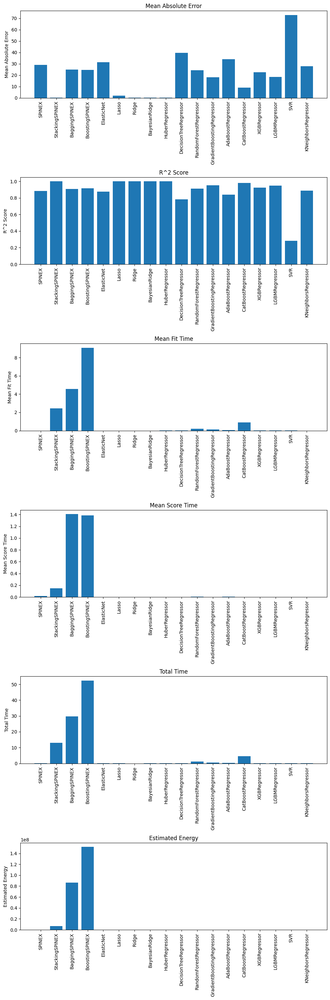

In [4]:
import matplotlib.pyplot as plt

# Define the metrics to plot
metrics_to_plot = ['Mean Absolute Error', 'R^2 Score', 'Mean Fit Time', 'Mean Score Time', 'Total Time', 'Estimated Energy']

# Create a figure and subplots for each metric
fig, axs = plt.subplots(len(metrics_to_plot), 1, figsize=(10, len(metrics_to_plot) * 5))

# Iterate through each metric and create a bar plot
for i, metric in enumerate(metrics_to_plot):
    # Extract the values for the current metric
    metric_values = [results[model_name][metric] for model_name in models.keys()]
    
    # Create the bar plot for the current metric
    axs[i].bar(models.keys(), metric_values)
    
    # Set the title and labels for the current subplot
    axs[i].set_title(metric)
    axs[i].set_ylabel(metric)
    
    # Rotate the x-axis labels by 90 degrees
    axs[i].tick_params(axis='x', rotation=90)

# Adjust the layout to prevent overlapping labels
plt.tight_layout()

# Show the plots
plt.show()


Ranked models for Mean Absolute Error:
  1. SVR - Mean Absolute Error: 1.0000
  2. DecisionTreeRegressor - Mean Absolute Error: 0.5412
  3. AdaBoostRegressor - Mean Absolute Error: 0.4661
  4. ElasticNet - Mean Absolute Error: 0.4302
  5. SPINEX - Mean Absolute Error: 0.3976
  6. KNeighborsRegressor - Mean Absolute Error: 0.3800
  7. BaggingSPINEX - Mean Absolute Error: 0.3425
  8. BoostingSPINEX - Mean Absolute Error: 0.3375
  9. RandomForestRegressor - Mean Absolute Error: 0.3327
  10. XGBRegressor - Mean Absolute Error: 0.3085
  11. LGBMRegressor - Mean Absolute Error: 0.2504
  12. GradientBoostingRegressor - Mean Absolute Error: 0.2473
  13. CatBoostRegressor - Mean Absolute Error: 0.1242
  14. Lasso - Mean Absolute Error: 0.0260
  15. Ridge - Mean Absolute Error: 0.0035
  16. HuberRegressor - Mean Absolute Error: 0.0011
  17. BayesianRidge - Mean Absolute Error: 0.0011
  18. StackingSPINEX - Mean Absolute Error: 0.0011

Ranked models for R^2 Score:
  1. StackingSPINEX - R^2 Score:

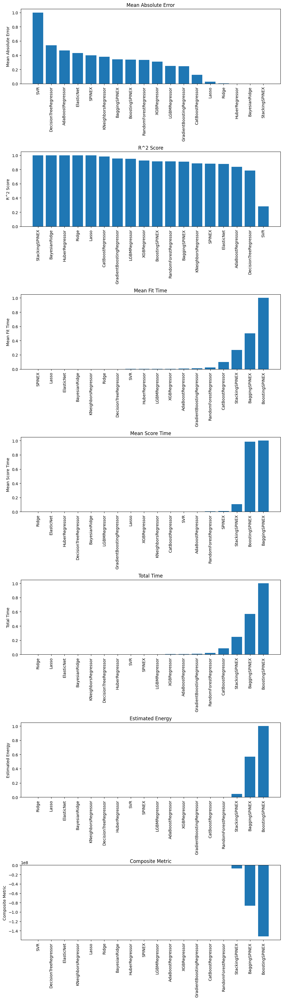

In [5]:
# Define the metrics to plot
metrics_to_plot = [('Mean Absolute Error', 1.0), ('R^2 Score', 1.0), ('Mean Fit Time', -1.0), ('Mean Score Time', -1.0), ('Total Time', -1.0), ('Estimated Energy', -1.0)]

# Calculate the composite metric and normalize the metrics
normalized_results = {}
for model_name, metrics in results.items():
    composite_metric = sum(metrics[metric] * weight for metric, weight in metrics_to_plot)
    normalized_metrics = {metric: metrics[metric] / max(results[model][metric] for model in results) for metric, _ in metrics_to_plot}
    normalized_metrics['Composite Metric'] = composite_metric
    normalized_results[model_name] = normalized_metrics

# Add the composite metric to the list of metrics to plot
metrics_to_plot.append(('Composite Metric', 1.0))

# Create a figure and subplots for each metric
fig, axs = plt.subplots(len(metrics_to_plot), 1, figsize=(10, len(metrics_to_plot) * 5))

# Iterate through each metric and create a bar plot
for i, (metric, weight) in enumerate(metrics_to_plot):
    # Extract and sort the values for the current metric
    metric_values = [(model_name, normalized_results[model_name][metric]) for model_name in models.keys()]
    metric_values.sort(key=lambda x: x[1], reverse=weight > 0)  # Sort based on the weight

    # Print the ranked models for the current metric
    print(f"Ranked models for {metric}:")
    for rank, (model_name, metric_value) in enumerate(metric_values, start=1):
        print(f"  {rank}. {model_name} - {metric}: {metric_value:.4f}")
    print()
    
    # Create the bar plot for the current metric
    axs[i].bar([model_name for model_name, _ in metric_values], [metric_value for _, metric_value in metric_values])
    
    # Set the title and labels for the current subplot
    axs[i].set_title(metric)
    axs[i].set_ylabel(metric)
    
    # Rotate the x-axis labels by 90 degrees
    axs[i].tick_params(axis='x', rotation=90)

# Adjust the layout to prevent overlapping labels
plt.tight_layout()

# Show the plots
plt.show()


Normalized Feature Importances for Base Estimator 0 in SPINEX:
  Feature 0: 0.1446
  Feature 1: 0.2876
  Feature 2: 0.1586
  Feature 3: 0.2943
  Feature 4: 0.1148
Interaction Effects for Base Estimator 0 in SPINEX:
[[0.         4.59077251 5.27926883 3.32928917 3.58981114]
 [4.59077251 0.         7.71646648 5.76648682 6.02700879]
 [5.27926883 7.71646648 0.         6.45498314 6.71550511]
 [3.32928917 5.76648682 6.45498314 0.         4.76552545]
 [3.58981114 6.02700879 6.71550511 4.76552545 0.        ]]
Normalized Feature Importances for Base Estimator 1 in SPINEX:
  Feature 0: 0.1465
  Feature 1: 0.3070
  Feature 2: 0.1425
  Feature 3: 0.2841
  Feature 4: 0.1200
Interaction Effects for Base Estimator 1 in SPINEX:
[[0.         4.51991147 4.44914479 2.54719798 4.80708535]
 [4.51991147 0.         5.53281527 3.63086845 5.89075582]
 [4.44914479 5.53281527 0.         3.56010178 5.81998915]
 [2.54719798 3.63086845 3.56010178 0.         3.91804234]
 [4.80708535 5.89075582 5.81998915 3.91804234 0

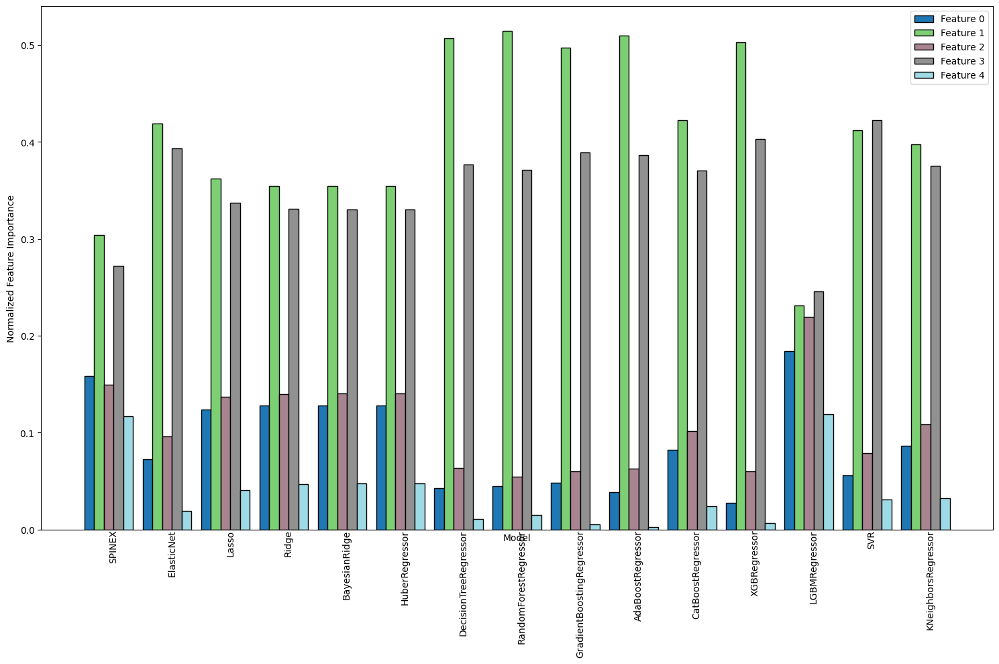

In [6]:
import numpy as np
import matplotlib.colors as mcolors
from sklearn.inspection import permutation_importance

def normalize_importances(importances):
    return importances / np.sum(importances)

# Initialize the feature_importances dictionary
normalized_feature_importances = {}
processed_models = set()

# Initialize variable to keep track of the maximum number of features
max_features = 0

# Define the models dictionary (as before)
models = {
    'SPINEX': SPINEXRegressor,
    #'StackingSPINEX': stacking_model,
    #'BaggingSPINEX': bagging_model,
    #'BoostingSPINEX': boosting_model,
    'ElasticNet': ElasticNet(alpha=1.0, l1_ratio=0.5, max_iter=10000),
    'Lasso': Lasso(alpha=1.0, max_iter=10000),
    'Ridge': Ridge(alpha=1.0),
    'BayesianRidge': BayesianRidge(),
    'HuberRegressor': HuberRegressor(),
    'DecisionTreeRegressor': DecisionTreeRegressor(),
    'RandomForestRegressor': RandomForestRegressor(),
    'GradientBoostingRegressor': GradientBoostingRegressor(),
    'AdaBoostRegressor': AdaBoostRegressor(),
    'CatBoostRegressor': CatBoostRegressor(verbose=False),
    'XGBRegressor': XGBRegressor(objective='reg:squarederror', eval_metric='mae', n_jobs=-1),
    'LGBMRegressor': LGBMRegressor(objective='regression', metric='mae', n_jobs=-1),
    'SVR': SVR(),
    'KNeighborsRegressor': KNeighborsRegressor()
} 

# Perform cross-validation for each model
for model_name, model in models.items():
    # Fit the model on the training data
    if model_name == "SPINEX":
        # Use the appropriate data for the SPINEX model
        model.fit(X_prioritized if X_prioritized is not None else X, y)
        
        # Fit and print normalized feature importances and interaction effects for SPINEX
        feature_importances, interaction_effects = SPINEXRegressor.get_feature_importance(X_prioritized if X_prioritized is not None else X)

        if isinstance(feature_importances, np.ndarray):
            # Single model case
            feature_importances = [feature_importances]  # Convert numpy array to list

        # Now, you can iterate over feature_importances whether it's a list of numpy arrays (ensemble case) or a list containing a single numpy array (single model case)
        for estimator_idx, est_importances in enumerate(feature_importances):
            normalized_importances = est_importances / np.sum(est_importances)
            print(f"Normalized Feature Importances for Base Estimator {estimator_idx} in SPINEX:")
            for i, importance in enumerate(normalized_importances):
                print(f"  Feature {i}: {importance:.4f}")
            if interaction_effects is not None:
                print(f"Interaction Effects for Base Estimator {estimator_idx} in SPINEX:")
                print(interaction_effects[estimator_idx])
        else:
            # Ensemble case
            for estimator_idx, (est_importances, est_interaction_effects) in enumerate(zip(feature_importances, interaction_effects)):
                normalized_importances = est_importances / np.sum(est_importances)
                print(f"Normalized Feature Importances for Base Estimator {estimator_idx} in SPINEX:")
                for i, importance in enumerate(normalized_importances):
                    print(f"  Feature {i}: {importance:.4f}")
                print(f"Interaction Effects for Base Estimator {estimator_idx} in SPINEX:")
                print(est_interaction_effects)
    else:
        # Use all features for other models
        model.fit(X, y)
        # Calculate feature importances
        if hasattr(model, 'feature_importances_'):
            raw_importances = model.feature_importances_
        else:
            r = permutation_importance(model, X, y, n_repeats=10, random_state=42, scoring='neg_mean_absolute_error')
            raw_importances = r.importances_mean
        # Normalize the importances
        normalized_importances = raw_importances / np.sum(raw_importances)
        # Print normalized feature importances
        print(f"Normalized Feature Importances for {model_name}:")
        for i, importance in enumerate(normalized_importances):
            print(f"  Feature {i}: {importance:.4f}")
        print("-" * 50)
    # Update normalized_feature_importances dictionary
    normalized_feature_importances[model_name] = normalized_importances
    # Update max_features to keep track of the maximum number of features
    max_features = max(max_features, len(normalized_importances))


# Plotting the normalized feature importances
fig, ax = plt.subplots(figsize=(15, 10))

# Set up the y-axis labels (feature indices)
model_names = list(normalized_feature_importances.keys())

# Create a colormap
colormap = mcolors.LinearSegmentedColormap.from_list("custom", plt.cm.tab20.colors, N=max(max_features, 2))

# Initialize a variable to keep track of the current x position for the bars
current_x = 0

# Plot the normalized feature importances for each feature
for i, (model_name, importances) in enumerate(normalized_feature_importances.items()):
    num_features = len(importances)
    feature_indices = np.arange(num_features)
    bar_width = 1 / (max_features + 1)
    
    for j, importance in enumerate(importances):
        # Replace "nan" values with zeros
        if np.isnan(importance):
            importance = 0
        ax.bar(current_x + j * bar_width, importance, bar_width, color=colormap(j), 
               label=f"Feature {j}" if i == 0 else None, edgecolor='black', linewidth=1)
   
    # Set the x-axis tick labels
    ax.text(current_x + (bar_width * num_features / 2), 0, model_name, rotation=90, ha='center', va='top')
    
    # Update the current x position
    current_x += num_features * bar_width + bar_width

# Set the axis labels
ax.set_ylabel("Normalized Feature Importance")
ax.set_xlabel("Model")

# Remove x-axis ticks
ax.set_xticks([])

# Add the legend
# Generate dynamic legend labels based on the maximum number of features
legend_labels = [f"Feature {i}" for i in range(max_features)]
ax.legend(legend_labels)

# Show the plot
plt.tight_layout()
plt.show()


In [7]:
# Instantiate and fit the SPINEX model (code provided earlier)

# Obtain the average interaction effects using the get_global_interaction_effects method
avg_interaction_effects_list = SPINEXRegressor.get_global_interaction_effects(X)

# Obtain the impact of feature combinations using the feature_combination_impact_analysis method
feature_combination_impact_list = SPINEXRegressor.feature_combination_impact_analysis(X)

# Check if ensemble logic was applied
if isinstance(avg_interaction_effects_list, list):
    # Ensemble case: avg_interaction_effects_list and feature_combination_impact_list are lists
    for estimator_idx, (avg_interaction_effects, feature_combination_impact) in enumerate(zip(avg_interaction_effects_list, feature_combination_impact_list)):
        print(f"Base Estimator {estimator_idx} in SPINEX:")
        
        # Display the average interaction effects matrix
        print("  Average Interaction Effects:")
        print(avg_interaction_effects)

        # Display the impact of feature combinations
        print("\n  Feature Combination Impact Analysis:")
        for comb, impact in feature_combination_impact:
            # Convert feature indices to names, assuming original names are like 'Feature 0', 'Feature 1', etc.
            feature_names = [f"Feature {i}" for i in comb]
            print(f"  Feature Combination {feature_names}: Impact = {impact:.4f}")
else:
    # Single model case: avg_interaction_effects_list and feature_combination_impact_list are not lists
    avg_interaction_effects = avg_interaction_effects_list
    feature_combination_impact = feature_combination_impact_list
    
    # Display the average interaction effects matrix
    print("Average Interaction Effects:")
    print(avg_interaction_effects)

    # Display the impact of feature combinations
    print("\nFeature Combination Impact Analysis:")
    for comb, impact in feature_combination_impact:
        # Convert feature indices to names, assuming original names are like 'Feature 0', 'Feature 1', etc.
        feature_names = [f"Feature {i}" for i in comb]
        print(f"Feature Combination {feature_names}: Impact = {impact:.4f}")


Base Estimator 0 in SPINEX:
  Average Interaction Effects:
[[ 0.         -2.29937202 -0.39461273 -1.70586536  0.47415923]
 [-2.29937202  0.          2.44104178 -3.19956118  1.14888417]
 [-0.39461273  2.44104178  0.          2.0422374  -0.33753932]
 [-1.70586536 -3.19956118  2.0422374   0.          0.57127036]
 [ 0.47415923  1.14888417 -0.33753932  0.57127036  0.        ]]

  Feature Combination Impact Analysis:
  Feature Combination ['Feature 0', 'Feature 1', 'Feature 2', 'Feature 3', 'Feature 4']: Impact = 80.1470
  Feature Combination ['Feature 1', 'Feature 2', 'Feature 3', 'Feature 4']: Impact = 79.6792
  Feature Combination ['Feature 0', 'Feature 1', 'Feature 2', 'Feature 3']: Impact = 79.2730
  Feature Combination ['Feature 0', 'Feature 1', 'Feature 3', 'Feature 4']: Impact = 78.3889
  Feature Combination ['Feature 1', 'Feature 2', 'Feature 3']: Impact = 76.9725
  Feature Combination ['Feature 1', 'Feature 3', 'Feature 4']: Impact = 76.9462
  Feature Combination ['Feature 0', 'Fea

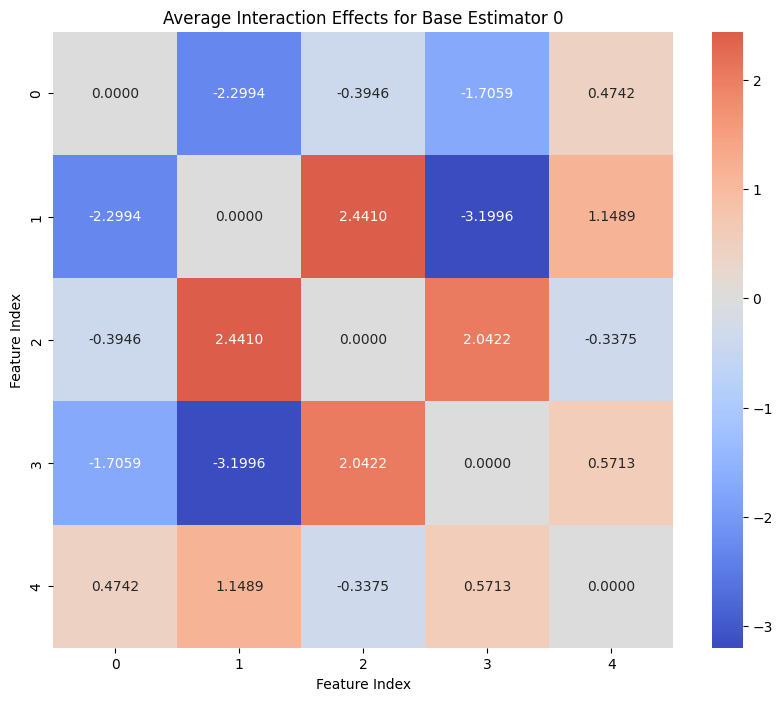

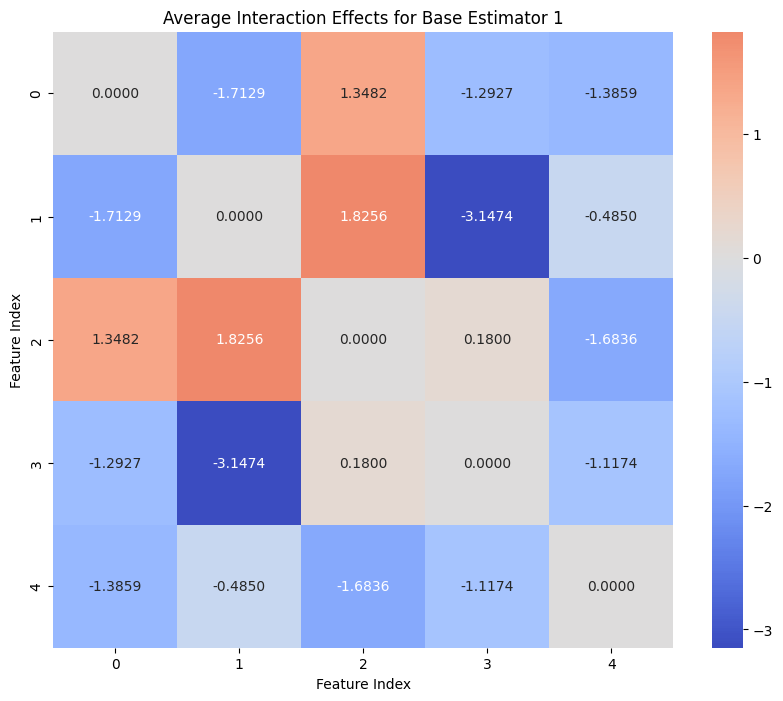

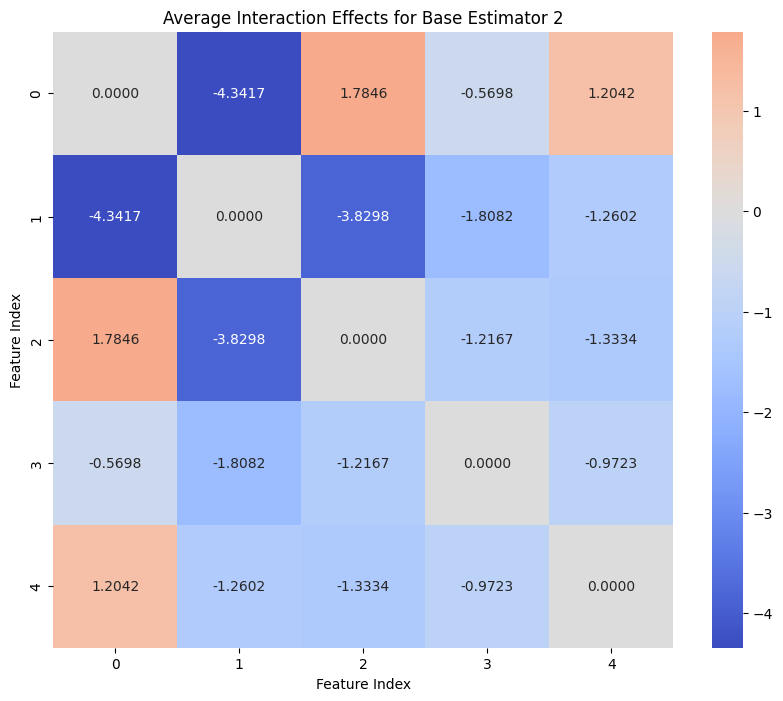

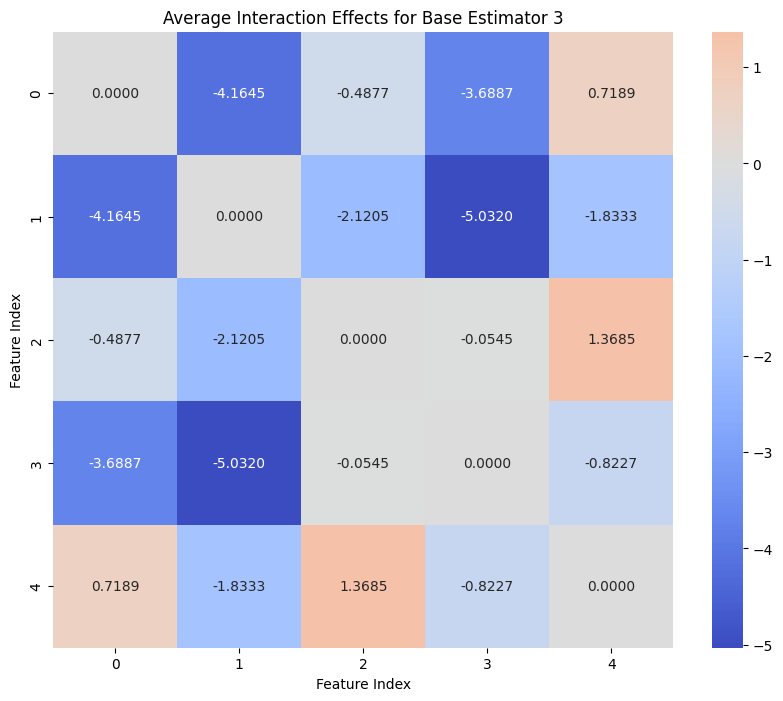

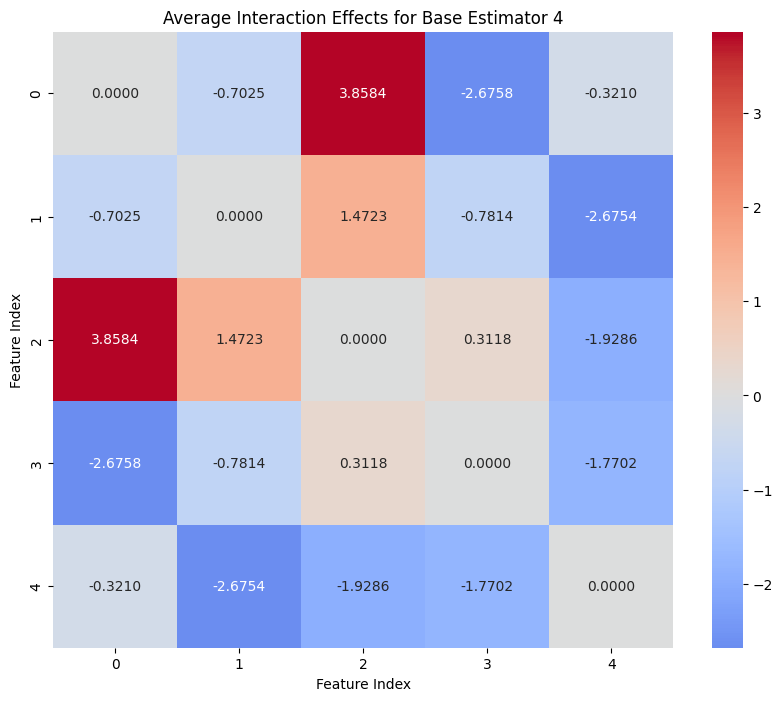

...

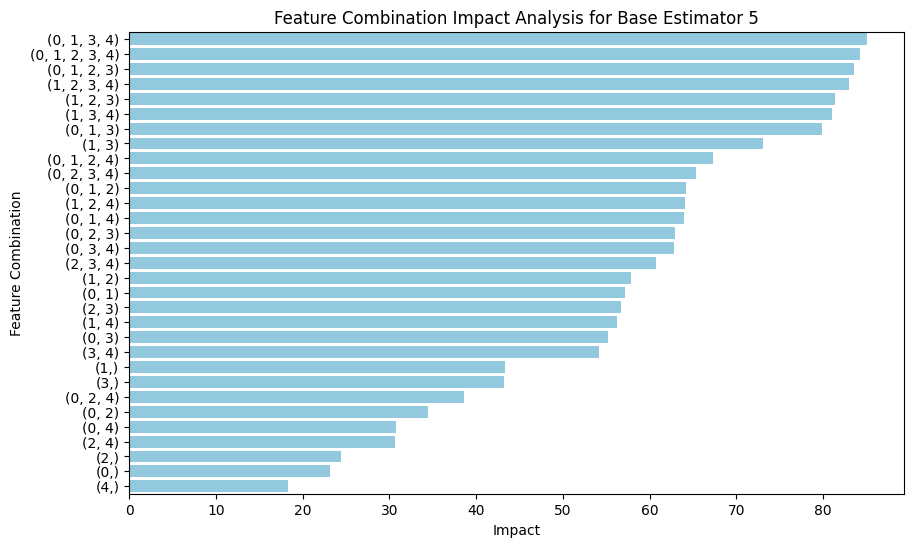

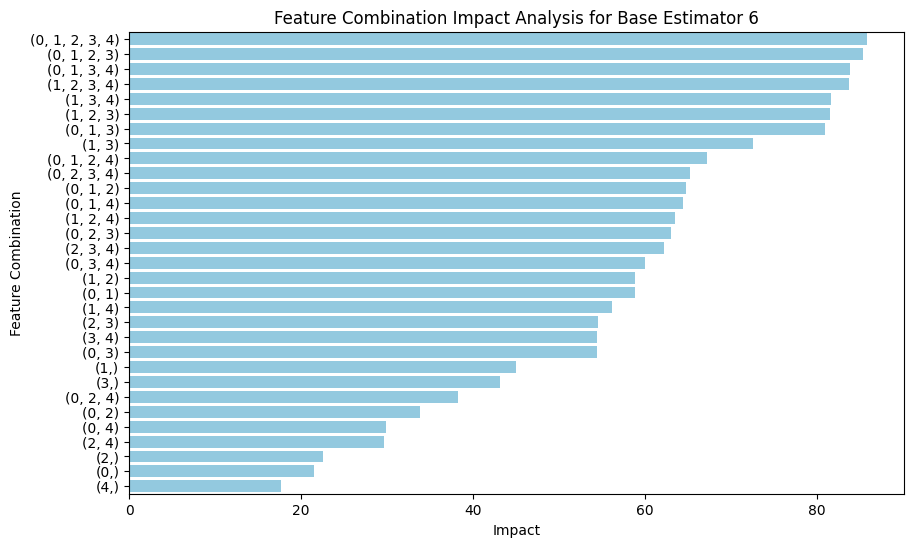

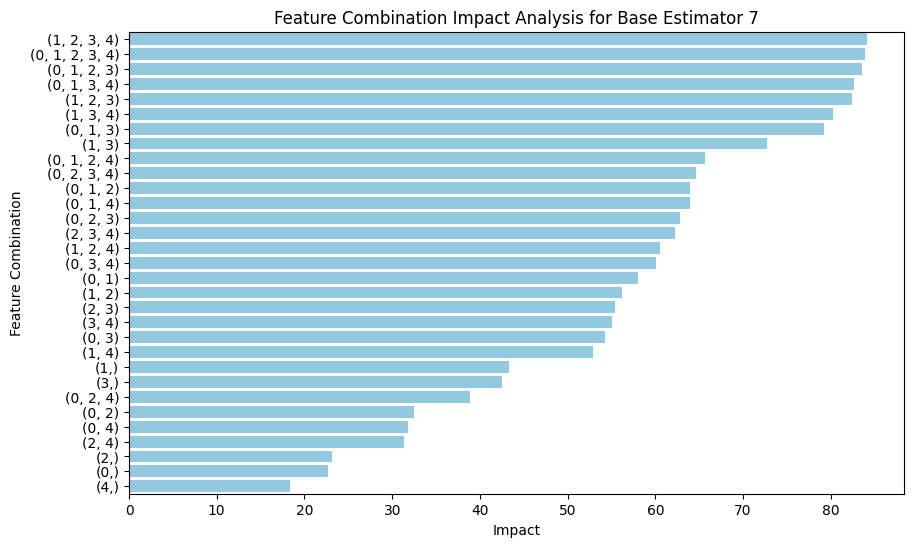

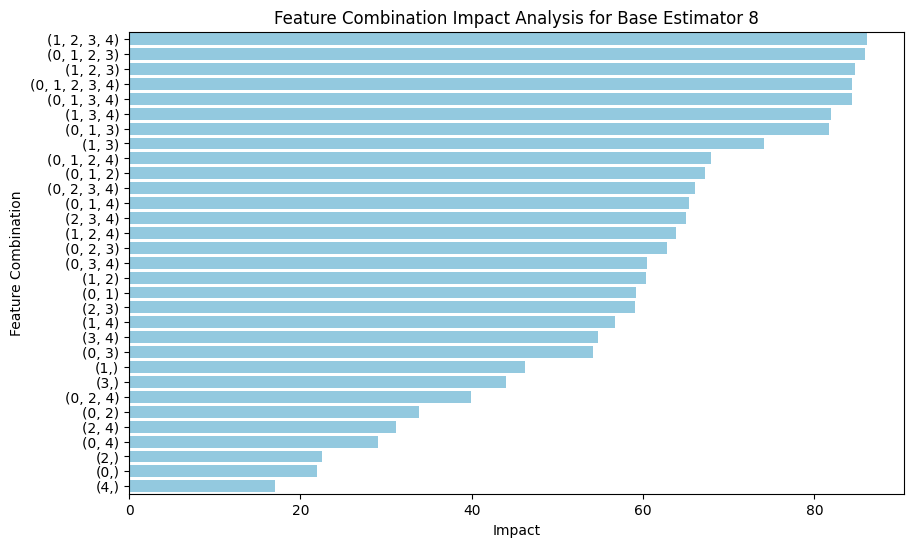

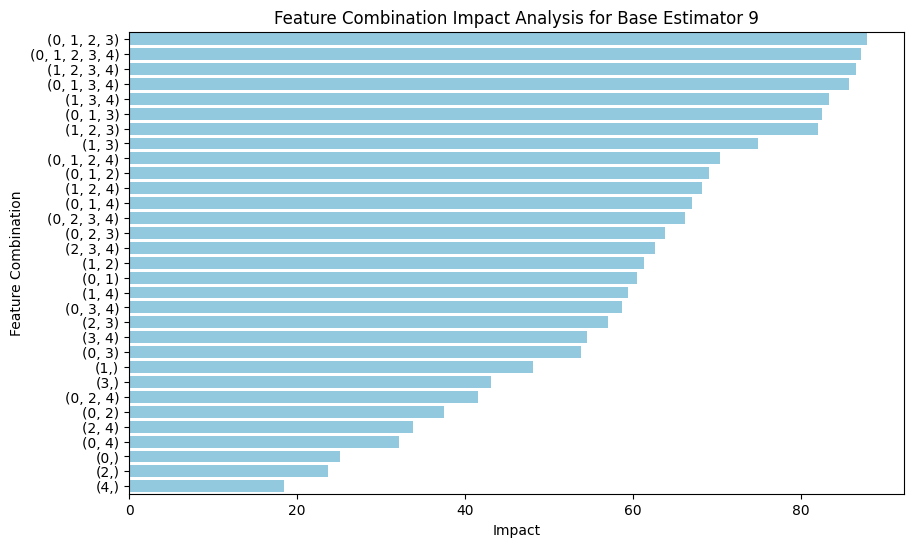

In [8]:
import matplotlib.pyplot as plt
import seaborn as sns

# Instantiate and fit the SPINEX model (code provided earlier)

# Obtain the average interaction effects using the get_global_interaction_effects method
avg_interaction_effects_list = SPINEXRegressor.get_global_interaction_effects(X)

# Check if ensemble logic was applied
if isinstance(avg_interaction_effects_list, list):
    # Ensemble case: Plot interaction effects for each base estimator
    for estimator_idx, avg_interaction_effects in enumerate(avg_interaction_effects_list):
        plt.figure(figsize=(10, 8))
        sns.heatmap(avg_interaction_effects, annot=True, fmt='.4f', cmap='coolwarm', center=0)
        plt.title(f"Average Interaction Effects for Base Estimator {estimator_idx}")
        plt.xlabel("Feature Index")
        plt.ylabel("Feature Index")
        plt.show()
else:
    # Single model case: Plot interaction effects
    plt.figure(figsize=(10, 8))
    sns.heatmap(avg_interaction_effects_list, annot=True, fmt='.4f', cmap='coolwarm', center=0)
    plt.title("Average Interaction Effects")
    plt.xlabel("Feature Index")
    plt.ylabel("Feature Index")
    plt.show()

# Obtain the average interaction effects using the get_global_interaction_effects method
avg_interaction_effects_list = SPINEXRegressor.get_global_interaction_effects(X)

# Check if ensemble logic was applied
if isinstance(avg_interaction_effects_list, list):
    # Ensemble case: Plot interaction effects for each base estimator
    for estimator_idx, avg_interaction_effects in enumerate(avg_interaction_effects_list):
        plt.figure(figsize=(10, 8))
        sns.heatmap(avg_interaction_effects, annot=True, fmt='.4f', cmap='coolwarm', center=0)
        plt.title(f"Average Interaction Effects for Base Estimator {estimator_idx}")
        plt.xlabel("Feature Index")
        plt.ylabel("Feature Index")
        plt.show()
else:
    # Single model case: Plot interaction effects
    plt.figure(figsize=(10, 8))
    sns.heatmap(avg_interaction_effects_list, annot=True, fmt='.4f', cmap='coolwarm', center=0)
    plt.title("Average Interaction Effects")
    plt.xlabel("Feature Index")
    plt.ylabel("Feature Index")
    plt.show()

# Obtain the impact of feature combinations using the feature_combination_impact_analysis method
feature_combination_impact_list = SPINEXRegressor.feature_combination_impact_analysis(X)

# Check if ensemble logic was applied
if isinstance(feature_combination_impact_list[0], list):
    # Ensemble case: Plot feature combination impact for each base estimator
    for estimator_idx, feature_combination_impact in enumerate(feature_combination_impact_list):
        feature_combinations = [str(comb) for comb, _ in feature_combination_impact]
        impact_values = [impact for _, impact in feature_combination_impact]
        plt.figure(figsize=(10, 6))
        sns.barplot(x=impact_values, y=feature_combinations, orient='h', color='skyblue')
        plt.title(f"Feature Combination Impact Analysis for Base Estimator {estimator_idx}")
        plt.xlabel("Impact")
        plt.ylabel("Feature Combination")
        plt.show()
else:
    # Single model case: Plot feature combination impact
    feature_combinations = [str(comb) for comb, _ in feature_combination_impact_list]
    impact_values = [impact for _, impact in feature_combination_impact_list]
    plt.figure(figsize=(10, 6))
    sns.barplot(x=impact_values, y=feature_combinations, orient='h', color='skyblue')
    plt.title("Feature Combination Impact Analysis")
    plt.xlabel("Impact")
    plt.ylabel("Feature Combination")
    plt.show()


Interaction Network for Base Estimator 0:


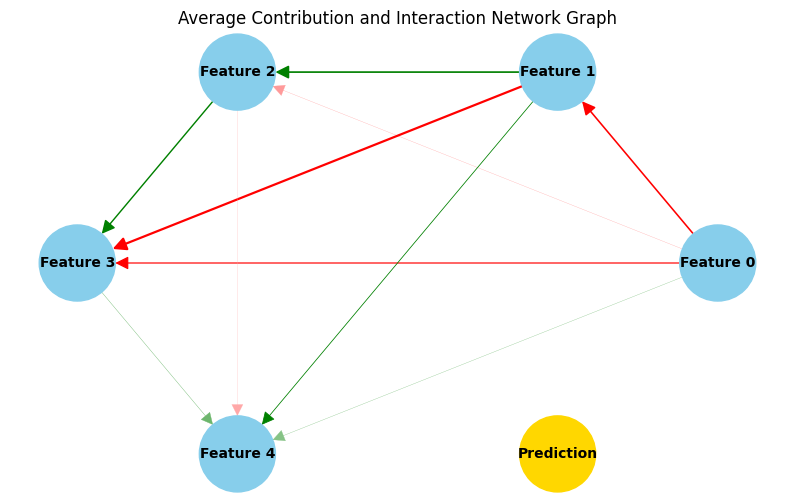

Interaction Network for Base Estimator 1:


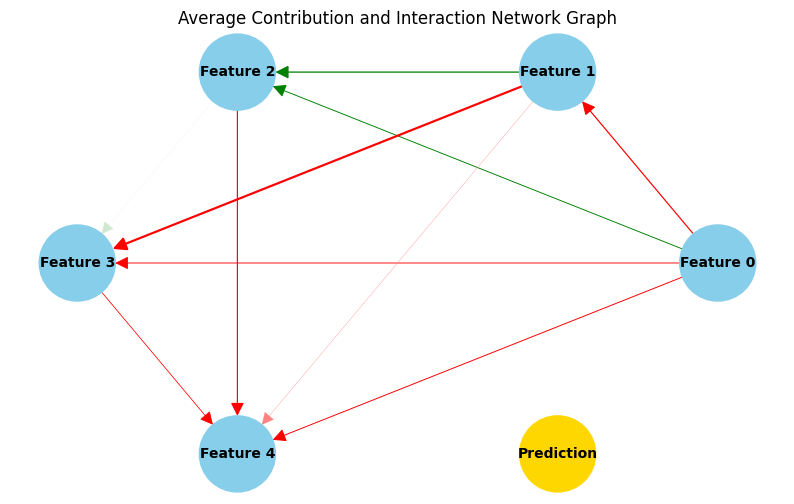

Interaction Network for Base Estimator 2:


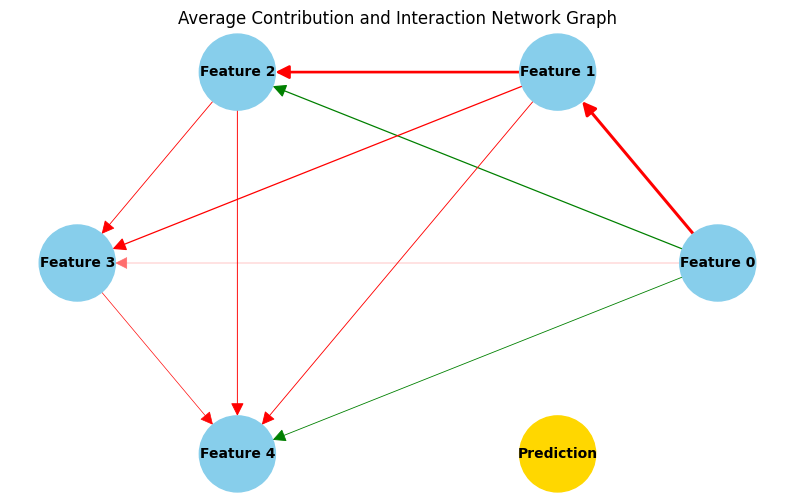

Interaction Network for Base Estimator 3:


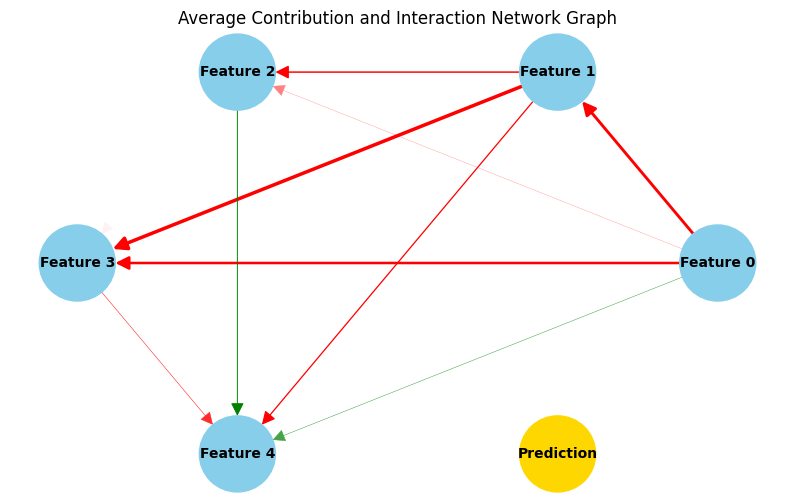

Interaction Network for Base Estimator 4:


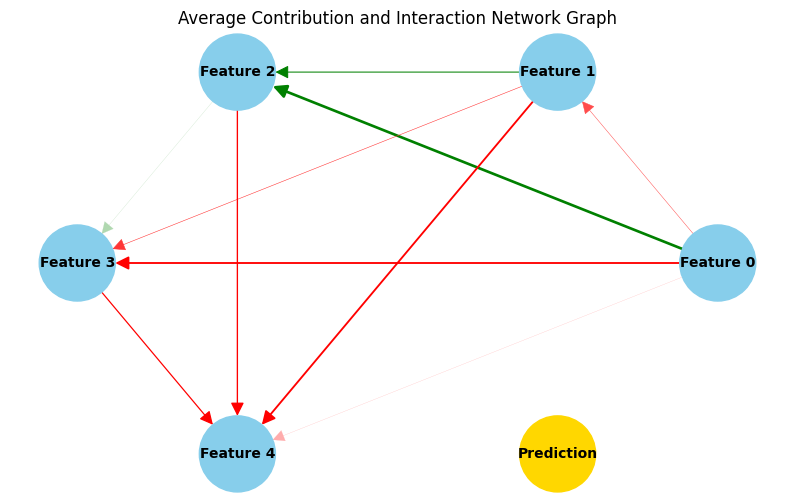

Interaction Network for Base Estimator 5:


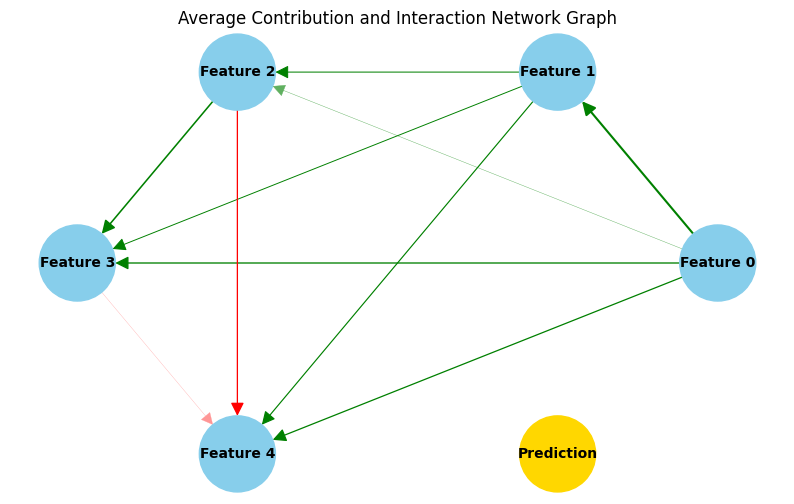

Interaction Network for Base Estimator 6:


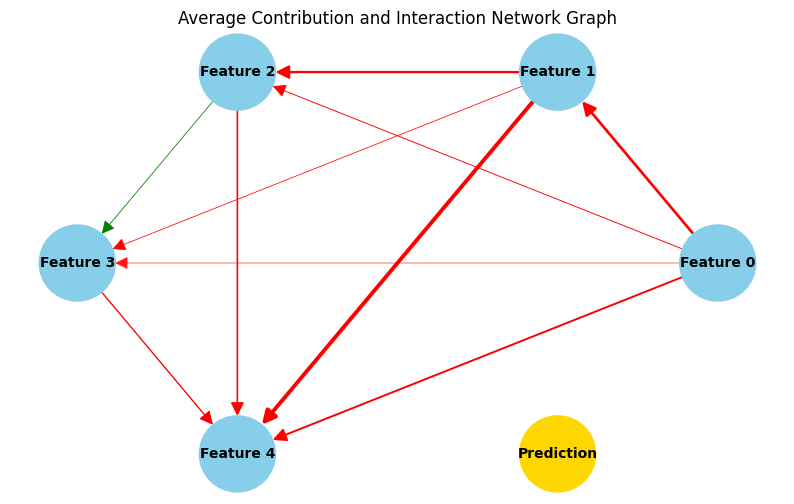

Interaction Network for Base Estimator 7:


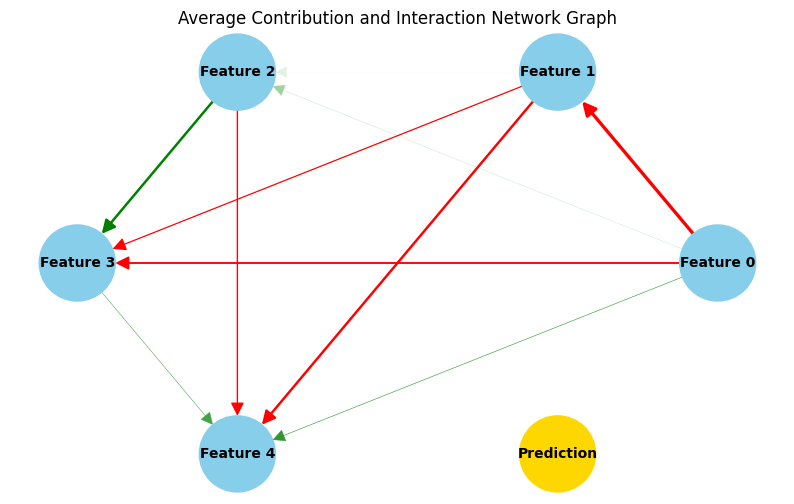

Interaction Network for Base Estimator 8:


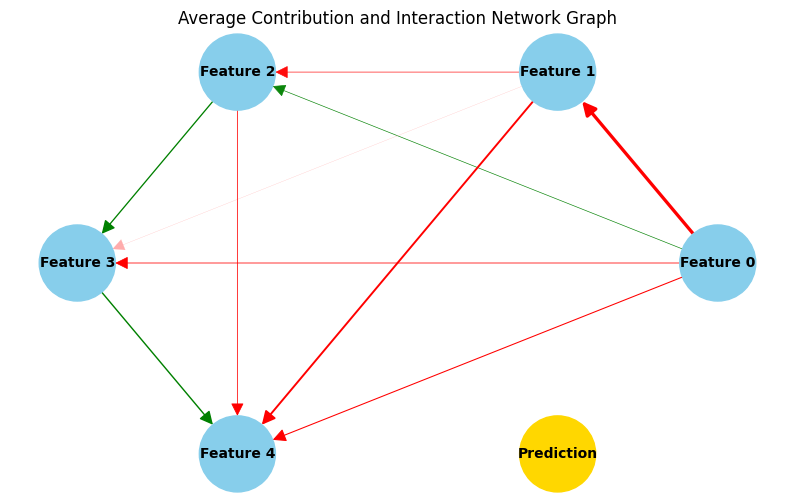

Interaction Network for Base Estimator 9:


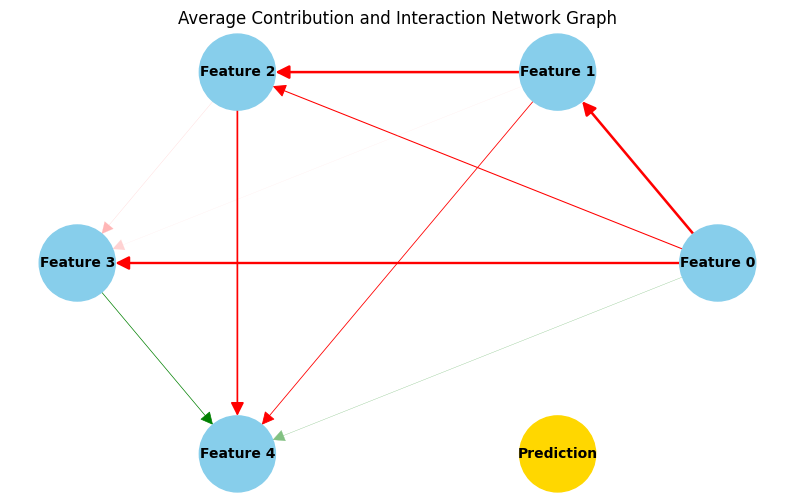

In [9]:
import networkx as nx
import numpy as np

def plot_average_interaction_network(avg_interaction_effects, feature_names=None):
    # Determine the number of selected features
    num_selected_features = avg_interaction_effects.shape[0]

    # Automatically generate feature names if not provided
    if feature_names is None:
        feature_names = [f'Feature {j}' for j in range(num_selected_features)]

    # Create a network graph
    G = nx.DiGraph()

    # Add nodes for features
    G.add_nodes_from(feature_names)

    # Add node for prediction
    G.add_node('Prediction')

    # Add edges for pairwise interactions
    for i in range(num_selected_features):
        for j in range(i+1, num_selected_features):
            interaction_value = avg_interaction_effects[i, j]
            if interaction_value != 0:
                G.add_edge(feature_names[i], feature_names[j], weight=abs(interaction_value), sign=interaction_value)

    # Set edge colors based on the sign of interactions/contributions
    cmap = mcolors.LinearSegmentedColormap.from_list("", ["red", "white", "green"])
    edge_colors = [cmap(G[u][v]['sign'] / 2 + 0.5) for u, v in G.edges()]

    # Set edge width based on the weight of interactions/contributions (scaled down by a factor)
    edge_widths = [G[u][v]['weight'] * 0.5 for u, v in G.edges()]

    # Set node colors (features in blue, prediction in yellow)
    node_colors = ['skyblue' if node in feature_names else 'gold' for node in G.nodes()]

    # Draw the network graph
    plt.figure(figsize=(10, 6))
    plt.gca().set_facecolor("#f0f0f0")
    pos = nx.circular_layout(G)
    nx.draw(G, pos, with_labels=True, node_size=3000, node_color=node_colors,
            font_size=10, font_weight='bold', font_color='black',
            edge_color=edge_colors, width=edge_widths, arrowstyle='-|>', arrowsize=20)
    plt.title('Average Contribution and Interaction Network Graph')
    plt.show()

# Obtain the average interaction effects using the get_global_interaction_effects method
avg_interaction_effects_list = SPINEXRegressor.get_global_interaction_effects(X)

# Check if ensemble logic was applied
if isinstance(avg_interaction_effects_list, list):
    # Ensemble case: Plot interaction network for each base estimator
    for estimator_idx, avg_interaction_effects in enumerate(avg_interaction_effects_list):
        print(f"Interaction Network for Base Estimator {estimator_idx}:")
        plot_average_interaction_network(avg_interaction_effects)
else:
    # Single model case: Plot interaction network
    plot_average_interaction_network(avg_interaction_effects_list)


Contribution Heatmaps for Base Estimator 0:


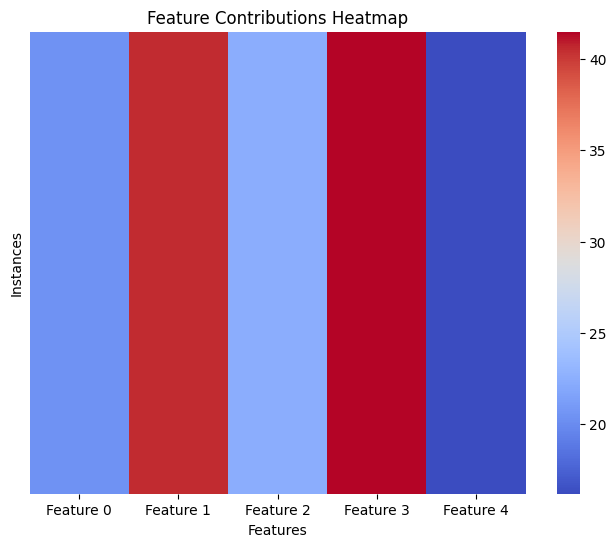

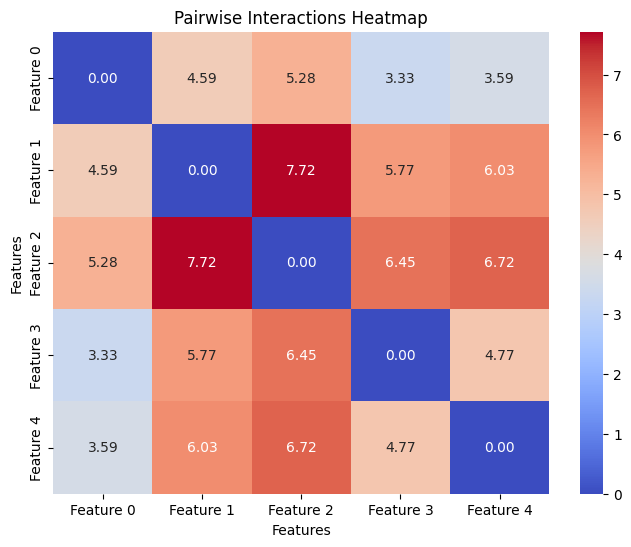

Contribution Heatmaps for Base Estimator 1:


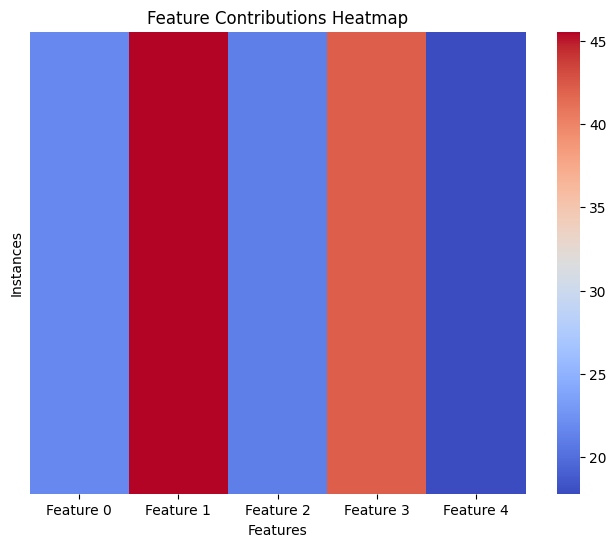

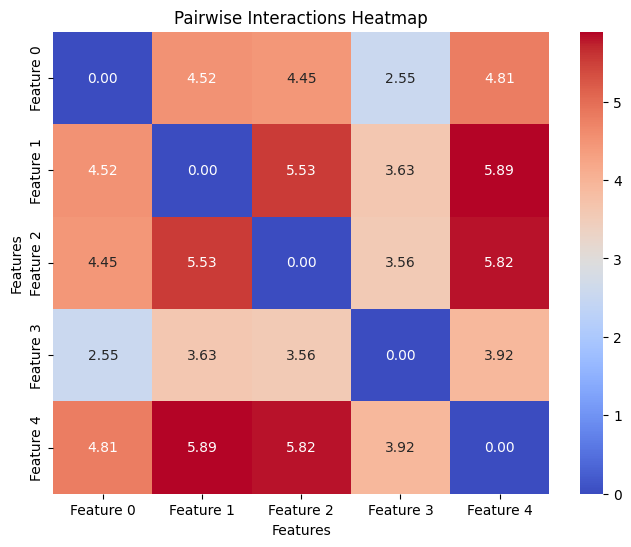

Contribution Heatmaps for Base Estimator 2:


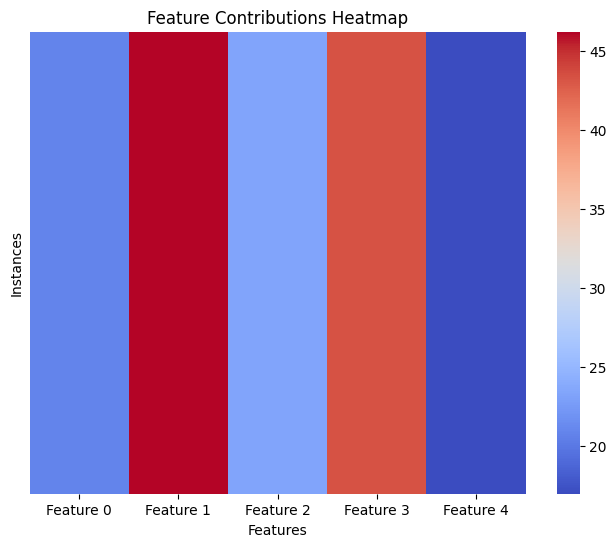

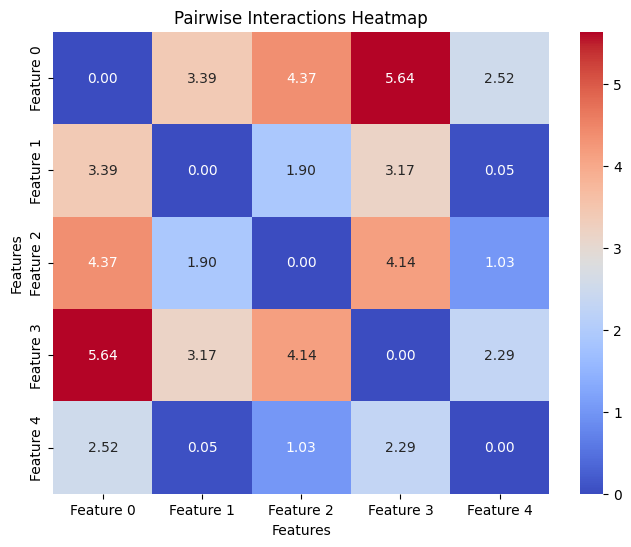

Contribution Heatmaps for Base Estimator 3:


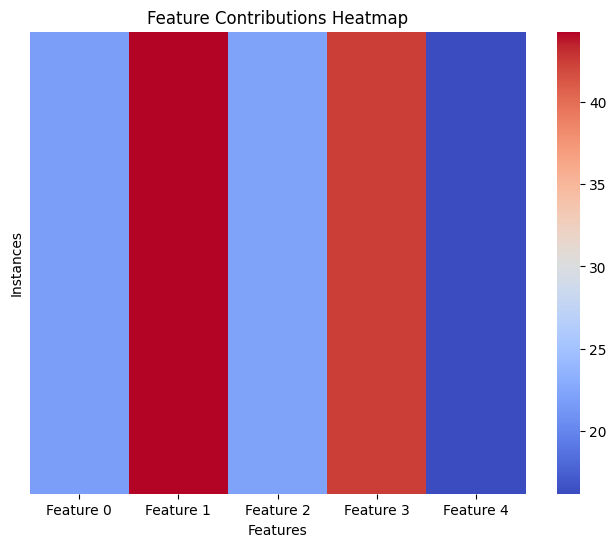

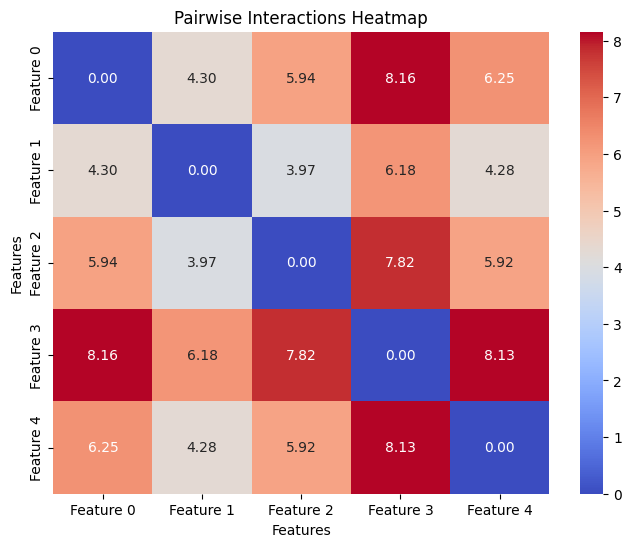

Contribution Heatmaps for Base Estimator 4:


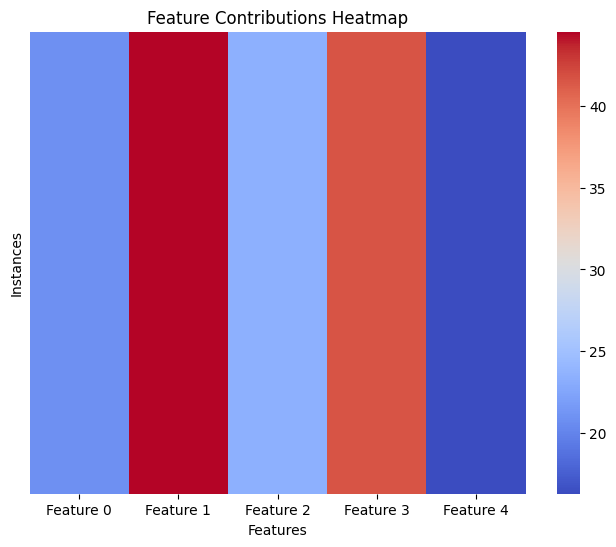

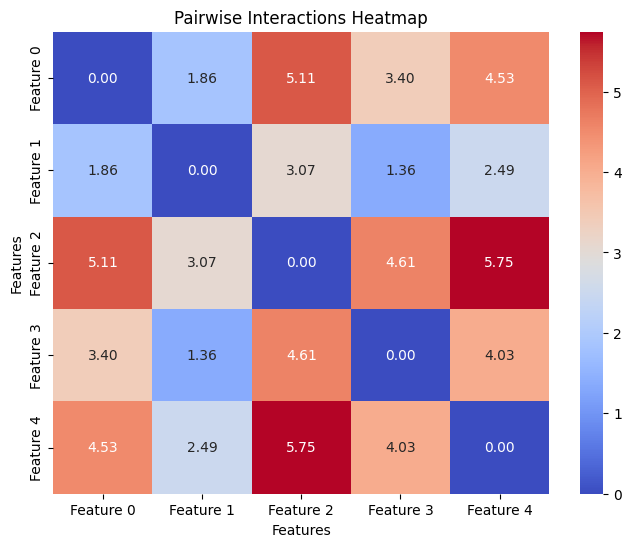

Contribution Heatmaps for Base Estimator 5:


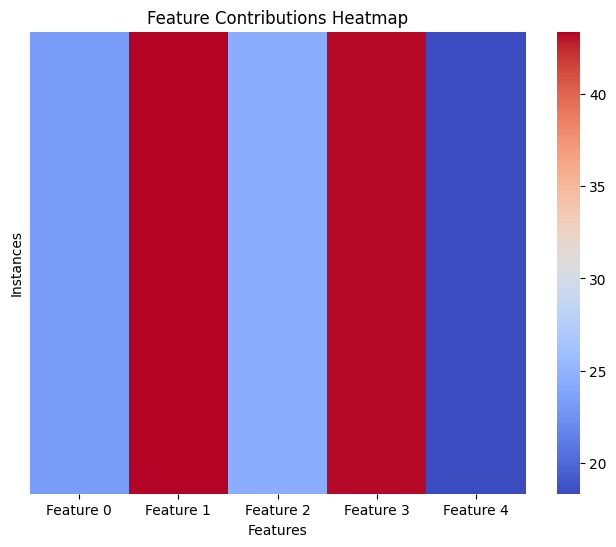

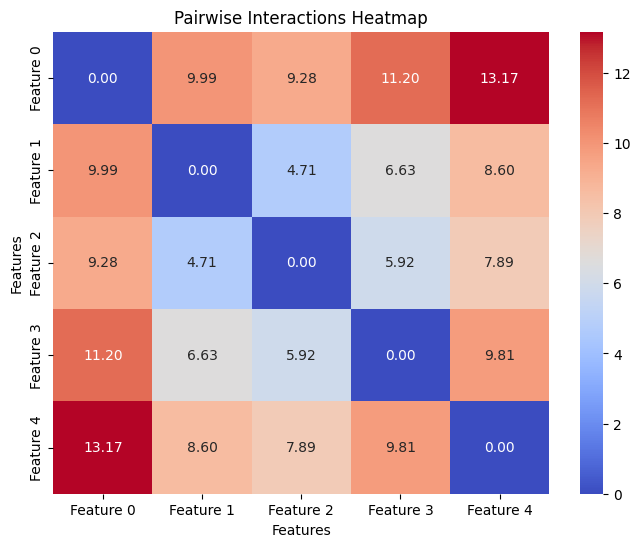

Contribution Heatmaps for Base Estimator 6:


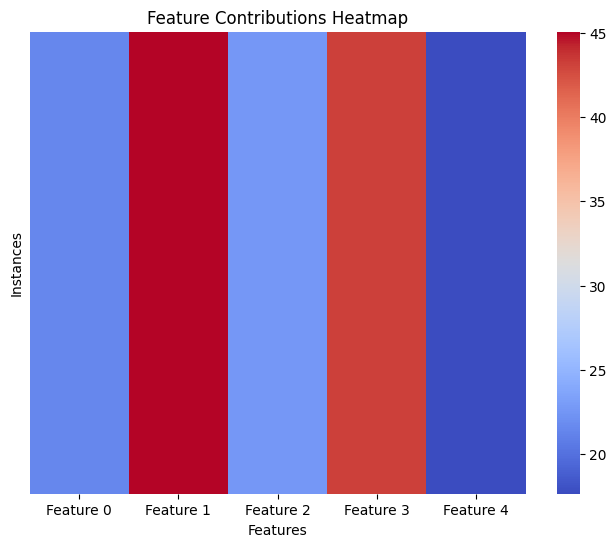

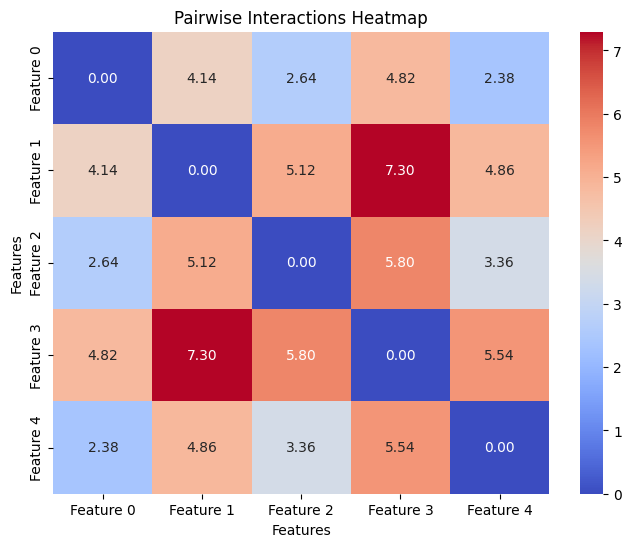

Contribution Heatmaps for Base Estimator 7:


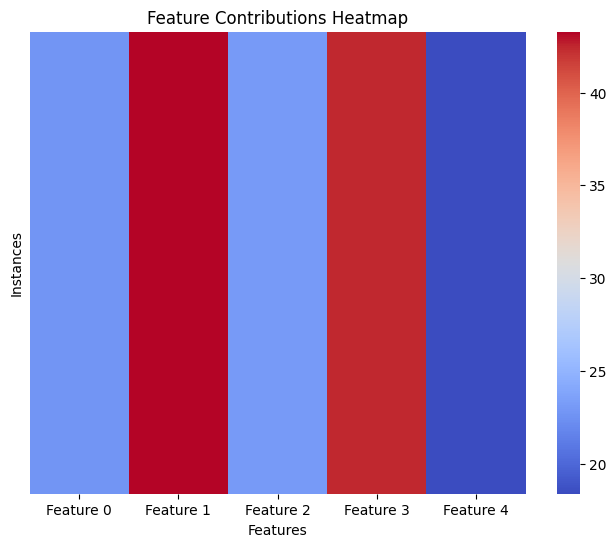

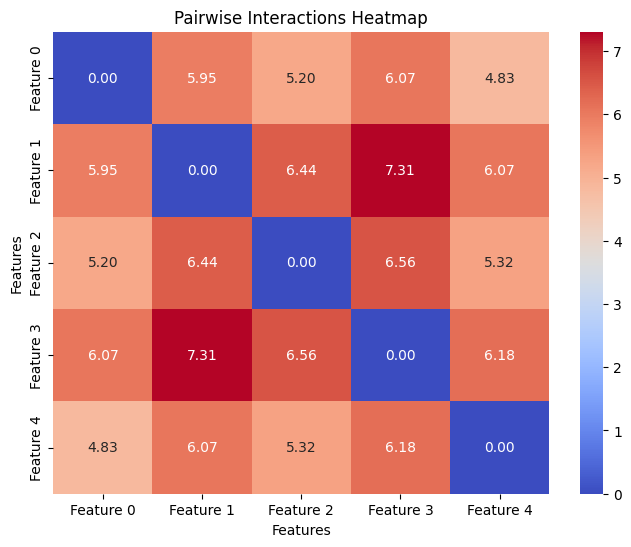

Contribution Heatmaps for Base Estimator 8:


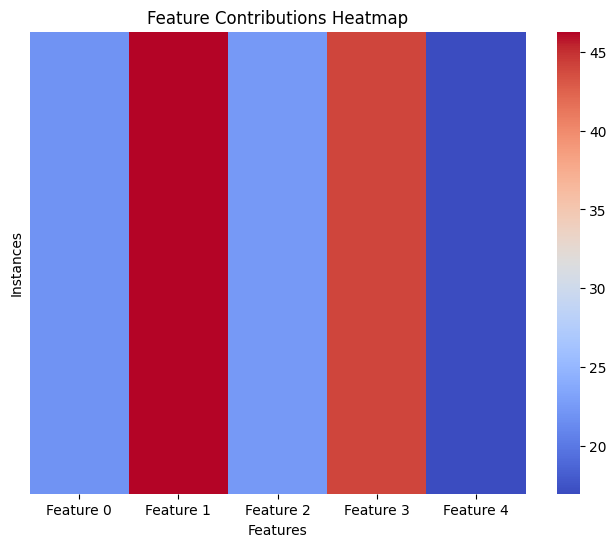

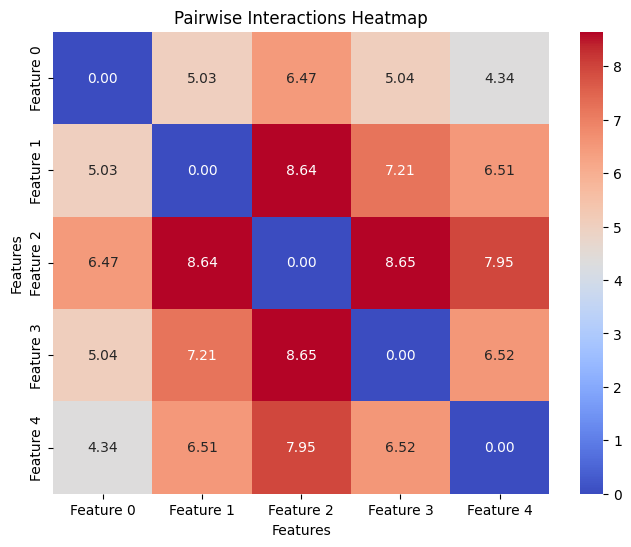

Contribution Heatmaps for Base Estimator 9:


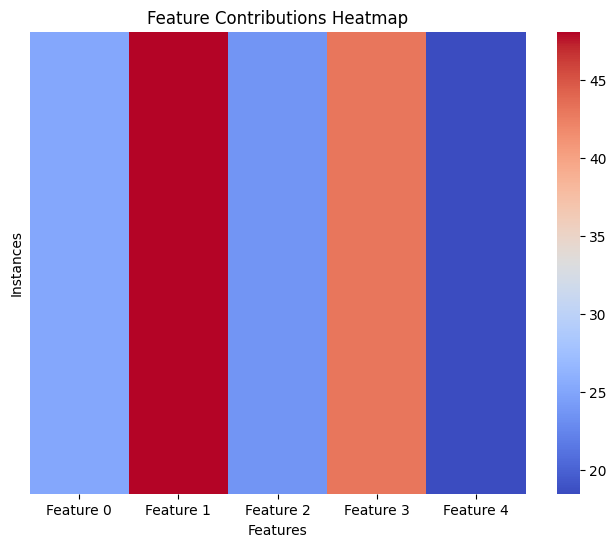

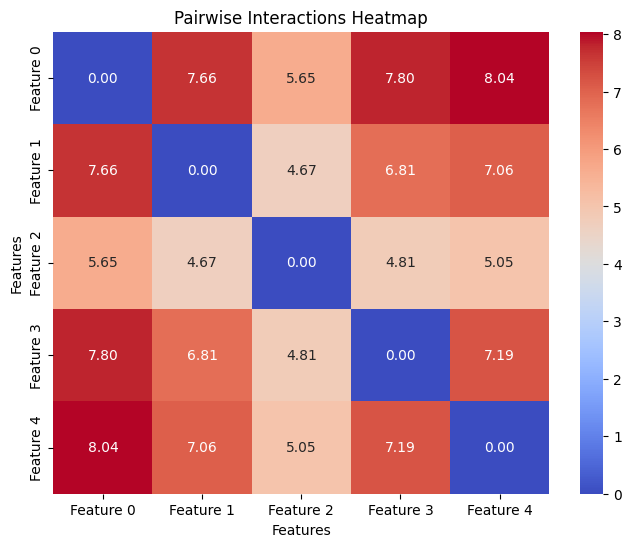

In [10]:
import seaborn as sns

def plot_contribution_heatmaps(contributions, interaction_effects, feature_names=None):
    
    if contributions.ndim == 1:
        contributions = contributions.reshape(1, -1)  # Add this line to reshape the 1D array to a 2D array with one row
        
    # Determine the number of selected features
    num_selected_features = contributions.shape[1]

    # Automatically generate feature names if not provided
    if feature_names is None:
        feature_names = [f'Feature {j}' for j in range(num_selected_features)]

    # Create a heatmap of individual feature contributions
    plt.figure(figsize=(8, 6))
    sns.heatmap(contributions, cmap='coolwarm', cbar=True, xticklabels=feature_names, yticklabels=False)
    plt.title('Feature Contributions Heatmap')
    plt.xlabel('Features')
    plt.ylabel('Instances')
    plt.show()

    # Create a pairwise interactions matrix and calculate the mean of interactions for each pair of features
    pairwise_interactions = np.zeros((num_selected_features, num_selected_features))
    for i in range(num_selected_features):
        for j in range(i+1, num_selected_features):
            pairwise_interactions[i, j] = np.mean(interaction_effects[i][j])
            pairwise_interactions[j, i] = pairwise_interactions[i, j]

    # Create a heatmap of pairwise interactions
    plt.figure(figsize=(8, 6))
    sns.heatmap(pairwise_interactions, cmap='coolwarm', annot=True, fmt=".2f", cbar=True, xticklabels=feature_names, yticklabels=feature_names)
    plt.title('Pairwise Interactions Heatmap')
    plt.xlabel('Features')
    plt.ylabel('Features')
    plt.show()

# Obtain feature importances and interaction effects using the get_feature_importance method
feature_importances, interaction_effects_list = SPINEXRegressor.get_feature_importance(X)

# Check if ensemble logic was applied
if isinstance(feature_importances, list):
    # Ensemble case: feature_importances is a list of numpy arrays
    for estimator_idx, (est_contributions, est_interaction_effects) in enumerate(zip(feature_importances, interaction_effects_list)):
        print(f"Contribution Heatmaps for Base Estimator {estimator_idx}:")
        plot_contribution_heatmaps(est_contributions, est_interaction_effects)
else:
    # Single model case: Plot contribution heatmaps
    plot_contribution_heatmaps(feature_importances, interaction_effects_list)


In [11]:
# Define the models to evaluate (only the one with get_feature_importance method)
spinex_models = {
    'SPINEX': SPINEXRegressor
}

# Select instances to predict
instance_index = [0, 2]  # Wrap the instance index in a list

# Get the feature contributions and interaction effects for the selected instances
for model_name, model in spinex_models.items():
    try:
        feature_importances, interaction_effects_list = model.get_feature_importance(X[instance_index])
    except AttributeError:
        print(f"{model_name} does not have a get_feature_importance method. Skipping...")
        continue

    # Check if ensemble logic was applied
    if isinstance(feature_importances, list):
        # Ensemble case: feature_importances is a list of numpy arrays
        for estimator_idx, (est_contributions, est_interaction_effects) in enumerate(zip(feature_importances, interaction_effects_list)):
            for instance_idx, index in enumerate(instance_index):
                print(f"\nInstance {instance_idx+1} with ground truth label {y[index]}:")
                print(f"Prediction for instance {index} using {model_name}: {model.predict(X[index].reshape(1, -1))}")

                est_contributions = feature_importances[instance_idx]
                est_interaction_effects = interaction_effects_list[instance_idx]

                # Rest of the code should remain the same

            # Print individual feature contributions
            print("Individual feature contributions:")
            for j, contrib in enumerate(est_contributions):
                print(f"Feature {j} contribution: {contrib}")

            # Calculate and print normalized contributions
            total_abs_contrib = np.sum(np.abs(est_contributions))
            normalized_contributions = (np.abs(est_contributions) / total_abs_contrib) * 100
            print("Normalized feature contributions (percentage of total contribution):")
            for j, norm_contrib in enumerate(normalized_contributions):
                print(f"Feature {j} normalized contribution: {norm_contrib:.2f}%")

            # Calculate and print the sum of contributions
            sum_of_contributions = np.sum(est_contributions)
            print(f"Sum of contributions: {sum_of_contributions}")

            # Print pairwise interaction effects, if available
            if len(est_interaction_effects) > 0:  # Check if interaction_effects is not empty
                print("Pairwise interactions:")
                # Initialize the sum of interactions
                sum_of_interactions = 0
                # Count the number of unique pairwise interactions
                num_of_interactions = 0
                for j, interactions in enumerate(est_interaction_effects):
                    # Check if interactions is an iterable (such as an array or list)
                    if hasattr(interactions, '__iter__'):
                        print(f"  Pairwise interactions for feature {j}: {interactions}")
                        # Add interactions to the sum of interactions
                        for k, interaction_value in enumerate(interactions):
                            if j != k:  # Exclude self-interactions
                                sum_of_interactions += interaction_value
                                num_of_interactions += 1
                    else:
                        # If interactions is not an iterable, skip it
                        continue
                # Calculate the mean of interactions
                if num_of_interactions != 0:
                    mean_of_interactions = sum_of_interactions / num_of_interactions
                else:
                    mean_of_interactions = 0
                # Print the sum and mean of interactions
                print(f"Sum of interactions: {sum_of_interactions}")
                print(f"Mean of interactions: {mean_of_interactions}")
            else:
                print("Pairwise interaction effects: None")
            
            print("-" * 30)  # Single dashed line after feature contributions and interaction effects
    else:
        # Single model case: feature_importances is a 1D numpy array
        for instance_idx, index in enumerate(instance_index):
            print(f"\nInstance {instance_idx+1} with ground truth label {y[index]}:")
            print(f"Prediction for instance {index} using {model_name}: {model.predict(X[index].reshape(1, -1))}")

            if instance_idx < len(feature_importances) and instance_idx < len(interaction_effects_list):
                est_contributions = feature_importances[instance_idx]
                est_interaction_effects = interaction_effects_list[instance_idx]
            else:
                print(f"Error: Unable to process instance {instance_idx+1} (index {index}) with the current model configuration.")
                continue


    # Rest of the code should remain the same

        # Print individual feature contributions
        print("Individual feature contributions:")
        for j, contrib in enumerate(feature_importances):
            print(f"Feature {j} contribution: {contrib}")

        # Calculate and print normalized contributions
        total_abs_contrib = np.sum(np.abs(feature_importances))
        normalized_contributions = (np.abs(feature_importances) / total_abs_contrib) * 100
        print("Normalized feature contributions (percentage of total contribution):")
        for j, norm_contrib in enumerate(normalized_contributions):
            print(f"Feature {j} normalized contribution: {norm_contrib:.2f}%")

        # Calculate and print the sum of contributions
        sum_of_contributions = np.sum(feature_importances)
        print(f"Sum of contributions: {sum_of_contributions}")

        # Print pairwise interaction effects, if available
        if len(interaction_effects_list) > 0:  # Check if interaction_effects is not empty
            print("Pairwise interactions:")
            # Initialize the sum of interactions
            sum_of_interactions = 0
            # Count the number of unique pairwise interactions
            num_of_interactions = 0
            for j, interactions in enumerate(interaction_effects_list):
                # Check if interactions is an iterable (such as an array or list)
                if hasattr(interactions, '__iter__'):
                    print(f"  Pairwise interactions for feature {j}: {interactions}")
                    # Add interactions to the sum of interactions
                    for k, interaction_value in enumerate(interactions):
                        if j != k:  # Exclude self-interactions
                            sum_of_interactions += interaction_value
                            num_of_interactions += 1
                else:
                    # If interactions is not an iterable, skip it
                    continue
            # Calculate the mean of interactions
            if num_of_interactions != 0:
                mean_of_interactions = sum_of_interactions / num_of_interactions
            else:
                mean_of_interactions = 0

            # Print the sum and mean of interactions
            print(f"Sum of interactions: {sum_of_interactions}")
            print(f"Mean of interactions: {mean_of_interactions}")
        else:
            print("Pairwise interaction effects: None")
        
        print("-" * 30)  # Single dashed line after feature contributions and interaction effects




Instance 1 with ground truth label -23.254887222321546:
Prediction for instance 0 using SPINEX: [-19.8490611]

Instance 2 with ground truth label -139.90700936185053:
Prediction for instance 2 using SPINEX: [-137.82926502]
Individual feature contributions:
Feature 0 contribution: 18.27396934294148
Feature 1 contribution: 20.22068690989177
Feature 2 contribution: 11.202897225168776
Feature 3 contribution: 29.990897839919157
Feature 4 contribution: 14.690339746298516
Normalized feature contributions (percentage of total contribution):
Feature 0 normalized contribution: 19.36%
Feature 1 normalized contribution: 21.43%
Feature 2 normalized contribution: 11.87%
Feature 3 normalized contribution: 31.78%
Feature 4 normalized contribution: 15.57%
Sum of contributions: 94.37879106421971
Pairwise interactions:
  Pairwise interactions for feature 0: [  0.         -55.9532811  -72.05061004 -54.78580625 -61.48362827]
  Pairwise interactions for feature 1: [-55.9532811    0.         -57.82135081 -4

Interaction Network for Base Estimator 0:


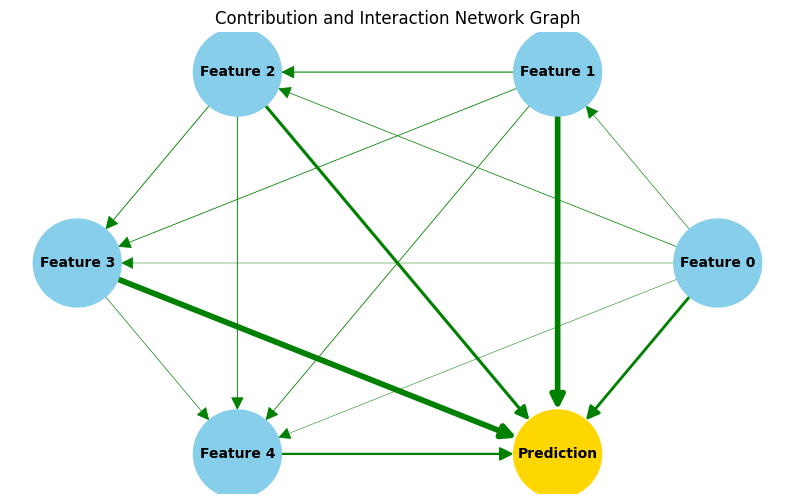

Interaction Network for Base Estimator 1:


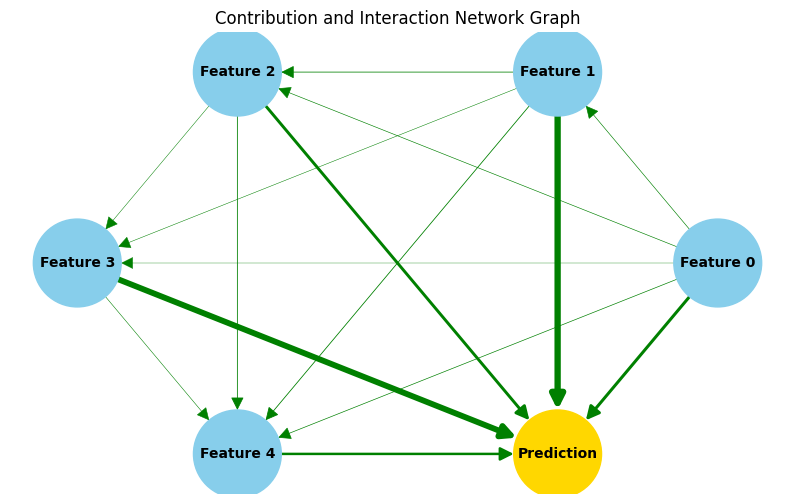

Interaction Network for Base Estimator 2:


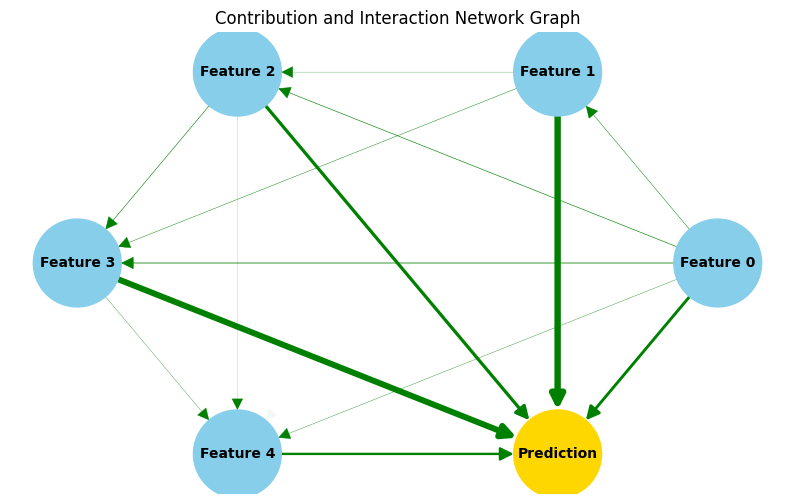

Interaction Network for Base Estimator 3:


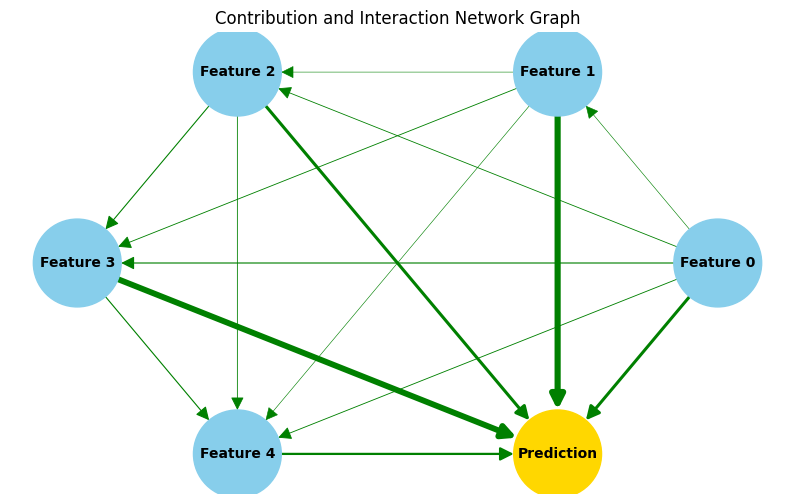

Interaction Network for Base Estimator 4:


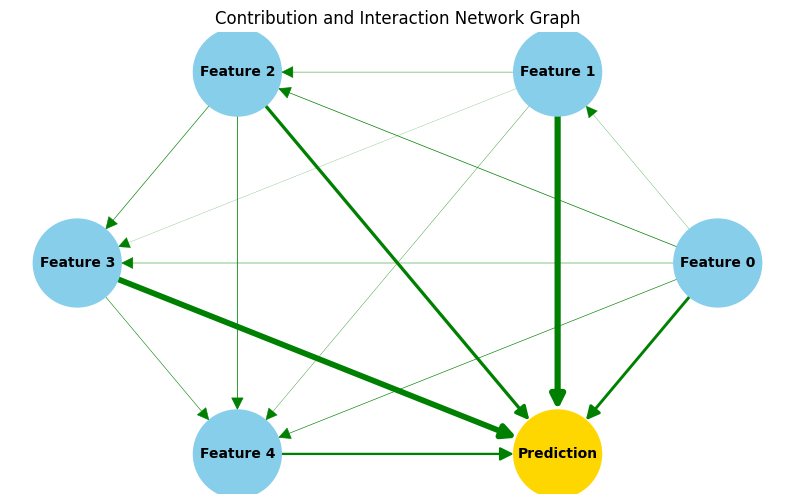

Interaction Network for Base Estimator 5:


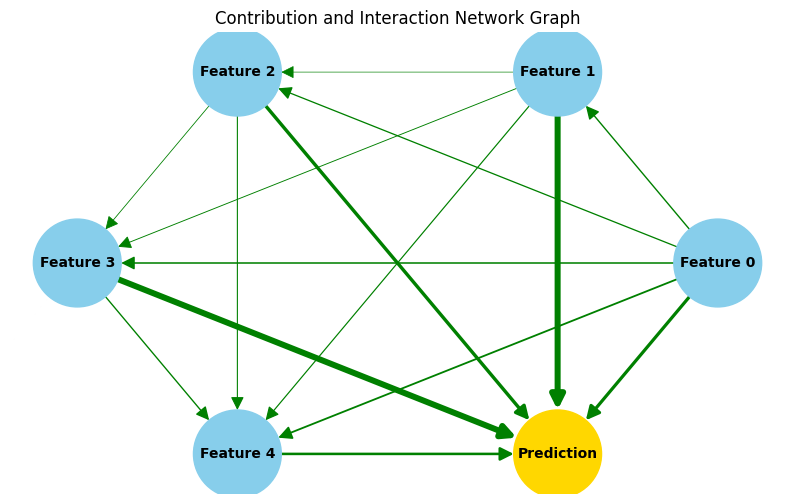

Interaction Network for Base Estimator 6:


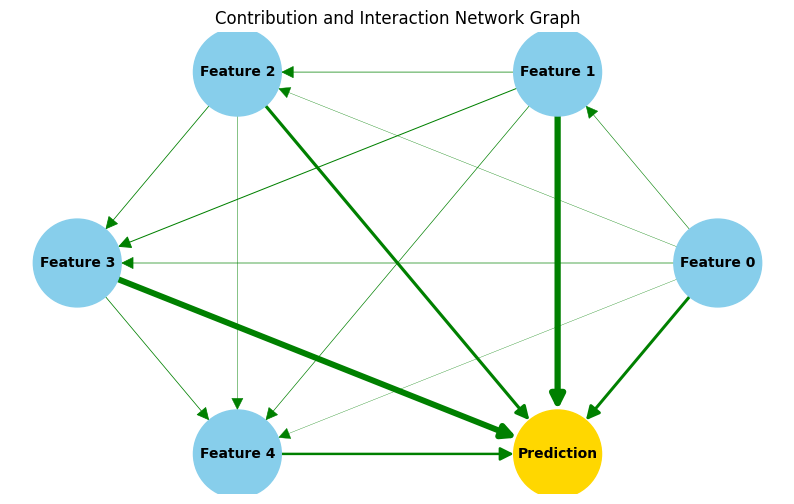

Interaction Network for Base Estimator 7:


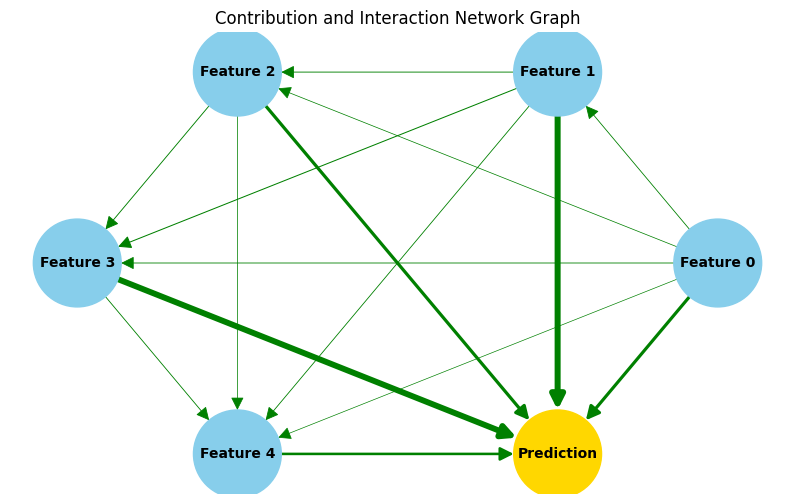

Interaction Network for Base Estimator 8:


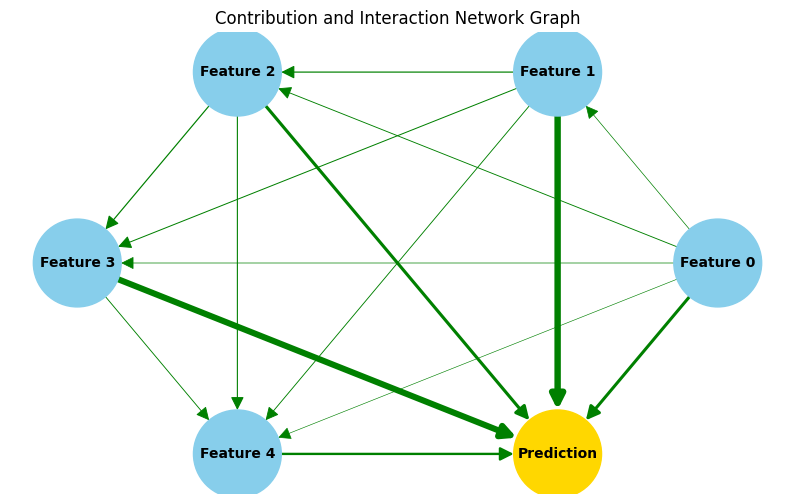

Interaction Network for Base Estimator 9:


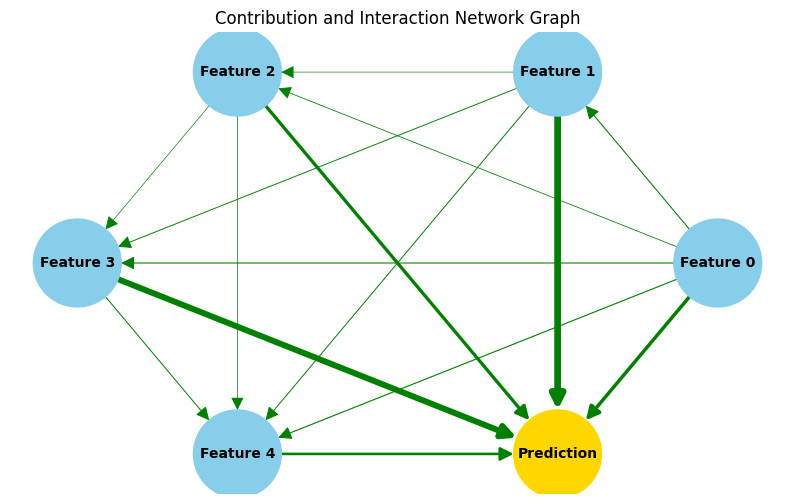

Interaction Network for Base Estimator 0:


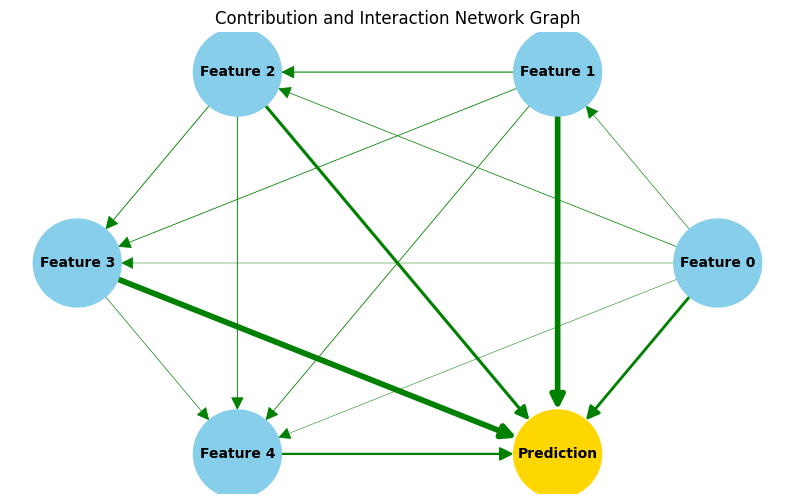

Interaction Network for Base Estimator 1:


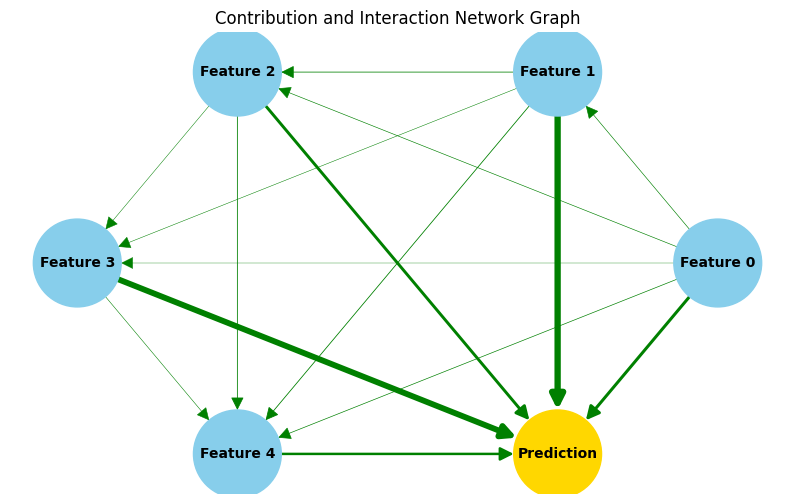

Interaction Network for Base Estimator 2:


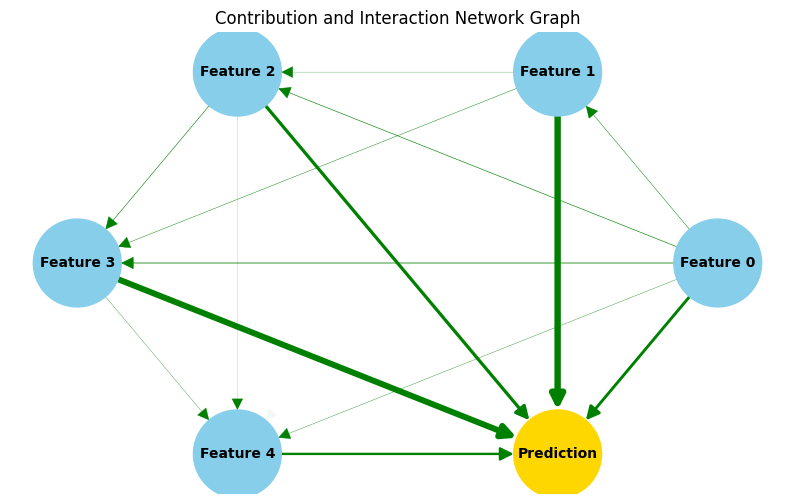

Interaction Network for Base Estimator 3:


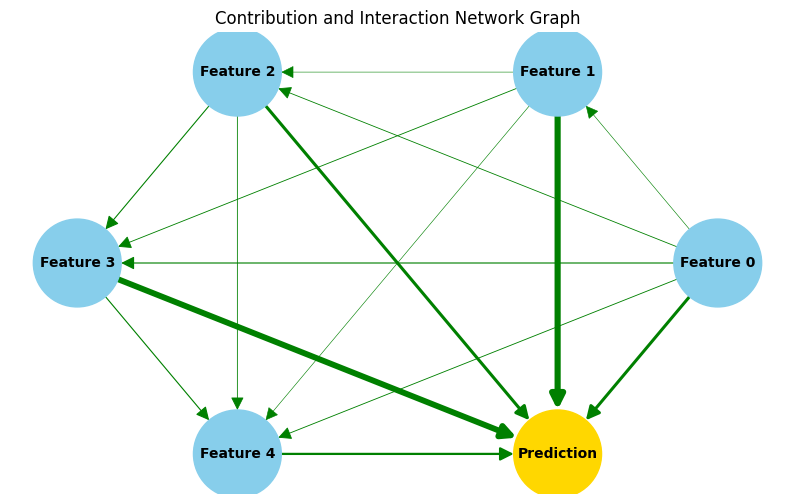

Interaction Network for Base Estimator 4:


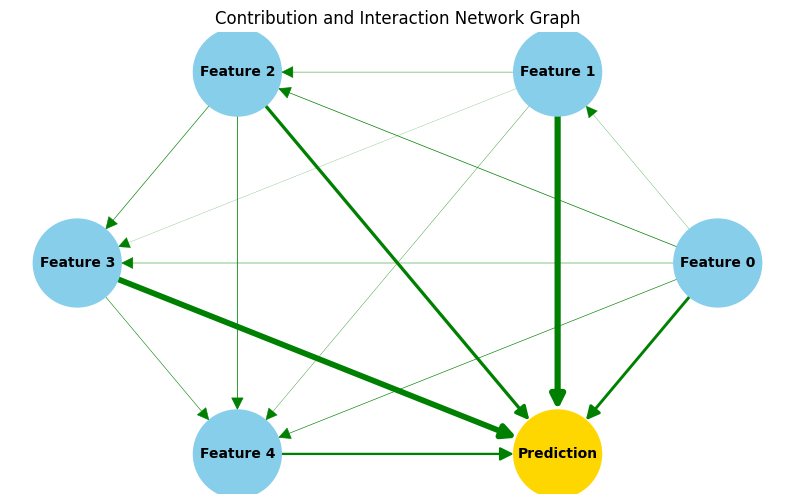

Interaction Network for Base Estimator 5:


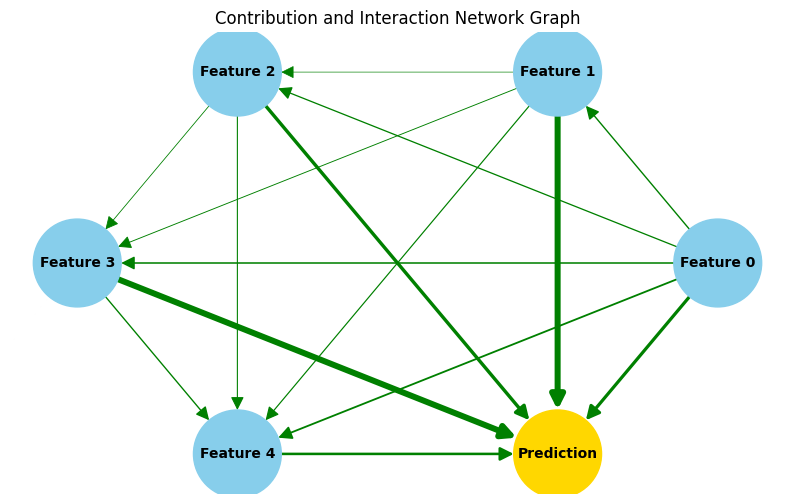

Interaction Network for Base Estimator 6:


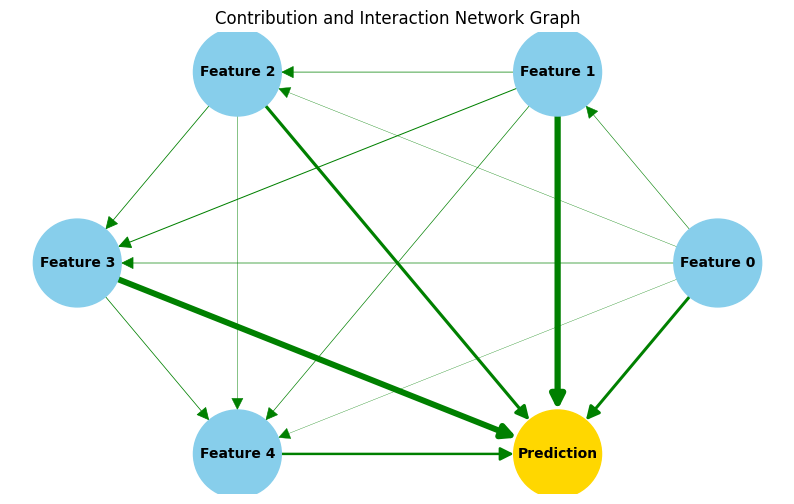

Interaction Network for Base Estimator 7:


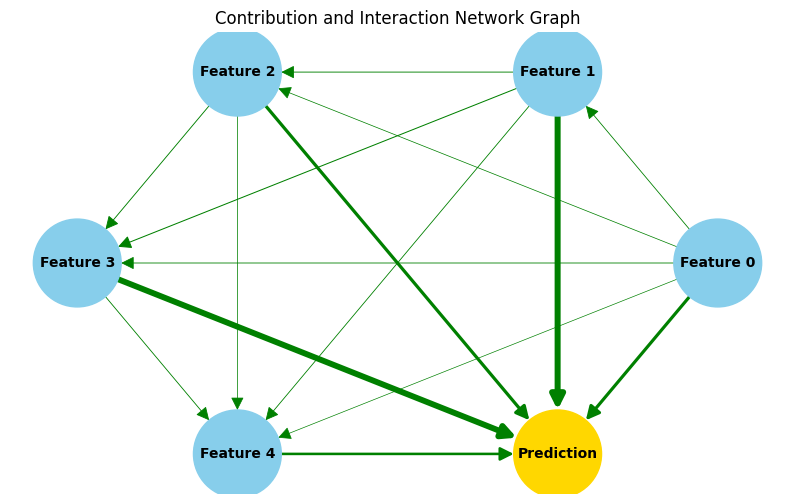

Interaction Network for Base Estimator 8:


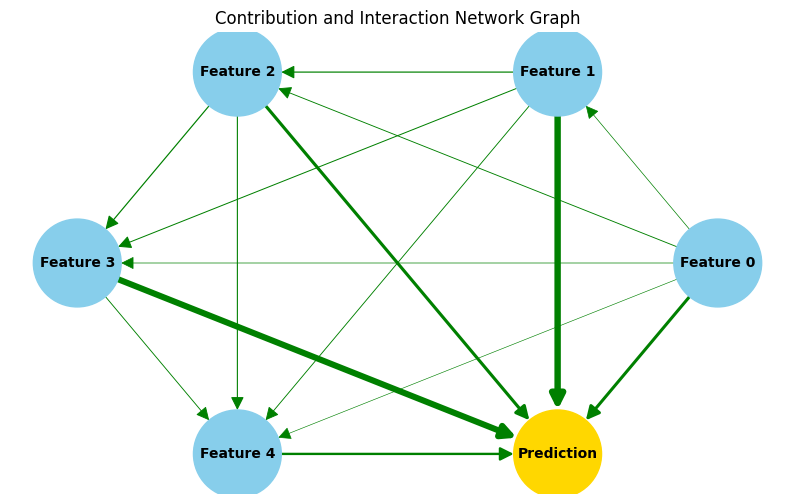

Interaction Network for Base Estimator 9:


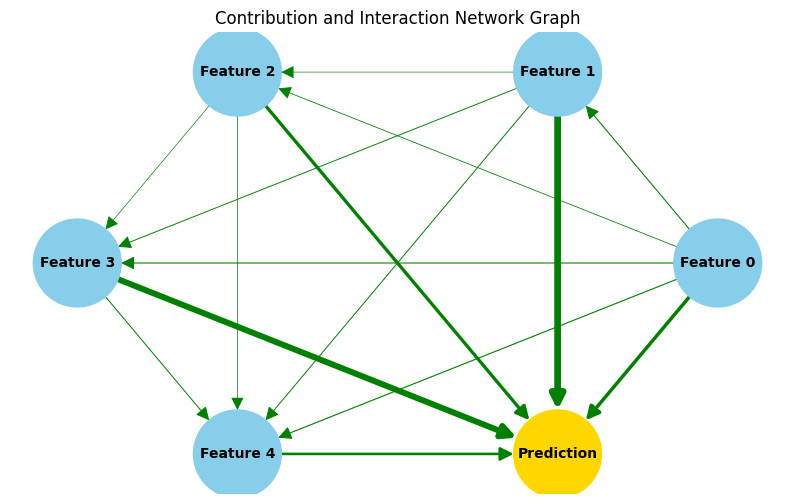

In [12]:
import networkx as nx
import matplotlib.pyplot as plt
import matplotlib.colors as mcolors

def plot_interaction_network(feature_importances, interaction_effects_list, feature_names=None, instance_index=0):
    # Check if ensemble logic was applied
    if isinstance(feature_importances, list):
        # Ensemble case: feature_importances is a list of numpy arrays
        for estimator_idx, (est_contributions, est_interaction_effects) in enumerate(zip(feature_importances, interaction_effects_list)):
            print(f"Interaction Network for Base Estimator {estimator_idx}:")
            # Assuming `est_contributions` is a 1D array of contributions for each instance
            _plot_interaction_network(est_contributions, est_interaction_effects, feature_names, instance_index)
    else:
        # Single model case: Plot interaction network
        # Assuming `contributions` is a 1D array of contributions for each instance
        _plot_interaction_network(feature_importances, interaction_effects_list, feature_names, instance_index)

def _plot_interaction_network(contributions, interaction_effects, feature_names=None, instance_index=0):
    # Determine the number of selected features
    num_selected_features = contributions.shape[0]

    # Automatically generate feature names if not provided
    if feature_names is None:
        feature_names = [f'Feature {j}' for j in range(num_selected_features)]

    # Create a network graph
    G = nx.DiGraph()

    # Add nodes for features
    G.add_nodes_from(feature_names)

    # Add node for prediction
    G.add_node('Prediction')

    # Add edges for individual contributions
    for i, contrib in enumerate(contributions):
        G.add_edge(feature_names[i], 'Prediction', weight=abs(contrib), sign=contrib)

    # Add edges for pairwise interactions
    for i in range(num_selected_features):
        for j in range(i+1, num_selected_features):
            interaction_value = interaction_effects[i, j]
            if interaction_value != 0:
                G.add_edge(feature_names[i], feature_names[j], weight=abs(interaction_value), sign=interaction_value)

    # Set edge colors based on the sign of interactions/contributions
    cmap = mcolors.LinearSegmentedColormap.from_list("", ["red", "white", "green"])
    edge_colors = [cmap(G[u][v]['sign'] / 2 + 0.5) for u, v in G.edges()]

    # Set edge width based on the weight of interactions/contributions (scaled down by a factor)
    edge_widths = [G[u][v]['weight'] * 0.1 for u, v in G.edges()]

    # Set node colors (features in blue, prediction in yellow)
    node_colors = ['skyblue' if node in feature_names else 'gold' for node in G.nodes()]

    # Draw the network graph
    plt.figure(figsize=(10, 6))
    plt.gca().set_facecolor("#f0f0f0")
    pos = nx.circular_layout(G)
    nx.draw(G, pos, with_labels=True, node_size=4000, node_color=node_colors,
            font_size=10, font_weight='bold', font_color='black',
            edge_color=edge_colors, width=edge_widths, arrowstyle='-|>', arrowsize=20)
    plt.title('Contribution and Interaction Network Graph')
    plt.show()

# Obtain feature importances and interaction effects using the get_feature_importance method
feature_importances, interaction_effects_list = SPINEXRegressor.get_feature_importance(X)

# Plot the network graph for the first instance
plot_interaction_network(feature_importances, interaction_effects_list, instance_index=0)

# If you want to plot the network graph for other instances, you can change the instance_index. For example, to plot for the second instance:
plot_interaction_network(feature_importances, interaction_effects_list, instance_index=1)


In [13]:
def plot_vertical_bar(feature_importances, interaction_effects_list, feature_names=None, instances_to_plot=None):
    # Check if ensemble logic was applied
    if isinstance(feature_importances, list):
        # Ensemble case: feature_importances is a list of numpy arrays
        for estimator_idx, (est_contributions, est_interaction_effects) in enumerate(zip(feature_importances, interaction_effects_list)):
            # If instances_to_plot is not provided, plot all instances
            if instances_to_plot is None:
                instances_to_plot = range(len(est_contributions))

            # Automatically generate feature names if not provided
            if feature_names is None:
                feature_names = [f'Feature {j}' for j in range(len(est_contributions[0]))]

            # Iterate over each instance specified in instances_to_plot
            for i in instances_to_plot:
                # Get individual feature contributions for the current instance
                instance_contributions = est_contributions[i]

                # Calculate the sum of the absolute pairwise interaction effects for the current instance
                interaction_sum = 0
                for j in range(len(est_contributions[0])):
                    for k in range(j+1, len(est_contributions[0])):
                        interaction_sum += np.abs(est_interaction_effects[j][k][i])

                # Append the sum of interactions to the instance_contributions
                all_contributions = np.append(instance_contributions, interaction_sum)

                # Normalize contributions
                all_contributions = all_contributions / np.sum(np.abs(all_contributions))

                # Create tick labels
                tick_labels = feature_names.copy()
                tick_labels.append('Interaction Sum')

                # Plot the bar chart with tick labels and normalized y-axis
                plt.figure(figsize=(10, 6))
                plt.bar(range(len(all_contributions)), all_contributions, tick_label=tick_labels)
                plt.ylabel('Contribution to Prediction (Normalized)')
                plt.title(f'Bar Chart for Instance {i} of Base Estimator {estimator_idx}')
                plt.show()
    else:
        # Single model case: feature_importances is a 1D numpy array
        # If instances_to_plot is not provided, plot all instances
        if instances_to_plot is None:
            instances_to_plot = range(len(feature_importances))

        # Automatically generate feature names if not provided
        if feature_names is None:
            feature_names = [f'Feature {j}' for j in range(len(feature_importances))]

        # Iterate over each instance specified in instances_to_plot
        for i in instances_to_plot:
            # Get individual feature contributions for the current instance
            instance_contributions = feature_importances

            # Calculate the sum of the absolute pairwise interaction effects for the current instance
            interaction_sum = 0
            for j in range(len(feature_importances)):
                for k in range(j+1, len(feature_importances)):
                    interaction_sum += np.abs(interaction_effects_list[j][k])

            # Append the sum of interactions to the instance_contributions
            all_contributions = np.append(instance_contributions, interaction_sum)

            # Normalize contributions
            all_contributions = all_contributions / np.sum(np.abs(all_contributions))

            # Create tick labels
            tick_labels = feature_names.copy()
            tick_labels.append('Interaction Sum')

            # Plot the bar chart with tick labels and normalized y-axis
            plt.figure(figsize=(10, 6))
            plt.bar(range(len(all_contributions)), all_contributions, tick_label=tick_labels)
            plt.ylabel('Contribution to Prediction (Normalized)')
            plt.title(f'Bar Chart for Instance {i}')
            plt.show()


In [14]:
class LocalSPINEX(SPINEX):
    def get_local_explanation(self, X, instance_to_explain):
        # The existing part of the method remains the same...
        distances = self._calculate_feature_combination_distances(X[instance_to_explain].reshape(1, -1), self.X_train_)
        nearest_indices = np.argsort(distances, axis=1)[:, :self.n_neighbors].flatten()
        neighbor_counts = Counter(nearest_indices)
        feature_importances = np.zeros(X.shape[1])
        for feature_combination in self.feature_combinations:
            combination_distances = np.sum(np.abs(self.X_train_[:, feature_combination] - X[instance_to_explain, feature_combination]), axis=1)
            nearest_indices = np.argsort(combination_distances)[:self.n_neighbors]
            for feature in feature_combination:
                feature_importances[feature] += sum(neighbor_counts[index] for index in nearest_indices)
                
        # Normalize feature importances
        feature_importances = feature_importances / np.sum(feature_importances)
        
        return neighbor_counts, feature_importances

    def visualize_feature_importances(self, local_importances, global_importances, feature_names):
        # Convert feature importances to percentages
        local_importances_percentage = local_importances * 100
        global_importances_percentage = global_importances * 100

        # Create a DataFrame for easier plotting
        df = pd.DataFrame({
            'Feature': feature_names,
            'Local Importance (%)': local_importances_percentage,
            'Global Importance (%)': global_importances_percentage
        })

        # Melt the DataFrame for easier plotting
        df_melted = df.melt(id_vars='Feature', var_name='Importance Type', value_name='Importance (%)')

        # Create a bar plot of feature importances
        plt.figure(figsize=(15, 8))
        sns.barplot(data=df_melted, x='Importance (%)', y='Feature', hue='Importance Type', palette='viridis')
        plt.title('Feature Importances')
        plt.xlabel('Importance (%)')
        plt.ylabel('Feature')
        plt.show()

    def visualize_neighbor_counts(self, neighbor_counts):
        # Create a DataFrame for easier plotting
        df = pd.DataFrame({
            'Neighbor': list(neighbor_counts.keys()),
            'Count': list(neighbor_counts.values())
        })

        # Sort the DataFrame by count
        df = df.sort_values(by='Count', ascending=False)

        # Create a bar plot of neighbor counts
        plt.figure(figsize=(10, 6))
        sns.barplot(data=df, x='Count', y='Neighbor', palette='viridis')
        plt.title('Neighbor Counts')
        plt.xlabel('Count')
        plt.ylabel('Neighbor')
        plt.show()

    def get_local_interaction_effects(self, X, instance_to_explain):
        distances = self._calculate_feature_combination_distances(X[instance_to_explain].reshape(1, -1), self.X_train_)
        nearest_indices = np.argsort(distances, axis=1)[:, :self.n_neighbors].flatten()
        interaction_effects = []
        for feature_combination in self.feature_combinations:
            avg_neighbor_value = np.mean(self.X_train_[nearest_indices][:, feature_combination])
            instance_value = X[instance_to_explain, feature_combination]
            effect = np.abs(avg_neighbor_value - instance_value)
            mean_effect = np.mean(effect)
            interaction_effects.append({
                'Feature Combination': '-'.join(str(x) for x in feature_combination),
                'Interaction Effect': mean_effect
            })
        return pd.DataFrame(interaction_effects)

    def visualize_interaction_effects(self, interaction_effects_df):
        # Sort the DataFrame by interaction effect
        df = interaction_effects_df.sort_values(by='Interaction Effect', ascending=False)

        # Create a bar plot of interaction effects
        plt.figure(figsize=(10, 6))
        sns.barplot(data=df, x='Interaction Effect', y='Feature Combination', palette='viridis')
        plt.title('Interaction Effects')
        plt.xlabel('Effect')
        plt.ylabel('Feature Combination')
        plt.show()

    def plot_prediction_change(self, X, y, instance_to_explain):
        # Calculate distances based on feature combinations
        distances = self._calculate_feature_combination_distances(X[instance_to_explain].reshape(1, -1), self.X_train_)
        
        # Find the indices of the nearest neighbors in ascending order
        sorted_indices = np.argsort(distances, axis=1).flatten()
        
        # Calculate the prediction change with each added neighbor
        prediction_changes = np.zeros(self.n_neighbors)
        for i in range(self.n_neighbors):
            nearest_indices = sorted_indices[:i+1]
            decayed_distance_threshold = self.distance_threshold * self.distance_threshold_decay
            nearest_distances = distances[0, nearest_indices]
            weights = 1 / (nearest_distances + decayed_distance_threshold)
            nearest_targets = self.y_train_[nearest_indices]
            prediction = np.sum(nearest_targets * weights) / np.sum(weights)
            prediction_changes[i] = prediction
        
        # Get the final prediction and the ground truth
        final_prediction = self.predict(X[instance_to_explain].reshape(1, -1))
        ground_truth = y[instance_to_explain]
        
        # Plot the prediction change with each added neighbor
        plt.figure(figsize=(10, 7))
        plt.plot(range(1, self.n_neighbors+1), prediction_changes, label='Predictions')
        plt.axhline(final_prediction, color='r', linestyle='--', label='Final Prediction')
        plt.axhline(ground_truth, color='g', linestyle='--', label='Ground Truth')
        plt.title('Prediction Change with Each Added Neighbor')
        plt.xlabel('Number of Neighbors')
        plt.ylabel('Prediction')
        plt.legend()
        plt.show()

    def plot_feature_pair_influence(self, X, instance_to_explain, feature_pair, grid_size=20):
        # Generate a grid of values for the feature pair
        feature_grid = np.meshgrid(np.linspace(X[:, feature_pair[0]].min(), X[:, feature_pair[0]].max(), grid_size),
                                  np.linspace(X[:, feature_pair[1]].min(), X[:, feature_pair[1]].max(), grid_size))

        # Create a new array of instances with the grid values replacing the original feature values
        instance_repeated = np.repeat(X[instance_to_explain].reshape(1, -1), grid_size * grid_size, axis=0)
        instance_repeated[:, feature_pair[0]] = feature_grid[0].flatten()
        instance_repeated[:, feature_pair[1]] = feature_grid[1].flatten()

        # Calculate the prediction for each instance in the grid
        predictions = self.predict(instance_repeated)
        prediction_grid = predictions.reshape(grid_size, grid_size)

        # Plot the influence of the feature pair
        fig = plt.figure(figsize=(12, 8))
        ax = fig.add_subplot(111, projection='3d')  # Updated line
        surf = ax.plot_surface(feature_grid[0], feature_grid[1], prediction_grid, cmap=cm.coolwarm,
                              linewidth=0, antialiased=False)

        # Add labels and title
        ax.set_xlabel(f'Feature {feature_pair[0]+1}')
        ax.set_ylabel(f'Feature {feature_pair[1]+1}')
        ax.set_zlabel('Prediction')
        plt.title('Influence of Feature Pair on Prediction')
        fig.colorbar(surf, shrink=0.5, aspect=5)

        plt.show()

    def plot_feature_triplet_influence(self, X, instance_to_explain, feature_triplet, feature_names, grid_size=20):
        # Generate a grid of values for the feature triplet
        feature_grid = np.meshgrid(np.linspace(X[:, feature_triplet[0]].min(), X[:, feature_triplet[0]].max(), grid_size),
                                  np.linspace(X[:, feature_triplet[1]].min(), X[:, feature_triplet[1]].max(), grid_size),
                                  np.linspace(X[:, feature_triplet[2]].min(), X[:, feature_triplet[2]].max(), grid_size))

        # Create a new array of instances with the grid values replacing the original feature values
        instance_repeated = np.repeat(X[instance_to_explain].reshape(1, -1), grid_size * grid_size * grid_size, axis=0)
        instance_repeated[:, feature_triplet[0]] = feature_grid[0].flatten()
        instance_repeated[:, feature_triplet[1]] = feature_grid[1].flatten()
        instance_repeated[:, feature_triplet[2]] = feature_grid[2].flatten()

        # Calculate the prediction for each instance in the grid
        predictions = self.predict(instance_repeated)
        prediction_grid = predictions.reshape(grid_size, grid_size, grid_size)

        # Plot the influence of the feature triplet
        fig = plt.figure(figsize=(12, 8))
        ax = fig.add_subplot(111, projection='3d')  # Updated line
        surf = ax.scatter(feature_grid[0], feature_grid[1], feature_grid[2], c=prediction_grid.flatten(), cmap=cm.coolwarm)

        # Add labels and title
        ax.set_xlabel(feature_names[feature_triplet[0]])
        ax.set_ylabel(feature_names[feature_triplet[1]])
        ax.set_zlabel(feature_names[feature_triplet[2]])
        plt.title('Influence of Feature Triplet on Prediction')
        fig.colorbar(surf, shrink=0.5, aspect=5)

        plt.show()        


    def explore_local_changes(self, X, instance_to_explain, feature_to_explore, grid_size=100, feature_range=None):
        # Create a grid of feature values around the actual feature value of the instance
        if feature_range is None:
            feature_min = X[:, feature_to_explore].min()
            feature_max = X[:, feature_to_explore].max()
        else:
            feature_min, feature_max = feature_range
        feature_values = np.linspace(feature_min, feature_max, grid_size)
        
        # Initialize a new dataset with the feature values replaced by the grid values
        X_new = np.repeat(X[instance_to_explain:instance_to_explain+1], grid_size, axis=0)
        X_new[:, feature_to_explore] = feature_values

        # Make predictions for the new dataset
        predictions = self.predict(X_new)

        # Return the feature values and predictions
        return feature_values, predictions

    def plot_local_changes(self, X, instance_to_explain, feature_to_explore, grid_size=100, feature_range=None, feature_name=None):
        # Explore local changes
        feature_values, predictions = self.explore_local_changes(X, instance_to_explain, feature_to_explore, grid_size, feature_range)

        # Plot the prediction as a function of the feature values
        plt.figure(figsize=(10, 6))
        plt.plot(feature_values, predictions, label='Predictions')
        plt.scatter(X[instance_to_explain, feature_to_explore], self.predict(X[instance_to_explain:instance_to_explain+1]), color='red', label='Actual Value')
        plt.xlabel(feature_name if feature_name is not None else f'Feature {feature_to_explore}')
        plt.ylabel('Prediction')
        plt.legend()
        plt.grid(True)
        plt.title('Local Changes in Prediction')
        plt.show()

    def explore_all_local_changes(self, X, instance_to_explain, grid_size=100, feature_range=None):
        # Create a new figure
        fig, ax = plt.subplots(figsize=(10, 7))

        # Explore local changes for all features
        for feature in range(X.shape[1]):
            feature_values, predictions = self.explore_local_changes(X, instance_to_explain, feature, grid_size, feature_range)
            ax.plot(feature_values, predictions, label=f'Feature {feature}')

        # Add labels, legend, and title to the plot
        ax.set_xlabel('Feature Value')
        ax.set_ylabel('Prediction')
        ax.legend()
        plt.title('Local Changes for All Features')
        plt.show()

    def explore_local_changes_for_pair(self, X, instance_to_explain, feature_pair, grid_size=100, feature_range=None):
        # Create a grid of feature values around the actual feature values of the instance
        if feature_range is None:
            feature_range = [min(X[:, i].min() for i in feature_pair), max(X[:, i].max() for i in feature_pair)]

        feature_values_1 = np.linspace(feature_range[0], feature_range[1], num=grid_size)
        feature_values_2 = np.linspace(feature_range[0], feature_range[1], num=grid_size)
        feature_grid_1, feature_grid_2 = np.meshgrid(feature_values_1, feature_values_2)

        # Create a copy of the instance for making predictions
        instances_to_predict = np.tile(X[instance_to_explain], (grid_size * grid_size, 1))
        instances_to_predict[:, feature_pair[0]] = feature_grid_1.flatten()
        instances_to_predict[:, feature_pair[1]] = feature_grid_2.flatten()

        # Make predictions for all instances
        predictions = self.predict(instances_to_predict)
        prediction_grid = predictions.reshape(grid_size, grid_size)

        # Plot the influence of the feature pair
        fig = plt.figure(figsize=(12, 8))
        ax = fig.add_subplot(111, projection='3d')
        surf = ax.plot_surface(feature_grid_1, feature_grid_2, prediction_grid, cmap=cm.coolwarm, linewidth=0, antialiased=False)

        # Add labels and title to the plot
        ax.set_xlabel(f'Feature {feature_pair[0]} Value')
        ax.set_ylabel(f'Feature {feature_pair[1]} Value')
        ax.set_zlabel('Prediction')
        plt.title('Local Changes for Feature Pair')
        fig.colorbar(surf, shrink=0.5, aspect=5)
        plt.show()

    def explore_local_changes_for_triplet(self, X, instance_to_explain, feature_triplet, grid_size=10, feature_range=None):
        # Create a grid of feature values around the actual feature values of the instance
        feature_ranges = []
        for feature in feature_triplet:
            if feature_range is None:
                feature_range = [X[:, feature].min(), X[:, feature].max()]
            feature_ranges.append(np.linspace(feature_range[0], feature_range[1], num=grid_size))

        feature_grid_1, feature_grid_2, feature_grid_3 = np.meshgrid(*feature_ranges)

        # Create a new array of instances with the varied feature values
        varied_instances = X.copy()
        varied_instances = np.repeat(varied_instances[instance_to_explain].reshape(1, -1), grid_size**3, axis=0)
        varied_instances[:, feature_triplet[0]] = feature_grid_1.ravel()
        varied_instances[:, feature_triplet[1]] = feature_grid_2.ravel()
        varied_instances[:, feature_triplet[2]] = feature_grid_3.ravel()

        # Make predictions for the varied instances
        predictions = self.predict(varied_instances)

        # Create a 3D plot
        fig = plt.figure(figsize=(12, 8))
        ax = fig.add_subplot(111, projection='3d')
        p = ax.scatter(feature_grid_1, feature_grid_2, feature_grid_3, c=predictions, cmap='viridis')
        fig.colorbar(p, ax=ax, label='Prediction')

        # Add labels and title
        ax.set_xlabel('Feature ' + str(feature_triplet[0]))
        ax.set_ylabel('Feature ' + str(feature_triplet[1]))
        ax.set_zlabel('Feature ' + str(feature_triplet[2]))
        plt.title('Local Changes for Feature Triplet')
        plt.show()

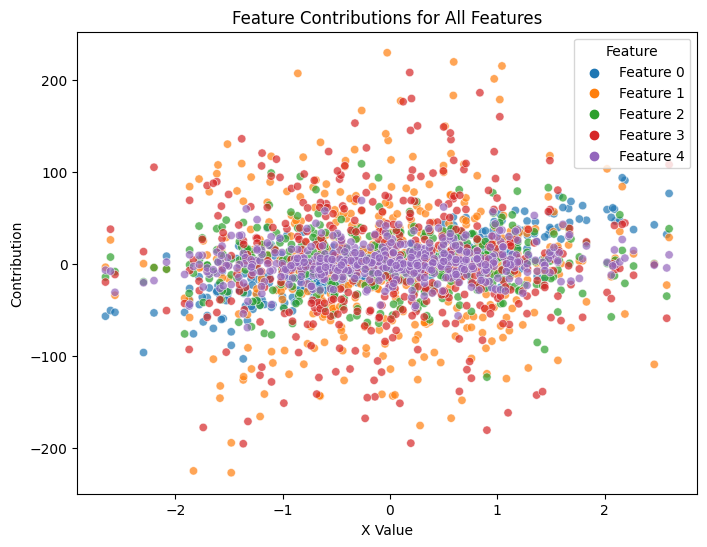

In [15]:
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt

def plot_all_feature_contributions(model, X):
    _, contributions, _ = model.predict_contributions(X)

    # Create a DataFrame with the feature values and contributions
    data = pd.DataFrame(contributions, columns=[f'Feature {i}' for i in range(X.shape[1])])

    # Melt the DataFrame to a long format
    data = data.melt(var_name='Feature', value_name='Contribution')

    # Create a new column for the x-axis values (same for all features)
    data['X Value'] = np.tile(X[:, 0], X.shape[1])  # Replace 0 with the index of the feature you want to use for the x-axis

    # Use seaborn's scatterplot function to plot the data
    plt.figure(figsize=(8, 6))
    sns.scatterplot(data=data, x='X Value', y='Contribution', hue='Feature', alpha=0.7)
    plt.title('Feature Contributions for All Features')
    plt.show()

# Assuming you have your training data in X_train and y_train
model = SPINEX()  # Initialize your model
model.fit(X, y)

plot_all_feature_contributions(model, X)


In [16]:
# Instantiate and fit the SPINEX model (code provided earlier)

# Obtain the average interaction effects using the get_global_interaction_effects method
avg_interaction_effects_list = SPINEXRegressor.get_global_interaction_effects(X)

# Obtain the impact of feature combinations using the feature_combination_impact_analysis method
feature_combination_impact_list = SPINEXRegressor.feature_combination_impact_analysis(X)

# Check if ensemble logic was applied
if isinstance(avg_interaction_effects_list, list):
    # Ensemble case: avg_interaction_effects_list and feature_combination_impact_list are lists
    for estimator_idx, (avg_interaction_effects, feature_combination_impact) in enumerate(zip(avg_interaction_effects_list, feature_combination_impact_list)):
        print(f"Base Estimator {estimator_idx} in SPINEX:")
        
        # Display the average interaction effects matrix
        print("  Average Interaction Effects:")
        print(avg_interaction_effects)

        # Display the impact of feature combinations
        print("\n  Feature Combination Impact Analysis:")
        for comb, impact in feature_combination_impact:
            # Convert feature indices to names, assuming original names are like 'Feature 0', 'Feature 1', etc.
            feature_names = [f"Feature {i}" for i in comb]
            print(f"  Feature Combination {feature_names}: Impact = {impact:.4f}")
else:
    # Single model case: avg_interaction_effects_list and feature_combination_impact_list are not lists
    avg_interaction_effects = avg_interaction_effects_list
    feature_combination_impact = feature_combination_impact_list
    
    # Display the average interaction effects matrix
    print("Average Interaction Effects:")
    print(avg_interaction_effects)

    # Display the impact of feature combinations
    print("\nFeature Combination Impact Analysis:")
    for comb, impact in feature_combination_impact:
        # Convert feature indices to names, assuming original names are like 'Feature 0', 'Feature 1', etc.
        feature_names = [f"Feature {i}" for i in comb]
        print(f"Feature Combination {feature_names}: Impact = {impact:.4f}")


Base Estimator 0 in SPINEX:
  Average Interaction Effects:
[[ 0.         -2.29937202 -0.39461273 -1.70586536  0.47415923]
 [-2.29937202  0.          2.44104178 -3.19956118  1.14888417]
 [-0.39461273  2.44104178  0.          2.0422374  -0.33753932]
 [-1.70586536 -3.19956118  2.0422374   0.          0.57127036]
 [ 0.47415923  1.14888417 -0.33753932  0.57127036  0.        ]]

  Feature Combination Impact Analysis:
  Feature Combination ['Feature 0', 'Feature 1', 'Feature 2', 'Feature 3', 'Feature 4']: Impact = 80.1470
  Feature Combination ['Feature 1', 'Feature 2', 'Feature 3', 'Feature 4']: Impact = 79.6792
  Feature Combination ['Feature 0', 'Feature 1', 'Feature 2', 'Feature 3']: Impact = 79.2730
  Feature Combination ['Feature 0', 'Feature 1', 'Feature 3', 'Feature 4']: Impact = 78.3889
  Feature Combination ['Feature 1', 'Feature 2', 'Feature 3']: Impact = 76.9725
  Feature Combination ['Feature 1', 'Feature 3', 'Feature 4']: Impact = 76.9462
  Feature Combination ['Feature 0', 'Fea

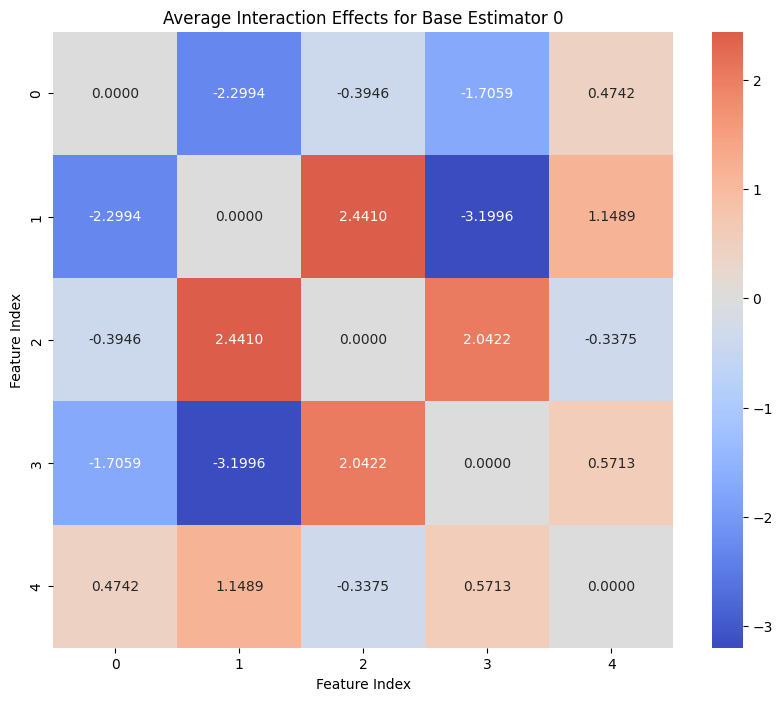

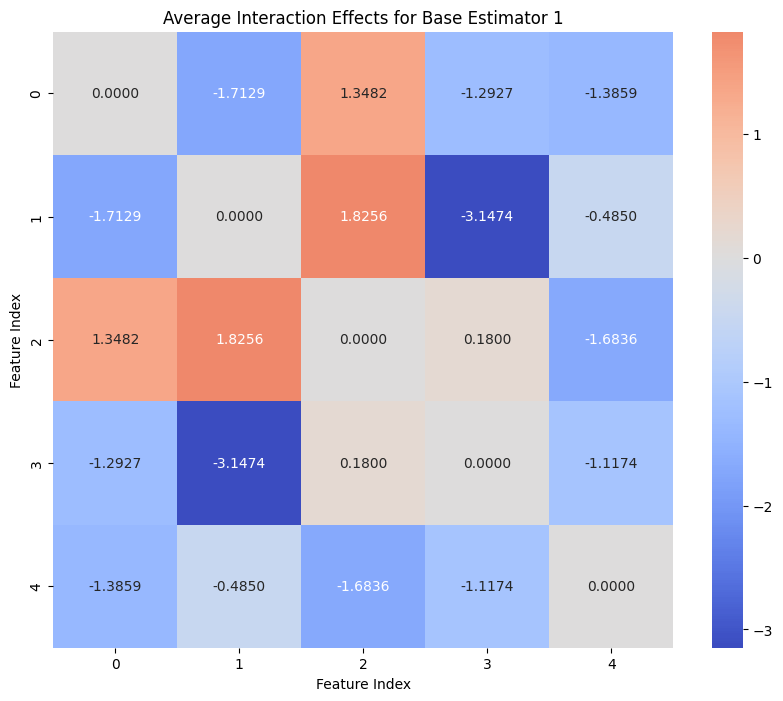

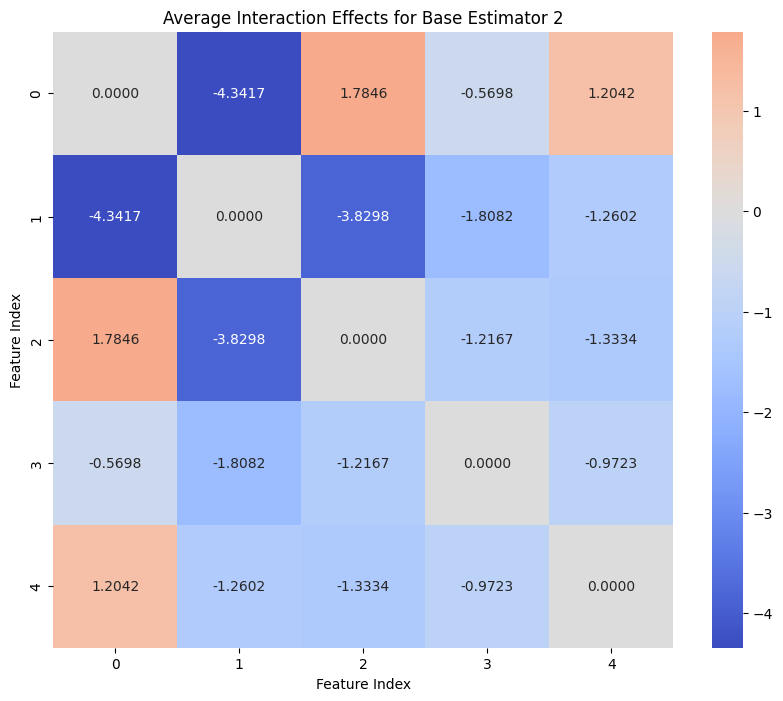

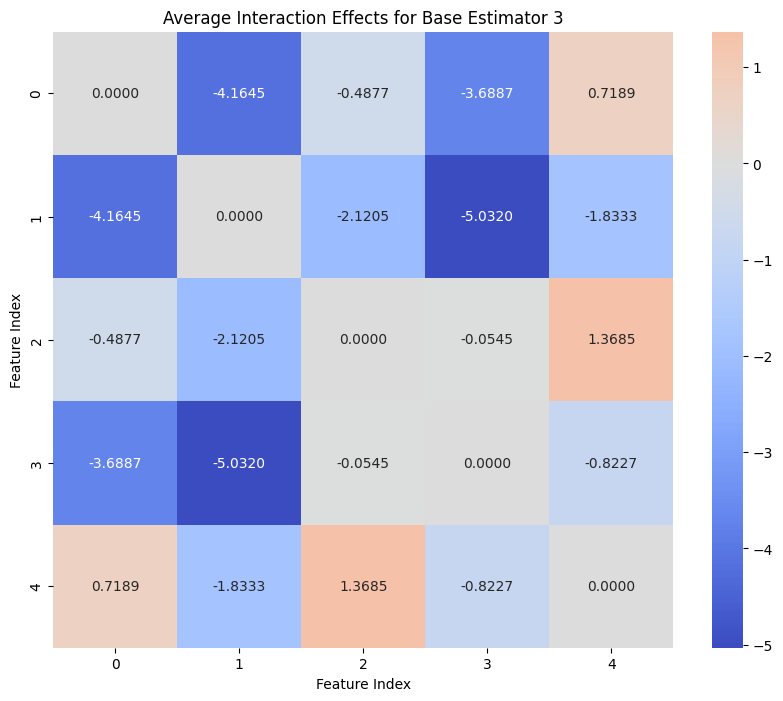

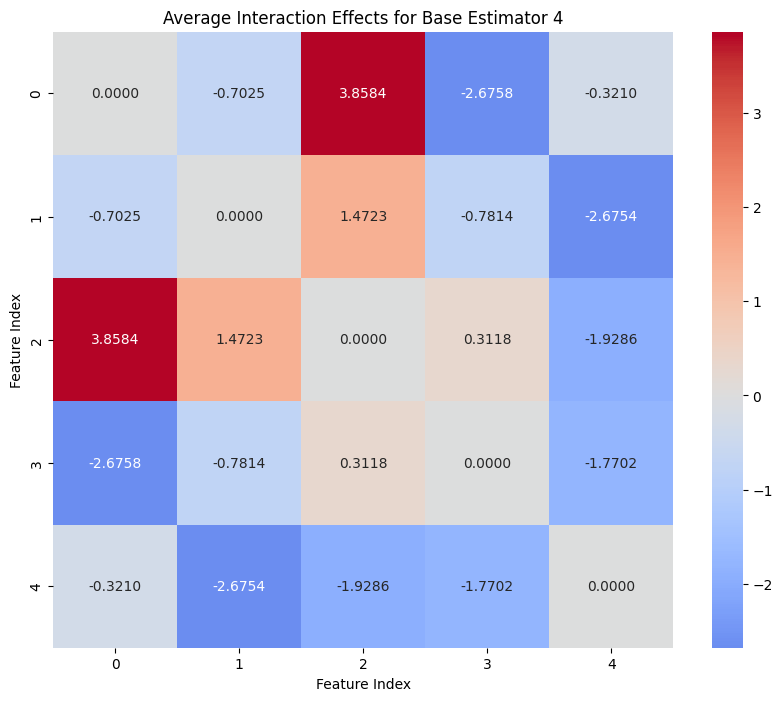

...

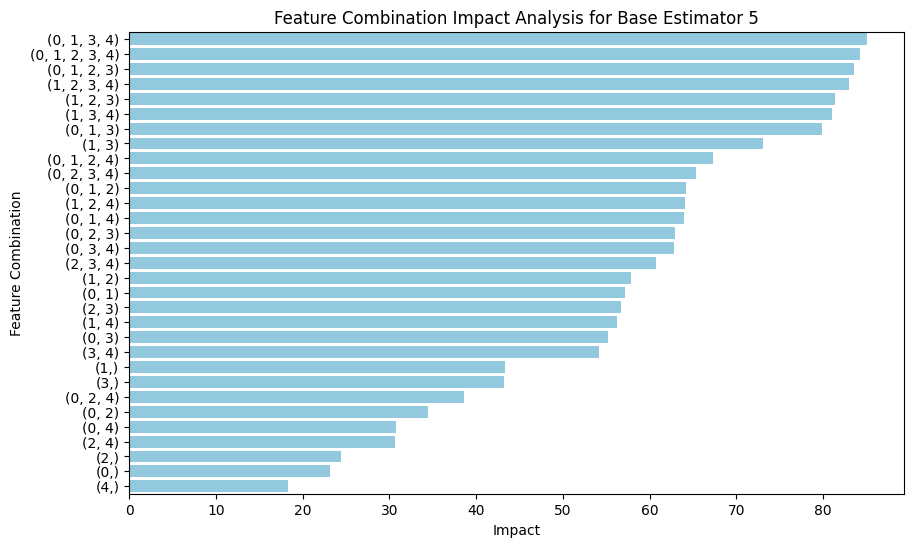

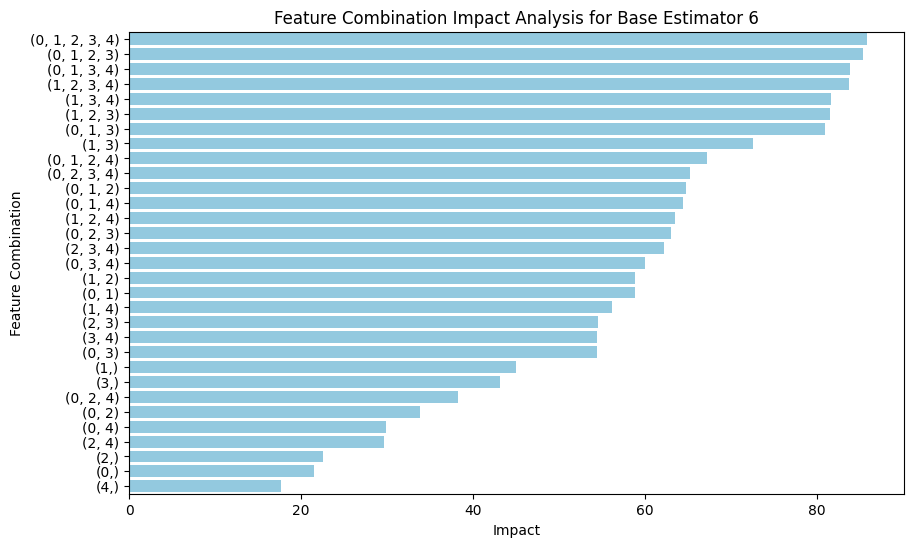

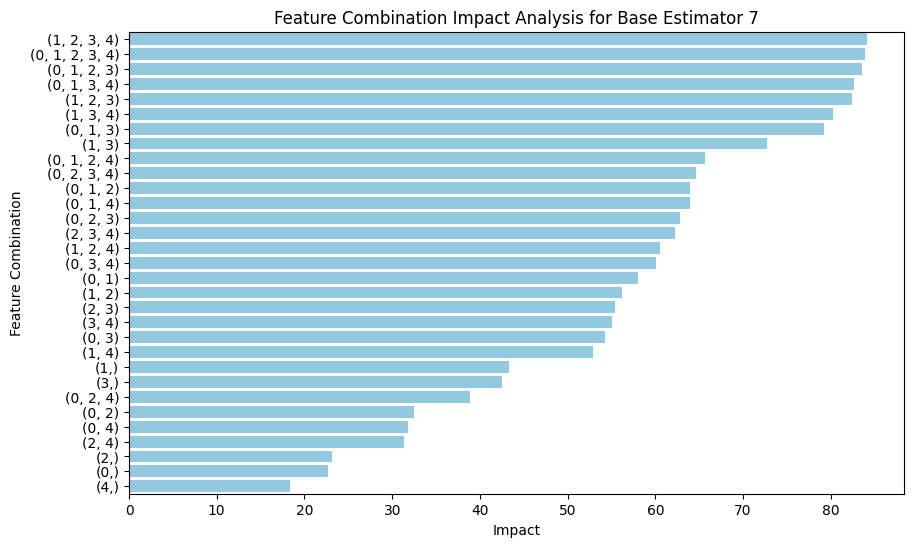

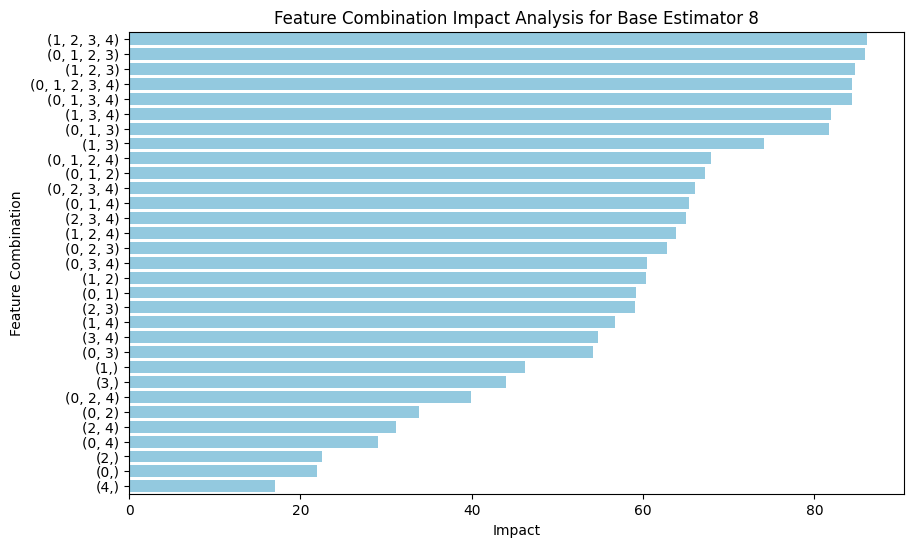

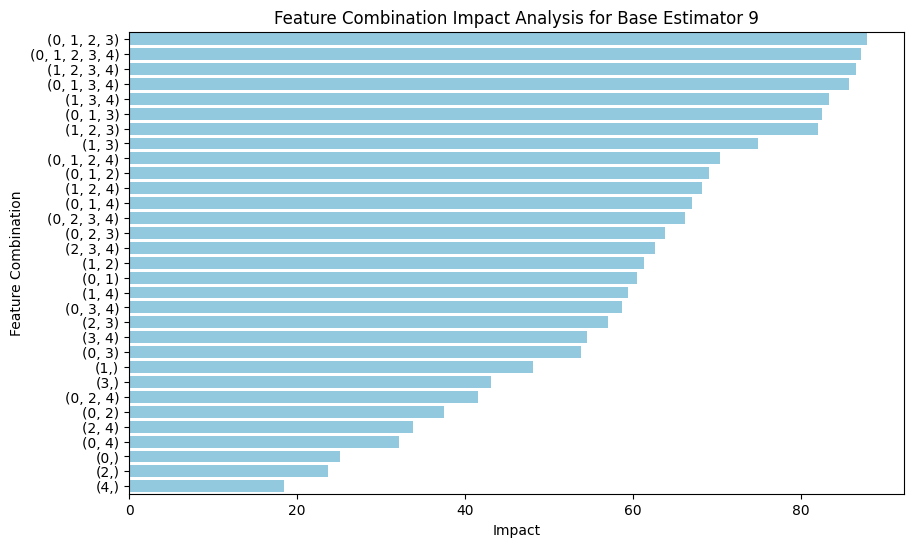

In [17]:
import matplotlib.pyplot as plt
import seaborn as sns

# Instantiate and fit the SPINEX model (code provided earlier)

# Obtain the average interaction effects using the get_global_interaction_effects method
avg_interaction_effects_list = SPINEXRegressor.get_global_interaction_effects(X)

# Check if ensemble logic was applied
if isinstance(avg_interaction_effects_list, list):
    # Ensemble case: Plot interaction effects for each base estimator
    for estimator_idx, avg_interaction_effects in enumerate(avg_interaction_effects_list):
        plt.figure(figsize=(10, 8))
        sns.heatmap(avg_interaction_effects, annot=True, fmt='.4f', cmap='coolwarm', center=0)
        plt.title(f"Average Interaction Effects for Base Estimator {estimator_idx}")
        plt.xlabel("Feature Index")
        plt.ylabel("Feature Index")
        plt.show()
else:
    # Single model case: Plot interaction effects
    plt.figure(figsize=(10, 8))
    sns.heatmap(avg_interaction_effects_list, annot=True, fmt='.4f', cmap='coolwarm', center=0)
    plt.title("Average Interaction Effects")
    plt.xlabel("Feature Index")
    plt.ylabel("Feature Index")
    plt.show()

# Obtain the average interaction effects using the get_global_interaction_effects method
avg_interaction_effects_list = SPINEXRegressor.get_global_interaction_effects(X)

# Check if ensemble logic was applied
if isinstance(avg_interaction_effects_list, list):
    # Ensemble case: Plot interaction effects for each base estimator
    for estimator_idx, avg_interaction_effects in enumerate(avg_interaction_effects_list):
        plt.figure(figsize=(10, 8))
        sns.heatmap(avg_interaction_effects, annot=True, fmt='.4f', cmap='coolwarm', center=0)
        plt.title(f"Average Interaction Effects for Base Estimator {estimator_idx}")
        plt.xlabel("Feature Index")
        plt.ylabel("Feature Index")
        plt.show()
else:
    # Single model case: Plot interaction effects
    plt.figure(figsize=(10, 8))
    sns.heatmap(avg_interaction_effects_list, annot=True, fmt='.4f', cmap='coolwarm', center=0)
    plt.title("Average Interaction Effects")
    plt.xlabel("Feature Index")
    plt.ylabel("Feature Index")
    plt.show()

# Obtain the impact of feature combinations using the feature_combination_impact_analysis method
feature_combination_impact_list = SPINEXRegressor.feature_combination_impact_analysis(X)

# Check if ensemble logic was applied
if isinstance(feature_combination_impact_list[0], list):
    # Ensemble case: Plot feature combination impact for each base estimator
    for estimator_idx, feature_combination_impact in enumerate(feature_combination_impact_list):
        feature_combinations = [str(comb) for comb, _ in feature_combination_impact]
        impact_values = [impact for _, impact in feature_combination_impact]
        plt.figure(figsize=(10, 6))
        sns.barplot(x=impact_values, y=feature_combinations, orient='h', color='skyblue')
        plt.title(f"Feature Combination Impact Analysis for Base Estimator {estimator_idx}")
        plt.xlabel("Impact")
        plt.ylabel("Feature Combination")
        plt.show()
else:
    # Single model case: Plot feature combination impact
    feature_combinations = [str(comb) for comb, _ in feature_combination_impact_list]
    impact_values = [impact for _, impact in feature_combination_impact_list]
    plt.figure(figsize=(10, 6))
    sns.barplot(x=impact_values, y=feature_combinations, orient='h', color='skyblue')
    plt.title("Feature Combination Impact Analysis")
    plt.xlabel("Impact")
    plt.ylabel("Feature Combination")
    plt.show()


Interaction Network for Base Estimator 0:


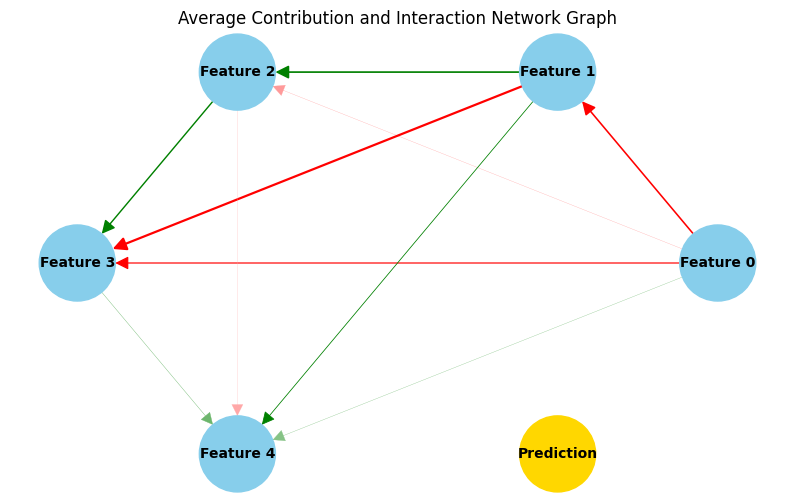

Interaction Network for Base Estimator 1:


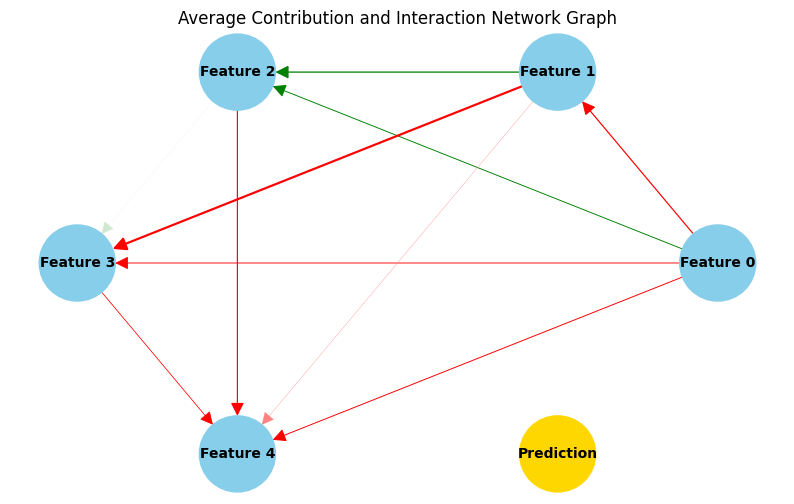

Interaction Network for Base Estimator 2:


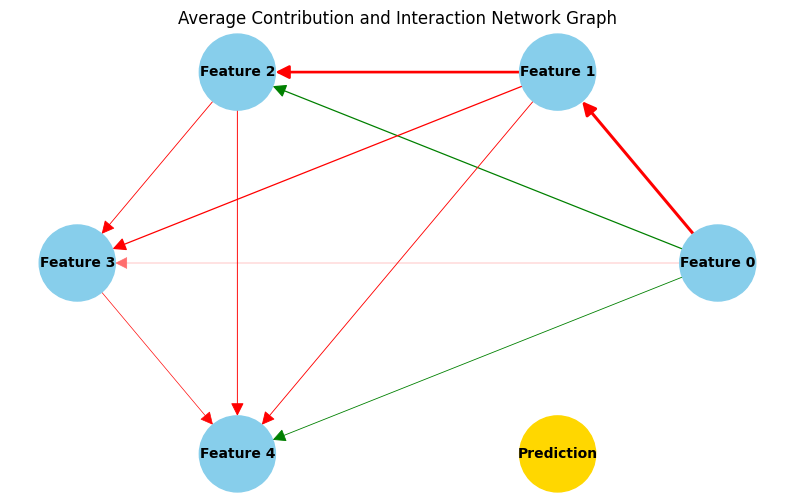

Interaction Network for Base Estimator 3:


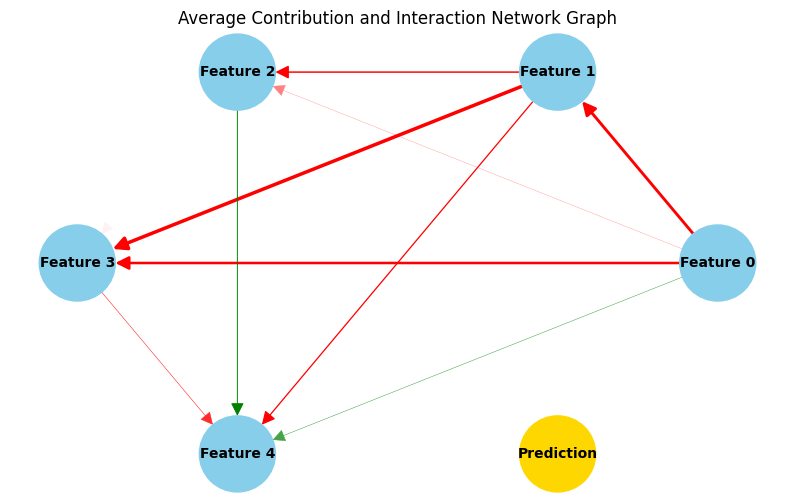

Interaction Network for Base Estimator 4:


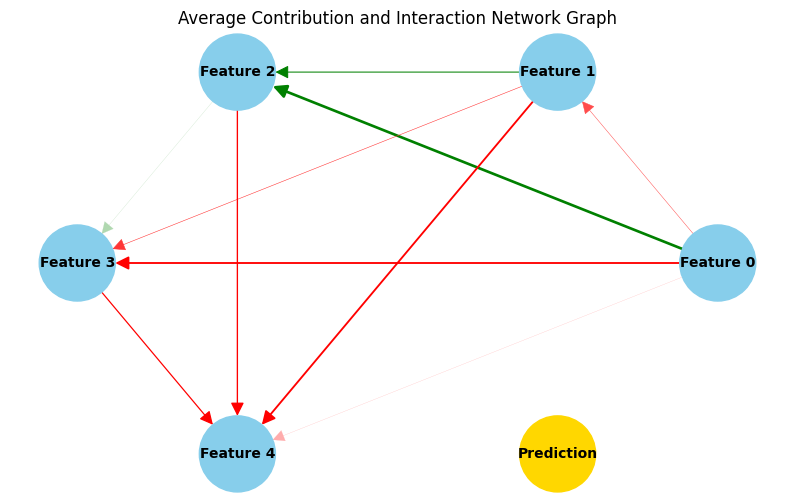

Interaction Network for Base Estimator 5:


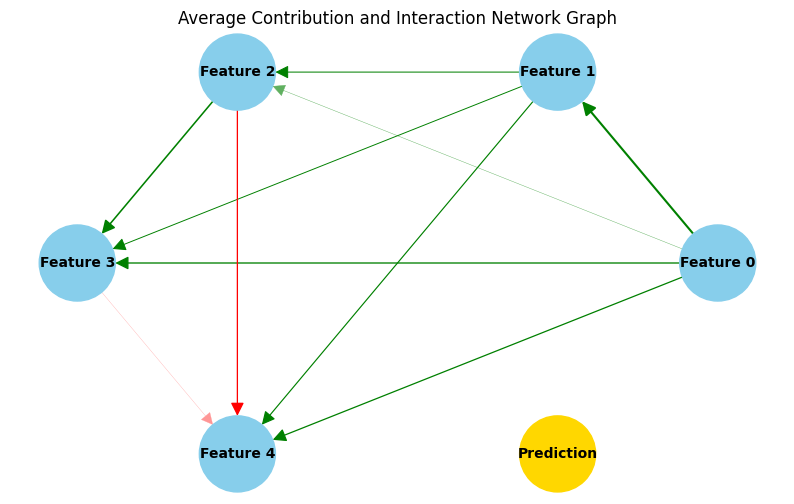

Interaction Network for Base Estimator 6:


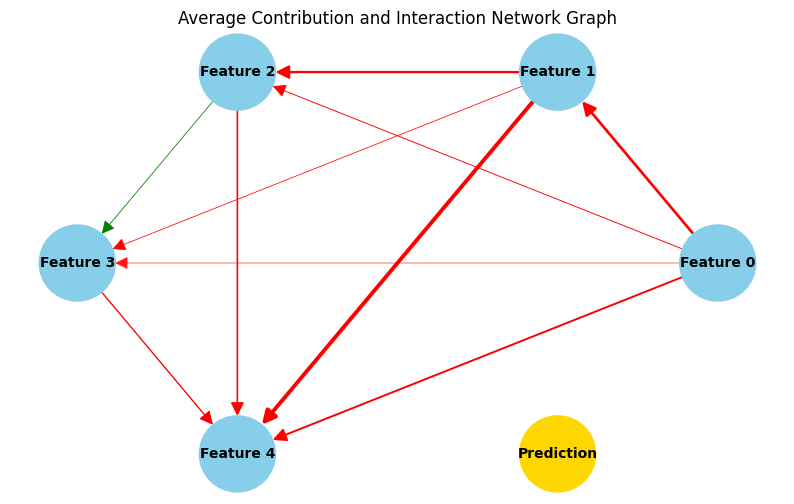

Interaction Network for Base Estimator 7:


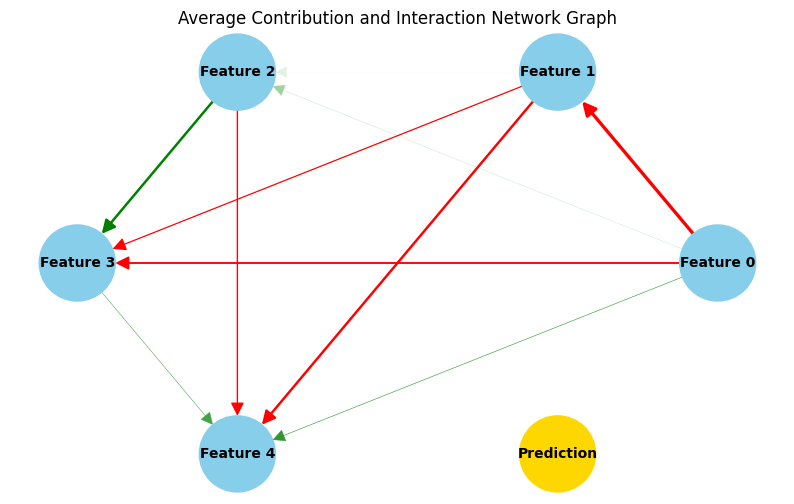

Interaction Network for Base Estimator 8:


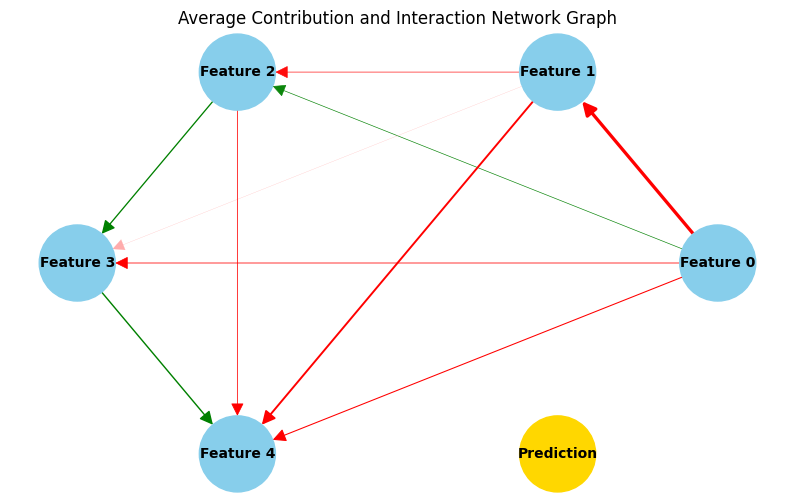

Interaction Network for Base Estimator 9:


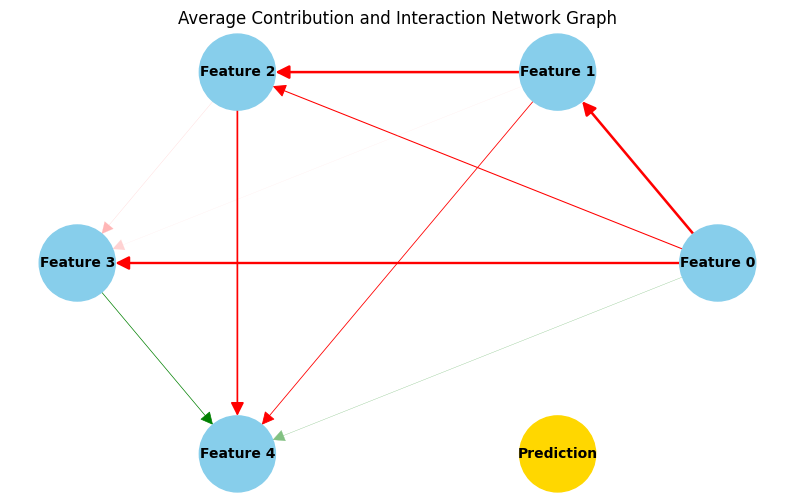

In [18]:
import networkx as nx
import numpy as np

def plot_average_interaction_network(avg_interaction_effects, feature_names=None):
    # Determine the number of selected features
    num_selected_features = avg_interaction_effects.shape[0]

    # Automatically generate feature names if not provided
    if feature_names is None:
        feature_names = [f'Feature {j}' for j in range(num_selected_features)]

    # Create a network graph
    G = nx.DiGraph()

    # Add nodes for features
    G.add_nodes_from(feature_names)

    # Add node for prediction
    G.add_node('Prediction')

    # Add edges for pairwise interactions
    for i in range(num_selected_features):
        for j in range(i+1, num_selected_features):
            interaction_value = avg_interaction_effects[i, j]
            if interaction_value != 0:
                G.add_edge(feature_names[i], feature_names[j], weight=abs(interaction_value), sign=interaction_value)

    # Set edge colors based on the sign of interactions/contributions
    cmap = mcolors.LinearSegmentedColormap.from_list("", ["red", "white", "green"])
    edge_colors = [cmap(G[u][v]['sign'] / 2 + 0.5) for u, v in G.edges()]

    # Set edge width based on the weight of interactions/contributions (scaled down by a factor)
    edge_widths = [G[u][v]['weight'] * 0.5 for u, v in G.edges()]

    # Set node colors (features in blue, prediction in yellow)
    node_colors = ['skyblue' if node in feature_names else 'gold' for node in G.nodes()]

    # Draw the network graph
    plt.figure(figsize=(10, 6))
    plt.gca().set_facecolor("#f0f0f0")
    pos = nx.circular_layout(G)
    nx.draw(G, pos, with_labels=True, node_size=3000, node_color=node_colors,
            font_size=10, font_weight='bold', font_color='black',
            edge_color=edge_colors, width=edge_widths, arrowstyle='-|>', arrowsize=20)
    plt.title('Average Contribution and Interaction Network Graph')
    plt.show()

# Obtain the average interaction effects using the get_global_interaction_effects method
avg_interaction_effects_list = SPINEXRegressor.get_global_interaction_effects(X)

# Check if ensemble logic was applied
if isinstance(avg_interaction_effects_list, list):
    # Ensemble case: Plot interaction network for each base estimator
    for estimator_idx, avg_interaction_effects in enumerate(avg_interaction_effects_list):
        print(f"Interaction Network for Base Estimator {estimator_idx}:")
        plot_average_interaction_network(avg_interaction_effects)
else:
    # Single model case: Plot interaction network
    plot_average_interaction_network(avg_interaction_effects_list)


Contribution Heatmaps for Base Estimator 0:


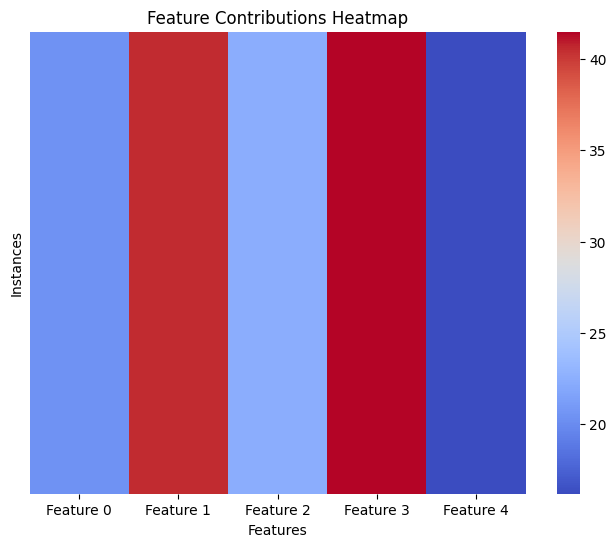

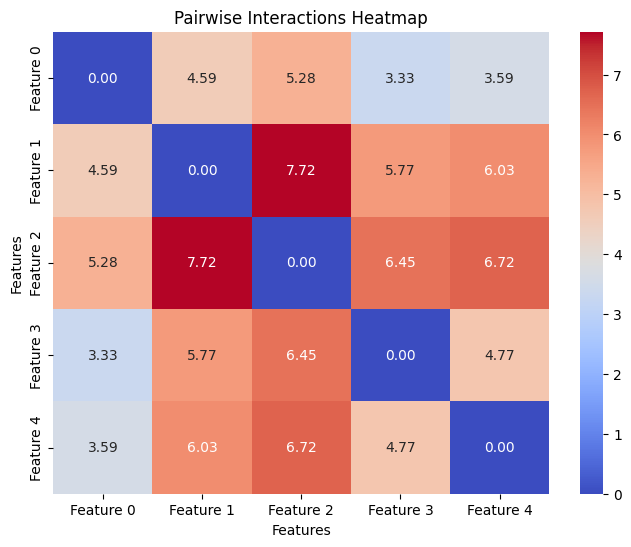

Contribution Heatmaps for Base Estimator 1:


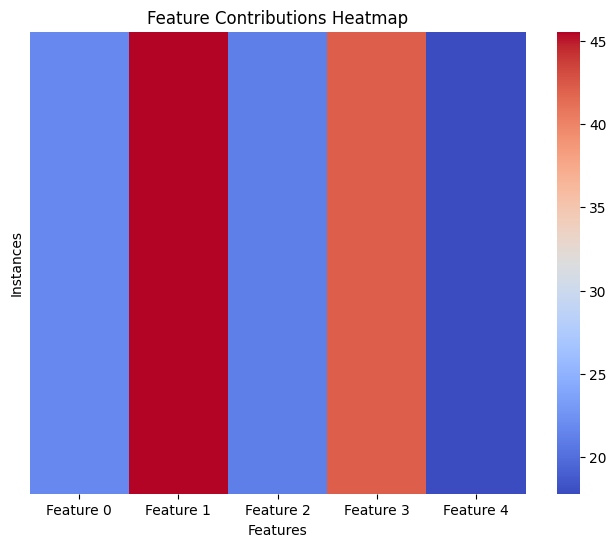

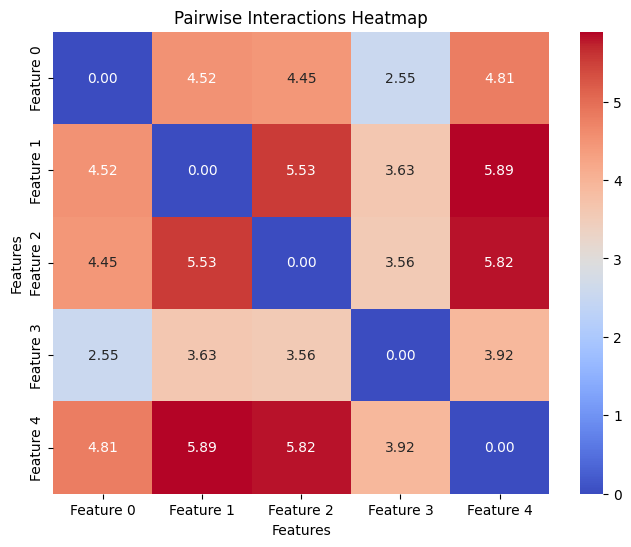

Contribution Heatmaps for Base Estimator 2:


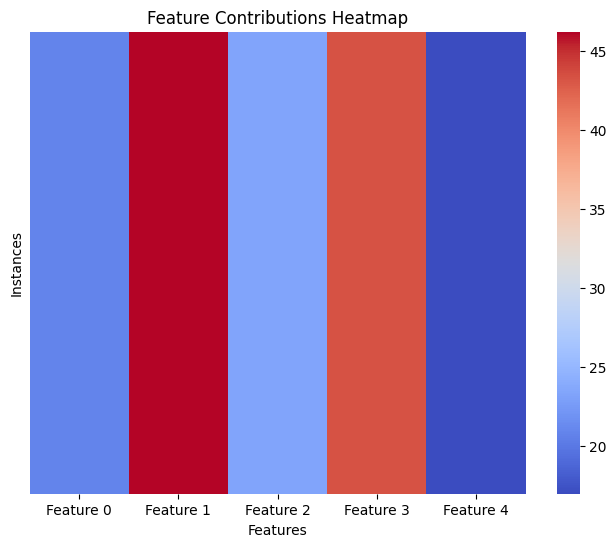

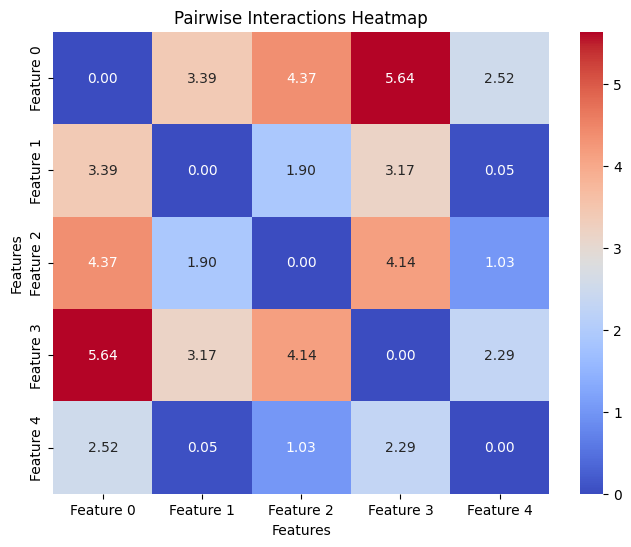

Contribution Heatmaps for Base Estimator 3:


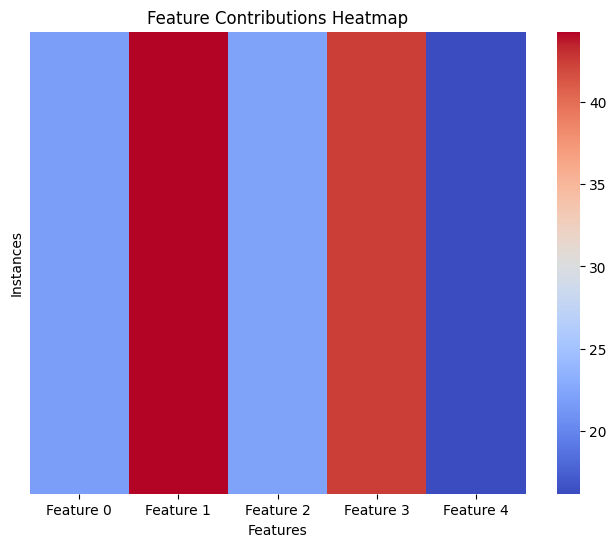

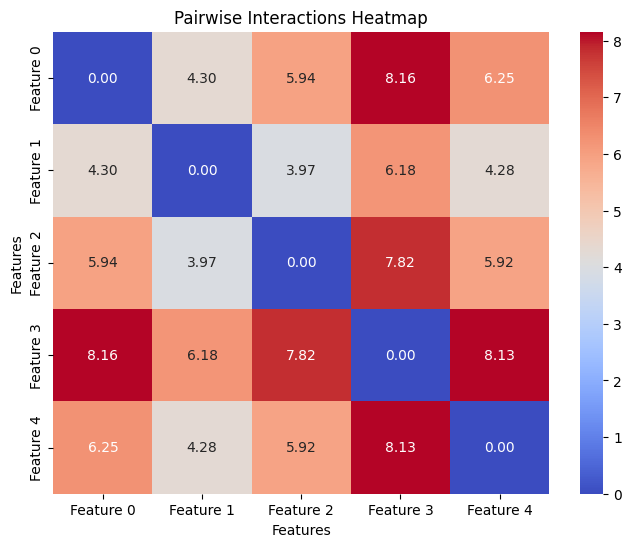

Contribution Heatmaps for Base Estimator 4:


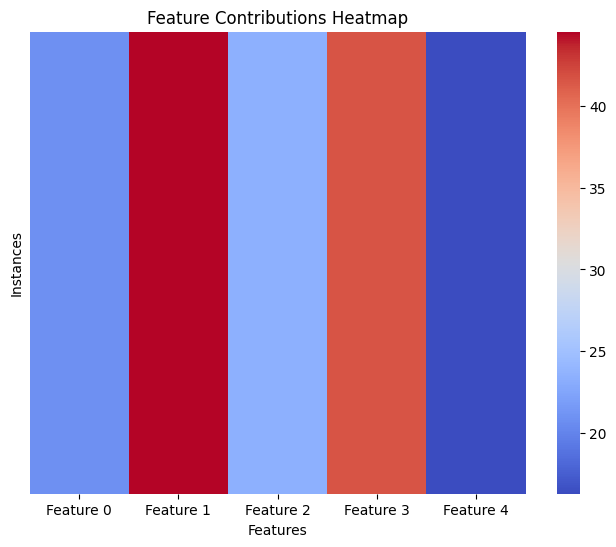

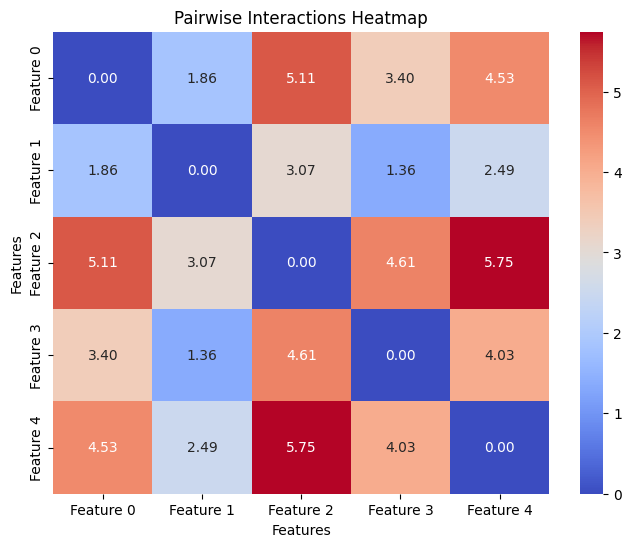

Contribution Heatmaps for Base Estimator 5:


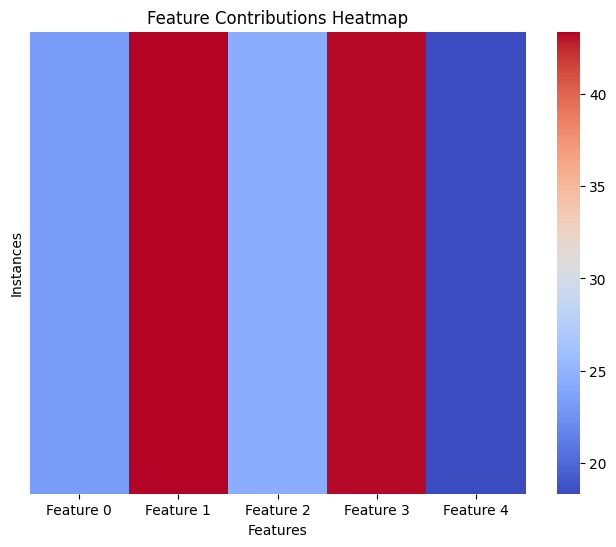

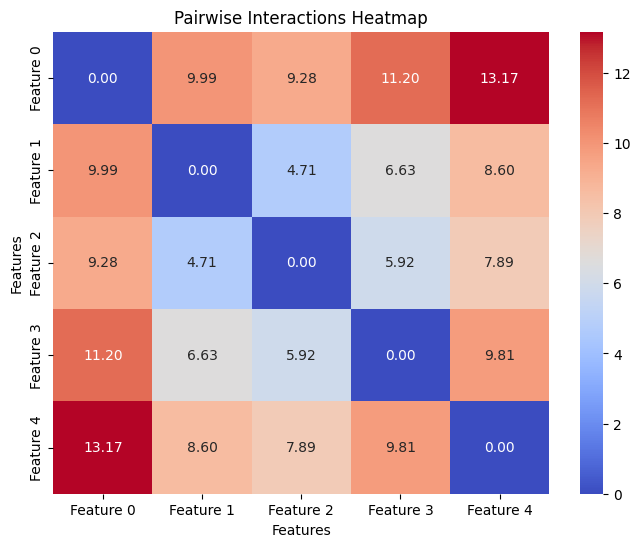

Contribution Heatmaps for Base Estimator 6:


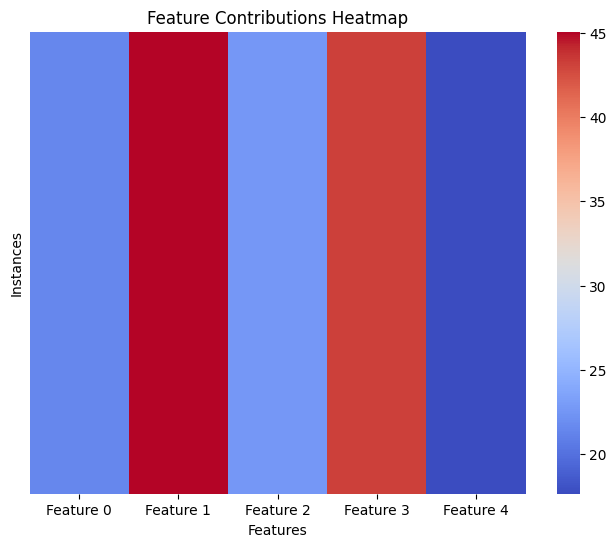

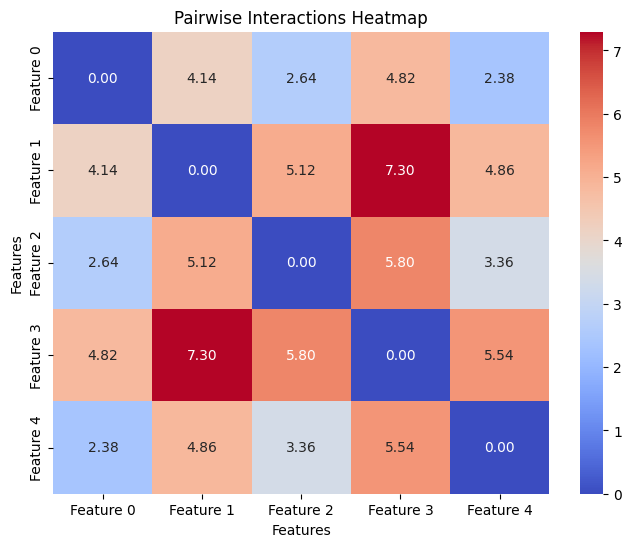

Contribution Heatmaps for Base Estimator 7:


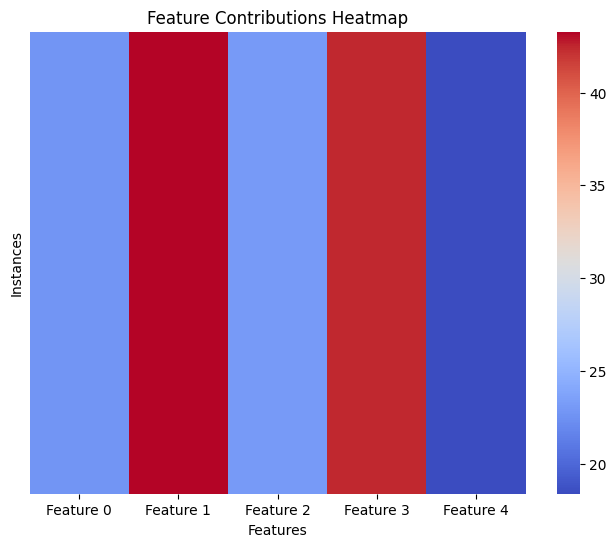

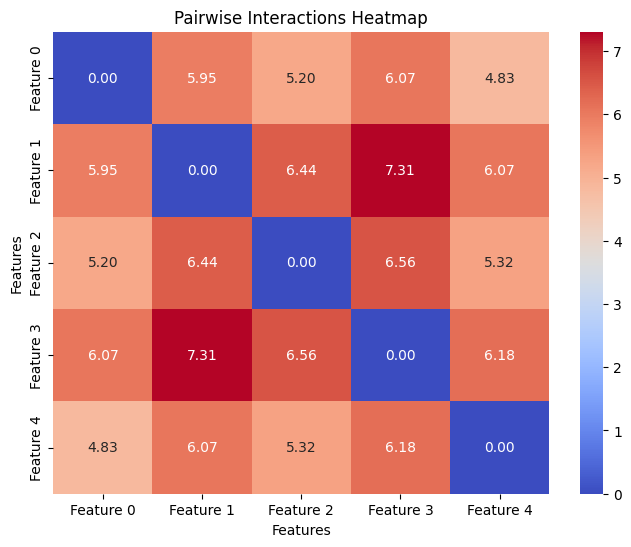

Contribution Heatmaps for Base Estimator 8:


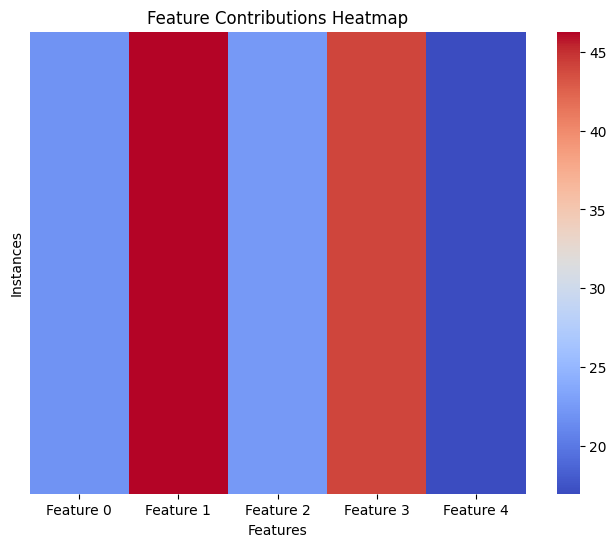

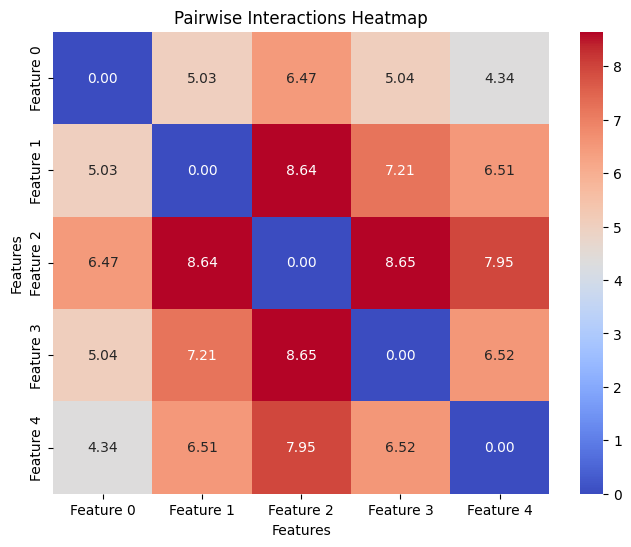

Contribution Heatmaps for Base Estimator 9:


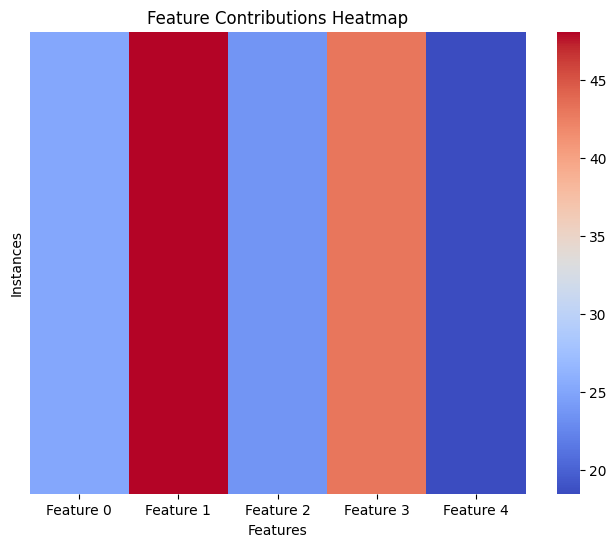

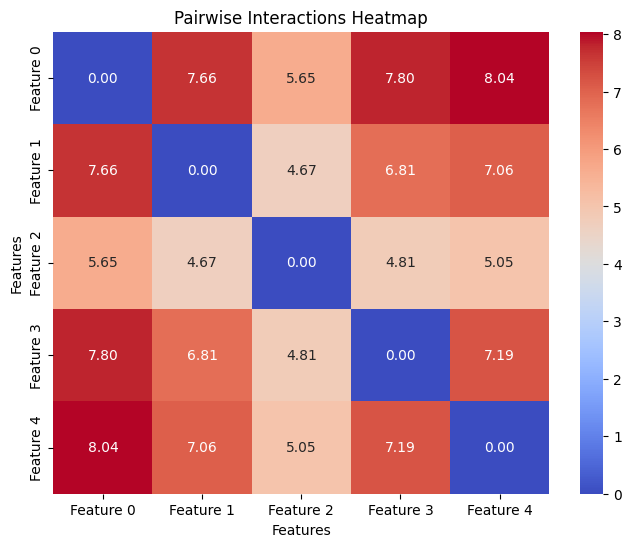

In [19]:
import seaborn as sns

def plot_contribution_heatmaps(contributions, interaction_effects, feature_names=None):
    
    if contributions.ndim == 1:
        contributions = contributions.reshape(1, -1)  # Add this line to reshape the 1D array to a 2D array with one row
        
    # Determine the number of selected features
    num_selected_features = contributions.shape[1]

    # Automatically generate feature names if not provided
    if feature_names is None:
        feature_names = [f'Feature {j}' for j in range(num_selected_features)]

    # Create a heatmap of individual feature contributions
    plt.figure(figsize=(8, 6))
    sns.heatmap(contributions, cmap='coolwarm', cbar=True, xticklabels=feature_names, yticklabels=False)
    plt.title('Feature Contributions Heatmap')
    plt.xlabel('Features')
    plt.ylabel('Instances')
    plt.show()

    # Create a pairwise interactions matrix and calculate the mean of interactions for each pair of features
    pairwise_interactions = np.zeros((num_selected_features, num_selected_features))
    for i in range(num_selected_features):
        for j in range(i+1, num_selected_features):
            pairwise_interactions[i, j] = np.mean(interaction_effects[i][j])
            pairwise_interactions[j, i] = pairwise_interactions[i, j]

    # Create a heatmap of pairwise interactions
    plt.figure(figsize=(8, 6))
    sns.heatmap(pairwise_interactions, cmap='coolwarm', annot=True, fmt=".2f", cbar=True, xticklabels=feature_names, yticklabels=feature_names)
    plt.title('Pairwise Interactions Heatmap')
    plt.xlabel('Features')
    plt.ylabel('Features')
    plt.show()

# Obtain feature importances and interaction effects using the get_feature_importance method
feature_importances, interaction_effects_list = SPINEXRegressor.get_feature_importance(X)

# Check if ensemble logic was applied
if isinstance(feature_importances, list):
    # Ensemble case: feature_importances is a list of numpy arrays
    for estimator_idx, (est_contributions, est_interaction_effects) in enumerate(zip(feature_importances, interaction_effects_list)):
        print(f"Contribution Heatmaps for Base Estimator {estimator_idx}:")
        plot_contribution_heatmaps(est_contributions, est_interaction_effects)
else:
    # Single model case: Plot contribution heatmaps
    plot_contribution_heatmaps(feature_importances, interaction_effects_list)


In [20]:
# Define the models to evaluate (only the one with get_feature_importance method)
spinex_models = {
    'SPINEX': SPINEXRegressor
}

# Select instances to predict
instance_index = [0, 2]  # Wrap the instance index in a list

# Get the feature contributions and interaction effects for the selected instances
for model_name, model in spinex_models.items():
    try:
        feature_importances, interaction_effects_list = model.get_feature_importance(X[instance_index])
    except AttributeError:
        print(f"{model_name} does not have a get_feature_importance method. Skipping...")
        continue

    # Check if ensemble logic was applied
    if isinstance(feature_importances, list):
        # Ensemble case: feature_importances is a list of numpy arrays
        for estimator_idx, (est_contributions, est_interaction_effects) in enumerate(zip(feature_importances, interaction_effects_list)):
            for instance_idx, index in enumerate(instance_index):
                print(f"\nInstance {instance_idx+1} with ground truth label {y[index]}:")
                print(f"Prediction for instance {index} using {model_name}: {model.predict(X[index].reshape(1, -1))}")

                est_contributions = feature_importances[instance_idx]
                est_interaction_effects = interaction_effects_list[instance_idx]

                # Rest of the code should remain the same

            # Print individual feature contributions
            print("Individual feature contributions:")
            for j, contrib in enumerate(est_contributions):
                print(f"Feature {j} contribution: {contrib}")

            # Calculate and print normalized contributions
            total_abs_contrib = np.sum(np.abs(est_contributions))
            normalized_contributions = (np.abs(est_contributions) / total_abs_contrib) * 100
            print("Normalized feature contributions (percentage of total contribution):")
            for j, norm_contrib in enumerate(normalized_contributions):
                print(f"Feature {j} normalized contribution: {norm_contrib:.2f}%")

            # Calculate and print the sum of contributions
            sum_of_contributions = np.sum(est_contributions)
            print(f"Sum of contributions: {sum_of_contributions}")

            # Print pairwise interaction effects, if available
            if len(est_interaction_effects) > 0:  # Check if interaction_effects is not empty
                print("Pairwise interactions:")
                # Initialize the sum of interactions
                sum_of_interactions = 0
                # Count the number of unique pairwise interactions
                num_of_interactions = 0
                for j, interactions in enumerate(est_interaction_effects):
                    # Check if interactions is an iterable (such as an array or list)
                    if hasattr(interactions, '__iter__'):
                        print(f"  Pairwise interactions for feature {j}: {interactions}")
                        # Add interactions to the sum of interactions
                        for k, interaction_value in enumerate(interactions):
                            if j != k:  # Exclude self-interactions
                                sum_of_interactions += interaction_value
                                num_of_interactions += 1
                    else:
                        # If interactions is not an iterable, skip it
                        continue
                # Calculate the mean of interactions
                if num_of_interactions != 0:
                    mean_of_interactions = sum_of_interactions / num_of_interactions
                else:
                    mean_of_interactions = 0
                # Print the sum and mean of interactions
                print(f"Sum of interactions: {sum_of_interactions}")
                print(f"Mean of interactions: {mean_of_interactions}")
            else:
                print("Pairwise interaction effects: None")
            
            print("-" * 30)  # Single dashed line after feature contributions and interaction effects
    else:
        # Single model case: feature_importances is a 1D numpy array
        for instance_idx, index in enumerate(instance_index):
            print(f"\nInstance {instance_idx+1} with ground truth label {y[index]}:")
            print(f"Prediction for instance {index} using {model_name}: {model.predict(X[index].reshape(1, -1))}")

            if instance_idx < len(feature_importances) and instance_idx < len(interaction_effects_list):
                est_contributions = feature_importances[instance_idx]
                est_interaction_effects = interaction_effects_list[instance_idx]
            else:
                print(f"Error: Unable to process instance {instance_idx+1} (index {index}) with the current model configuration.")
                continue


    # Rest of the code should remain the same

        # Print individual feature contributions
        print("Individual feature contributions:")
        for j, contrib in enumerate(feature_importances):
            print(f"Feature {j} contribution: {contrib}")

        # Calculate and print normalized contributions
        total_abs_contrib = np.sum(np.abs(feature_importances))
        normalized_contributions = (np.abs(feature_importances) / total_abs_contrib) * 100
        print("Normalized feature contributions (percentage of total contribution):")
        for j, norm_contrib in enumerate(normalized_contributions):
            print(f"Feature {j} normalized contribution: {norm_contrib:.2f}%")

        # Calculate and print the sum of contributions
        sum_of_contributions = np.sum(feature_importances)
        print(f"Sum of contributions: {sum_of_contributions}")

        # Print pairwise interaction effects, if available
        if len(interaction_effects_list) > 0:  # Check if interaction_effects is not empty
            print("Pairwise interactions:")
            # Initialize the sum of interactions
            sum_of_interactions = 0
            # Count the number of unique pairwise interactions
            num_of_interactions = 0
            for j, interactions in enumerate(interaction_effects_list):
                # Check if interactions is an iterable (such as an array or list)
                if hasattr(interactions, '__iter__'):
                    print(f"  Pairwise interactions for feature {j}: {interactions}")
                    # Add interactions to the sum of interactions
                    for k, interaction_value in enumerate(interactions):
                        if j != k:  # Exclude self-interactions
                            sum_of_interactions += interaction_value
                            num_of_interactions += 1
                else:
                    # If interactions is not an iterable, skip it
                    continue
            # Calculate the mean of interactions
            if num_of_interactions != 0:
                mean_of_interactions = sum_of_interactions / num_of_interactions
            else:
                mean_of_interactions = 0

            # Print the sum and mean of interactions
            print(f"Sum of interactions: {sum_of_interactions}")
            print(f"Mean of interactions: {mean_of_interactions}")
        else:
            print("Pairwise interaction effects: None")
        
        print("-" * 30)  # Single dashed line after feature contributions and interaction effects




Instance 1 with ground truth label -23.254887222321546:
Prediction for instance 0 using SPINEX: [-19.8490611]

Instance 2 with ground truth label -139.90700936185053:
Prediction for instance 2 using SPINEX: [-137.82926502]
Individual feature contributions:
Feature 0 contribution: 18.27396934294148
Feature 1 contribution: 20.22068690989177
Feature 2 contribution: 11.202897225168776
Feature 3 contribution: 29.990897839919157
Feature 4 contribution: 14.690339746298516
Normalized feature contributions (percentage of total contribution):
Feature 0 normalized contribution: 19.36%
Feature 1 normalized contribution: 21.43%
Feature 2 normalized contribution: 11.87%
Feature 3 normalized contribution: 31.78%
Feature 4 normalized contribution: 15.57%
Sum of contributions: 94.37879106421971
Pairwise interactions:
  Pairwise interactions for feature 0: [  0.         -55.9532811  -72.05061004 -54.78580625 -61.48362827]
  Pairwise interactions for feature 1: [-55.9532811    0.         -57.82135081 -4

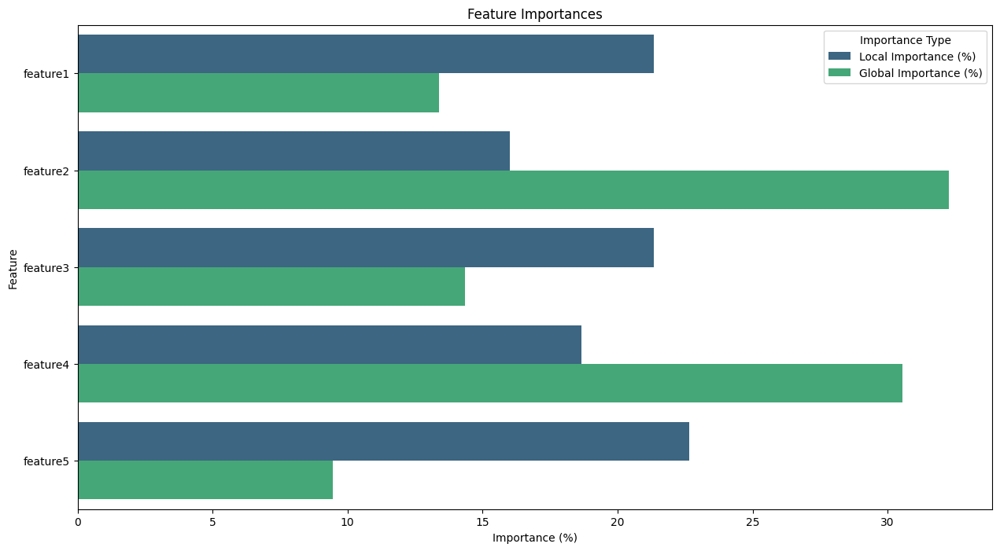

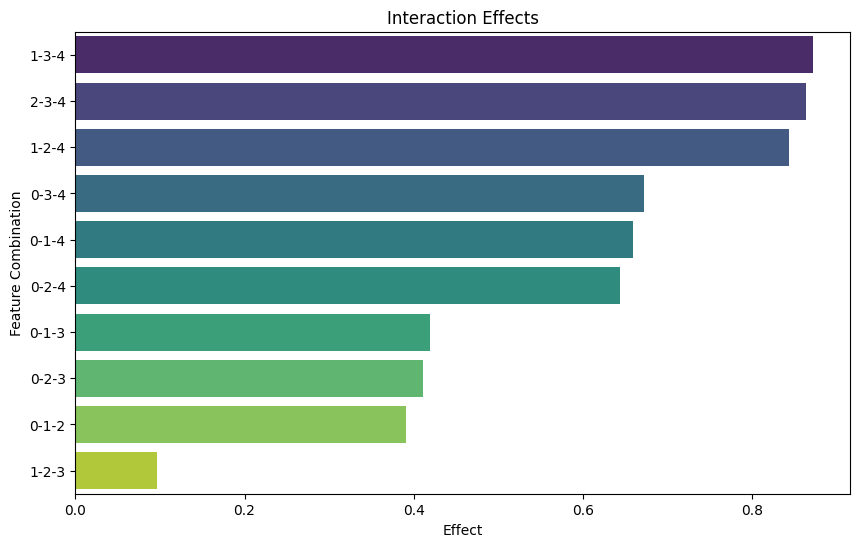

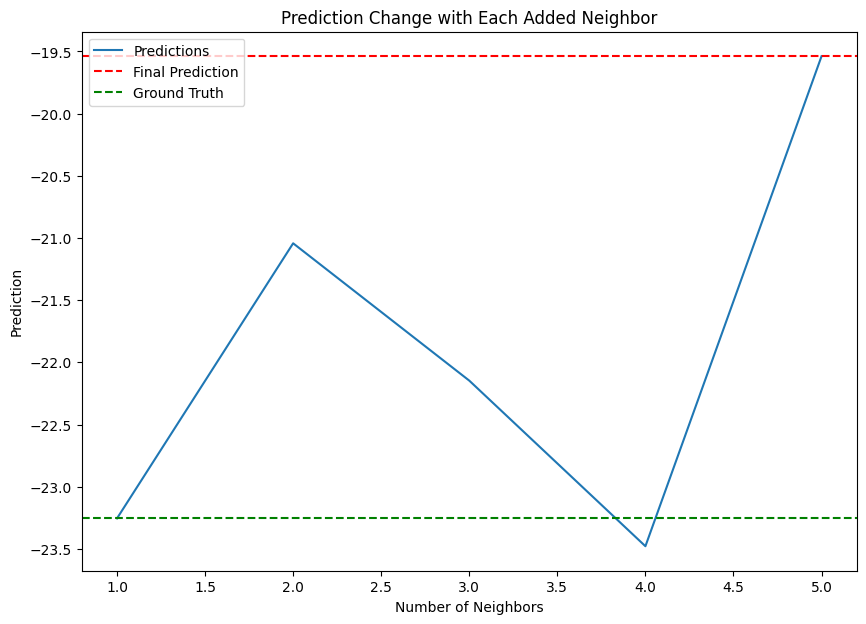

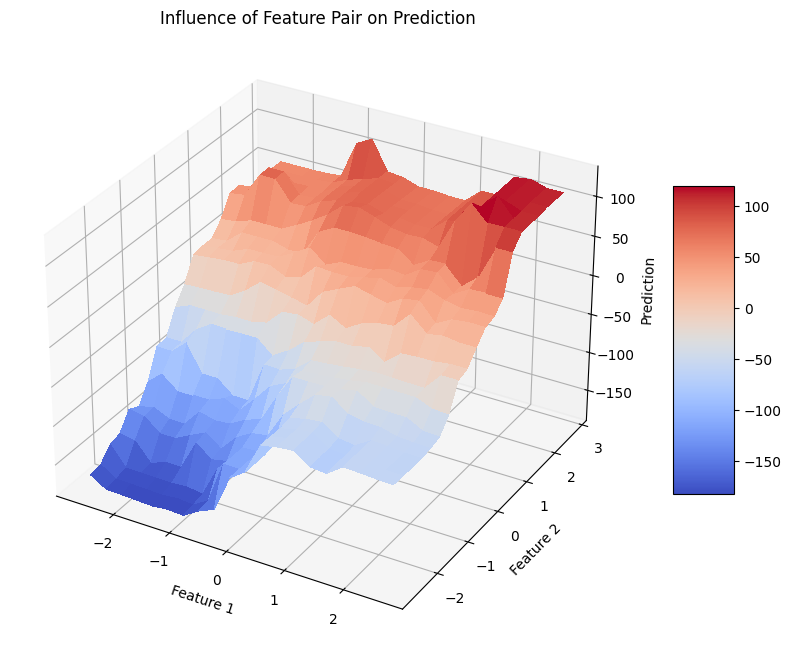

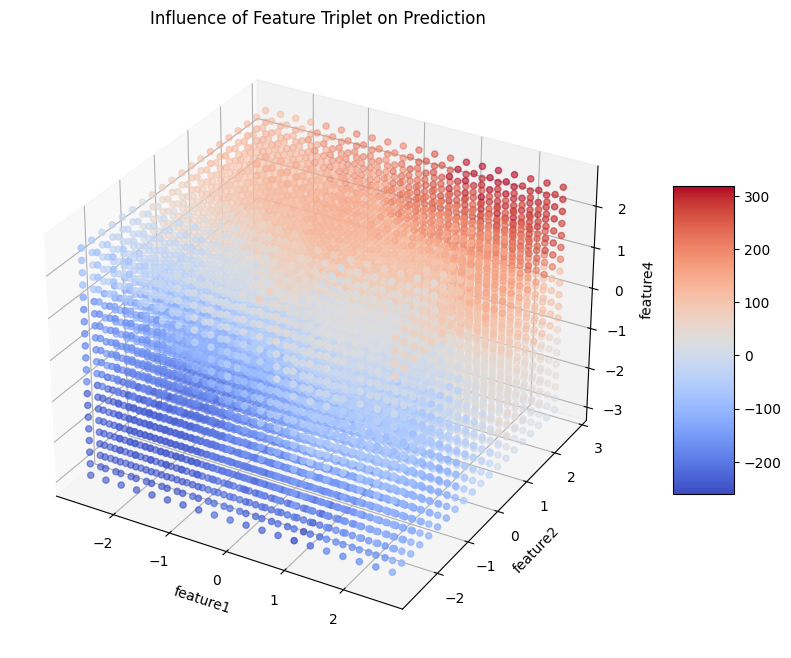

Neighbor Counts: Counter({0: 1, 401: 1, 339: 1, 188: 1, 46: 1})
Normalized global feature importances: [0.13393182 0.32258779 0.1435256  0.30541615 0.09453863]
Local feature importances for instance 0 : [0.21333333 0.16       0.21333333 0.18666667 0.22666667]
--------------------------------------------------
Feature combination: Feature Combination, Interaction effect: 0    0-1-2
1    0-1-3
2    0-1-4
3    0-2-3
4    0-2-4
5    0-3-4
6    1-2-3
7    1-2-4
8    1-3-4
9    2-3-4
Name: Feature Combination, dtype: object
Feature combination: Interaction Effect, Interaction effect: 0    0.390807
1    0.419428
2    0.660008
3    0.410707
4    0.643710
5    0.672330
6    0.096045
7    0.844361
8    0.872982
9    0.864261
Name: Interaction Effect, dtype: float64


In [21]:
from matplotlib import cm
from collections import Counter

# Assume your data is in a pandas DataFrame
feature_names = ['feature'+str(i+1) for i in range(X.shape[1])]
X_df = pd.DataFrame(X, columns=feature_names)

# Assume you have a trained SPINEX model called `model`
# and a test dataset `X_test`
# Initialize your model
model = LocalSPINEX()

# Assume X_train and y_train are your training data and labels
model.fit(X, y)

# Generate local explanation
index_to_explain = 0
neighbor_counts, feature_importances = model.get_local_explanation(X_df.values, index_to_explain)
interaction_effects = model.get_local_interaction_effects(X_df.values, index_to_explain)
interaction_effects_df = model.get_local_interaction_effects(X_df.values, index_to_explain)
neighbor_counts, feature_importances = model.get_local_explanation(X, index_to_explain)

# Get feature names dynamically from the DataFrame
feature_names = X_df.columns.tolist()

# Get global feature importances
global_feature_importances, _ = model.get_feature_importance(X)

# Normalize global feature importances
global_feature_importances = global_feature_importances / np.sum(global_feature_importances)

# Visualize feature importances
model.visualize_feature_importances(feature_importances, global_feature_importances, feature_names)

# Visualize the interaction effects
model.visualize_interaction_effects(interaction_effects_df)

# Plot prediction change with each added neighbor
model.plot_prediction_change(X, y, index_to_explain)

# Choose a pair of features to plot
feature_pair = (0, 1)  # The first and second features

# Plot the influence of the feature pair
model.plot_feature_pair_influence(X, index_to_explain, feature_pair)

# Choose a triplet of features to plot
feature_triplet = (0, 1, 3)  # The first, second and third features

# Number of features
n_features = X.shape[1]

# Generate feature names
feature_names = [f'feature{i+1}' for i in range(n_features)]

# Plot the influence of the feature triplet
model.plot_feature_triplet_influence(X, index_to_explain, feature_triplet, feature_names)

# Visualize neighbor counts
#model.visualize_neighbor_counts(neighbor_counts)

# Print results
print("Neighbor Counts:", neighbor_counts)

# Compare with local feature importances
print('Normalized global feature importances:', global_feature_importances)
print('Local feature importances for instance', index_to_explain, ':', feature_importances)
print("--------------------------------------------------")  # print a line of dashes

# Print the interaction effects
for feature_combination, interaction_effect in interaction_effects.items():
    print(f"Feature combination: {feature_combination}, Interaction effect: {interaction_effect}")

Interaction Network for Base Estimator 0:


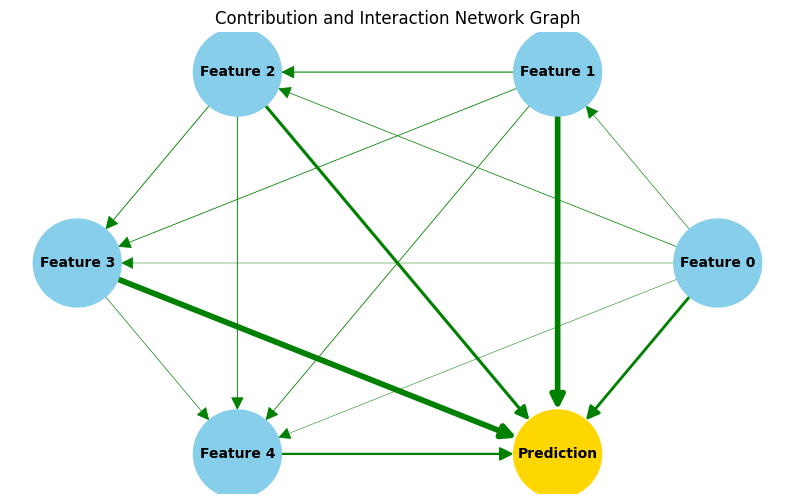

Interaction Network for Base Estimator 1:


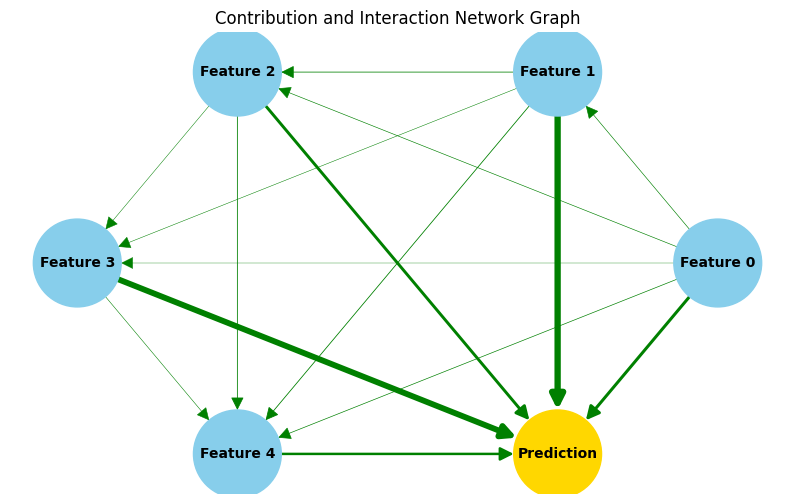

Interaction Network for Base Estimator 2:


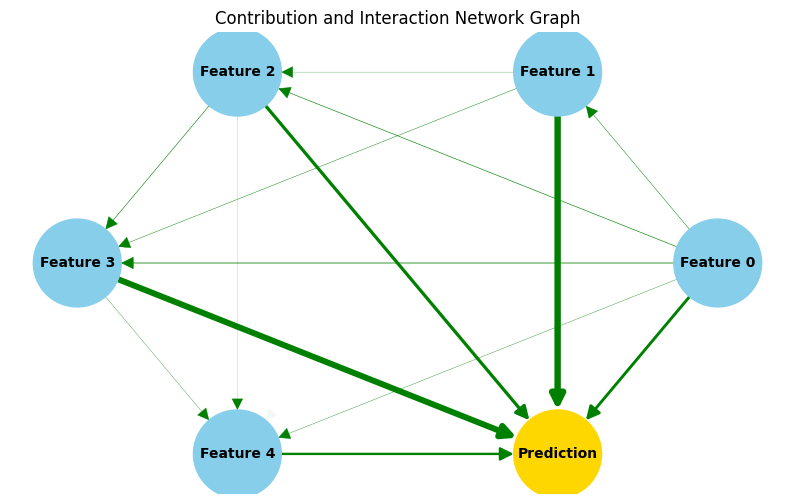

Interaction Network for Base Estimator 3:


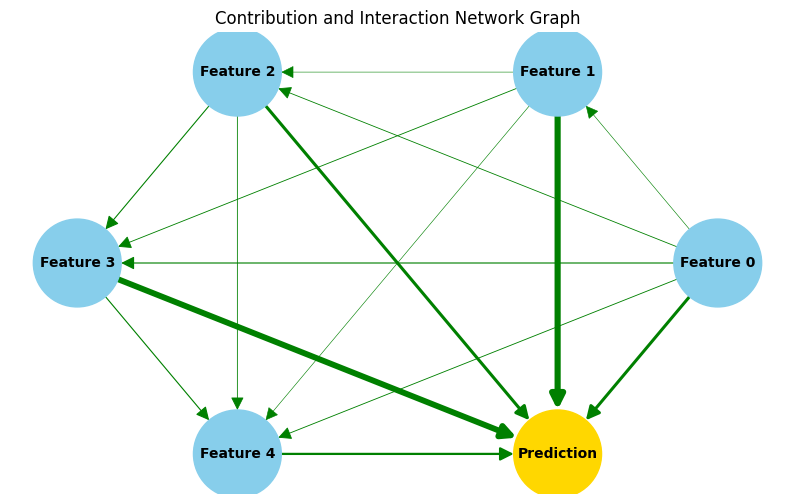

Interaction Network for Base Estimator 4:


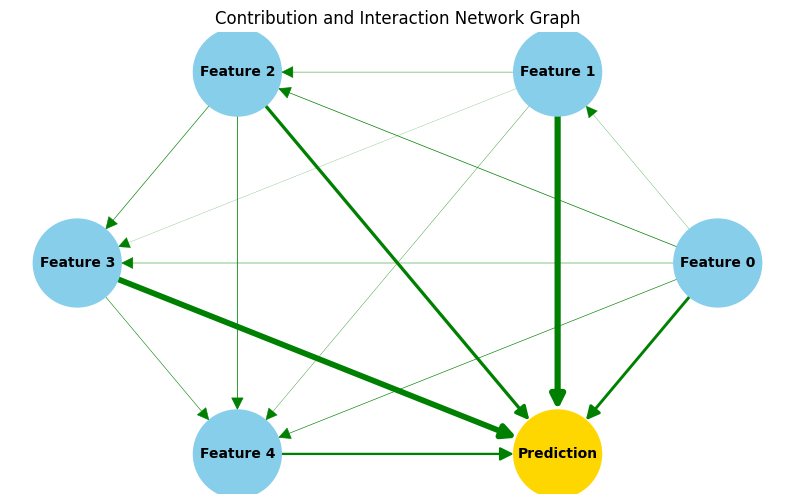

Interaction Network for Base Estimator 5:


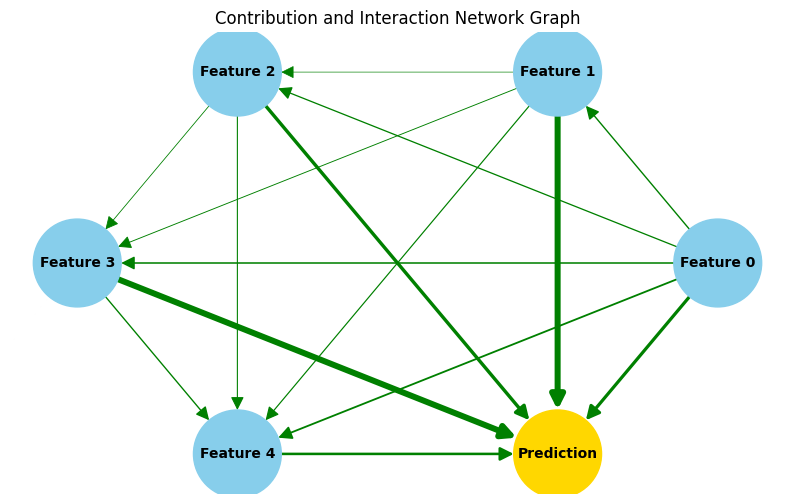

Interaction Network for Base Estimator 6:


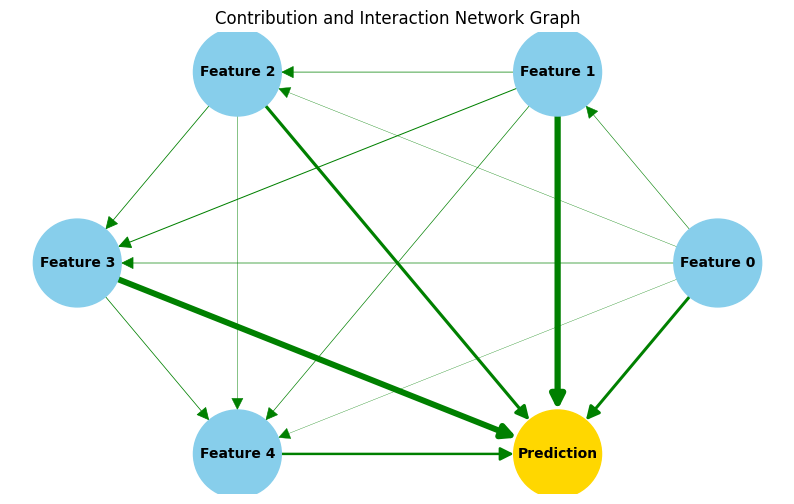

Interaction Network for Base Estimator 7:


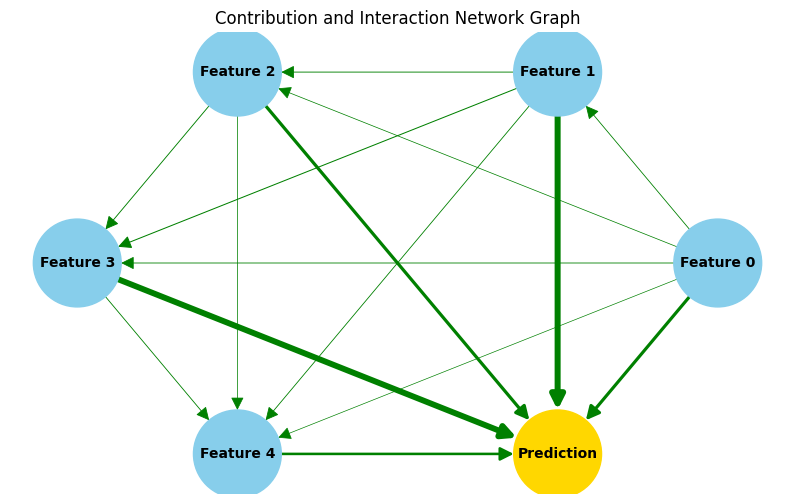

Interaction Network for Base Estimator 8:


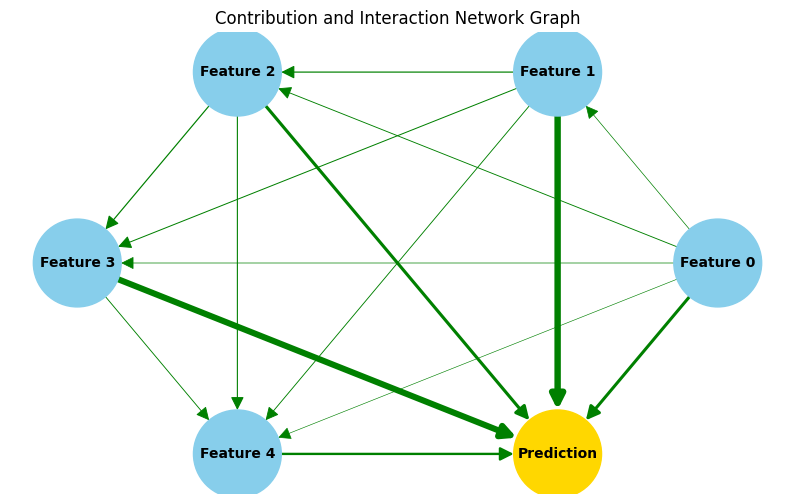

Interaction Network for Base Estimator 9:


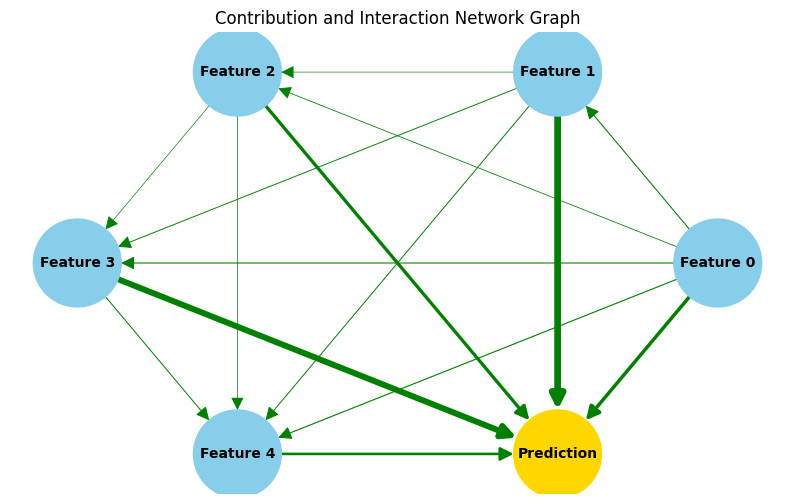

Interaction Network for Base Estimator 0:


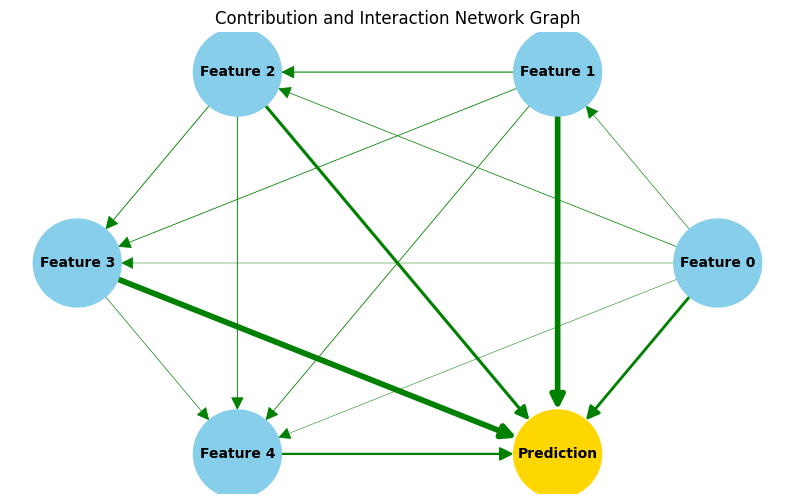

Interaction Network for Base Estimator 1:


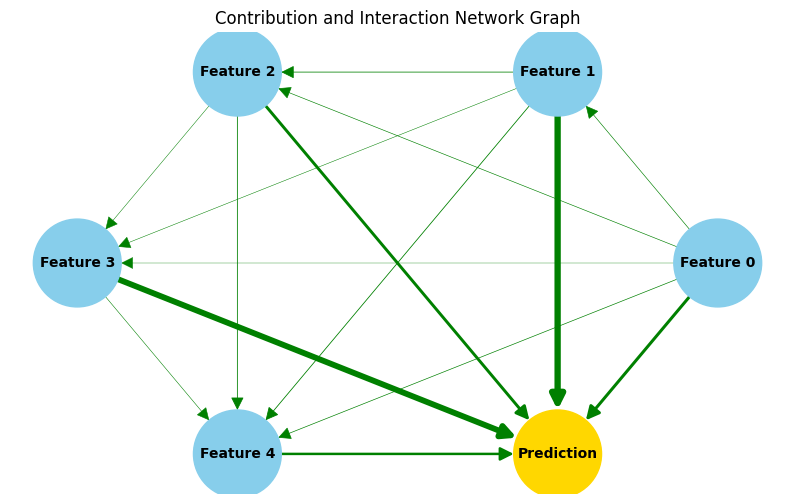

Interaction Network for Base Estimator 2:


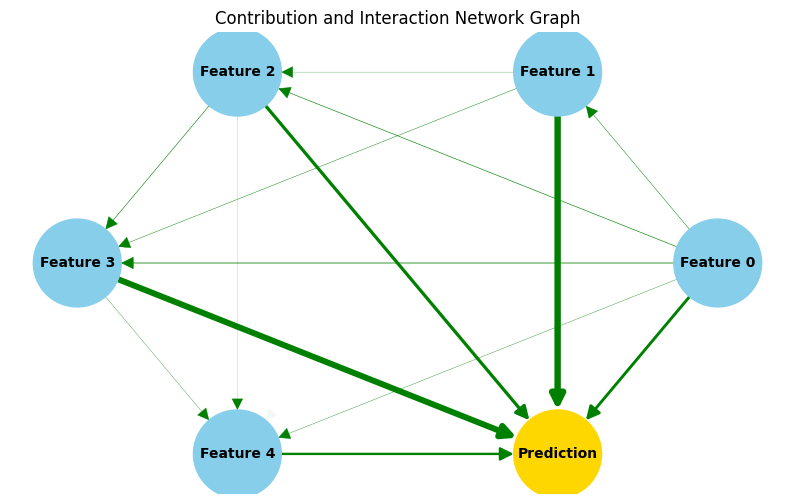

Interaction Network for Base Estimator 3:


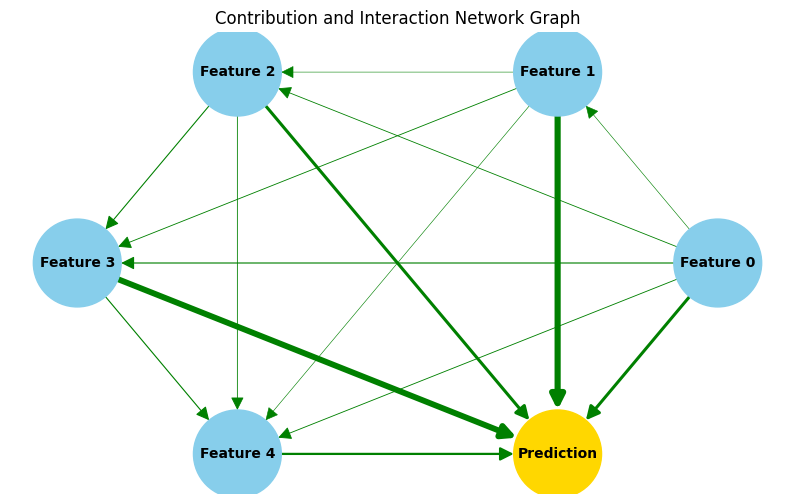

Interaction Network for Base Estimator 4:


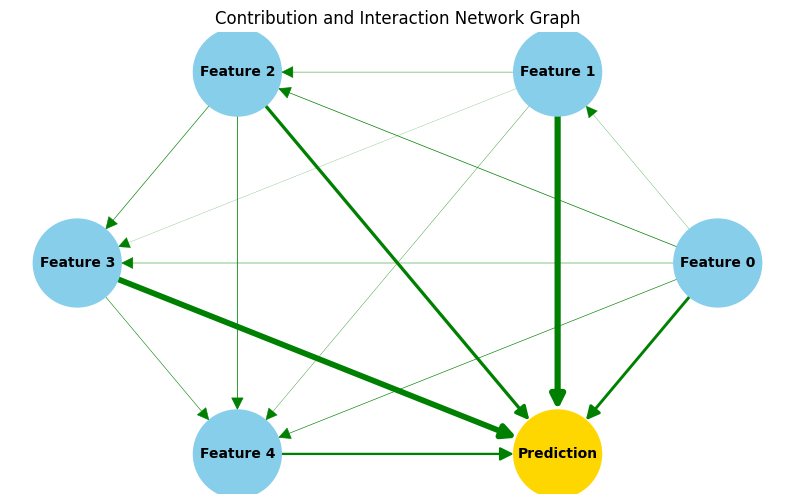

Interaction Network for Base Estimator 5:


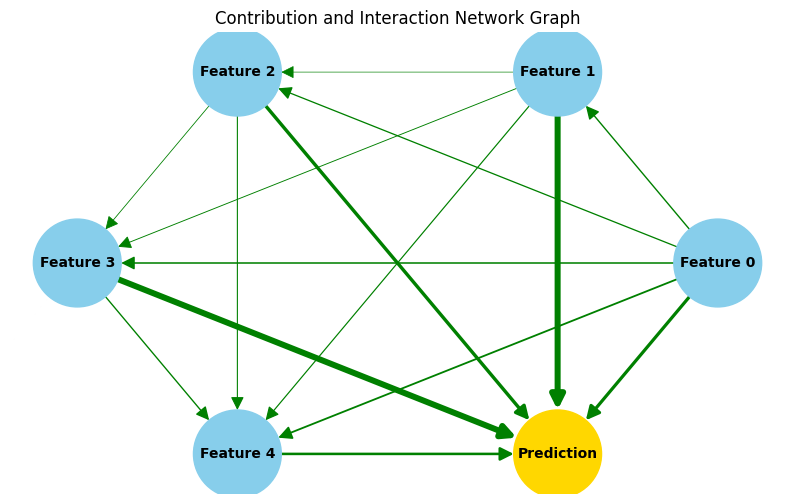

Interaction Network for Base Estimator 6:


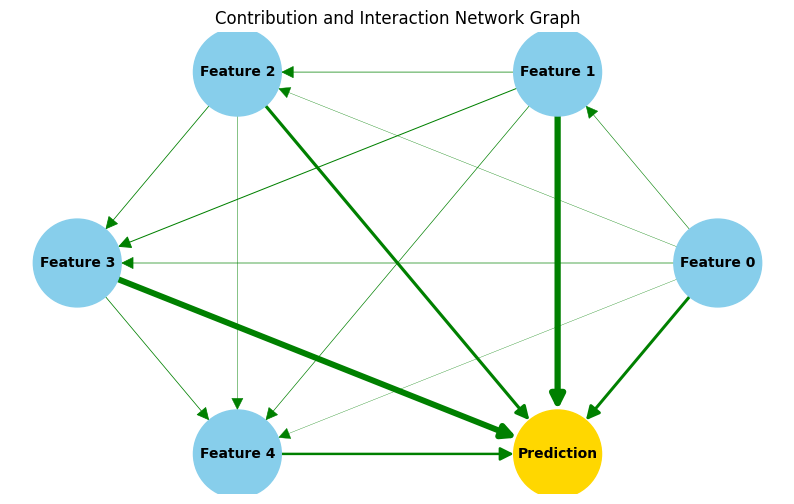

Interaction Network for Base Estimator 7:


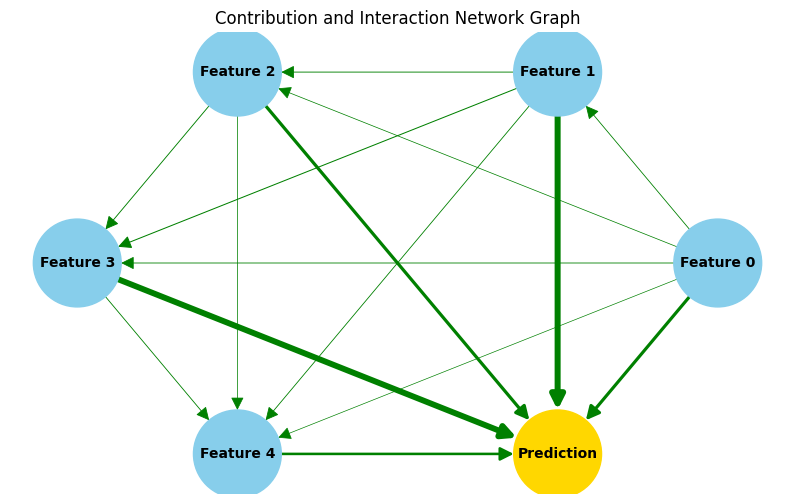

Interaction Network for Base Estimator 8:


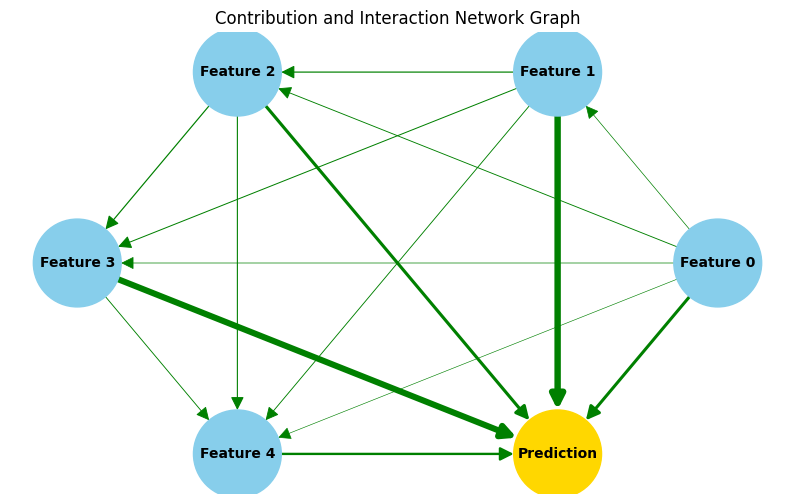

Interaction Network for Base Estimator 9:


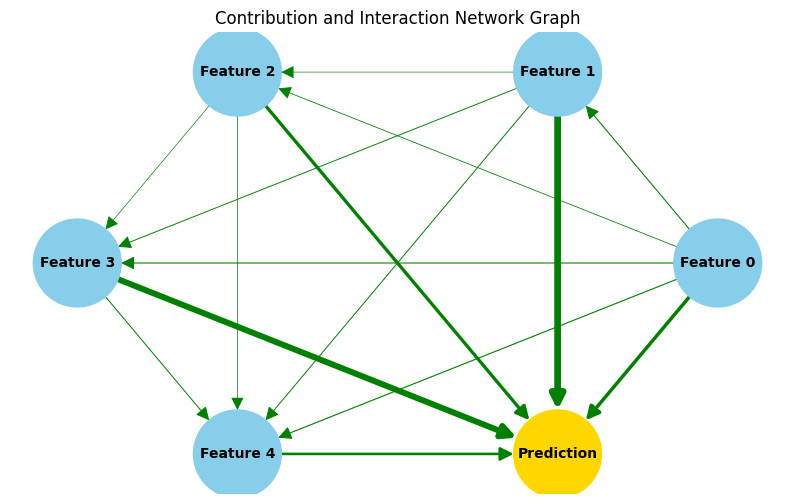

In [22]:
import networkx as nx
import matplotlib.pyplot as plt
import matplotlib.colors as mcolors

def plot_interaction_network(feature_importances, interaction_effects_list, feature_names=None, instance_index=0):
    # Check if ensemble logic was applied
    if isinstance(feature_importances, list):
        # Ensemble case: feature_importances is a list of numpy arrays
        for estimator_idx, (est_contributions, est_interaction_effects) in enumerate(zip(feature_importances, interaction_effects_list)):
            print(f"Interaction Network for Base Estimator {estimator_idx}:")
            # Assuming `est_contributions` is a 1D array of contributions for each instance
            _plot_interaction_network(est_contributions, est_interaction_effects, feature_names, instance_index)
    else:
        # Single model case: Plot interaction network
        # Assuming `contributions` is a 1D array of contributions for each instance
        _plot_interaction_network(feature_importances, interaction_effects_list, feature_names, instance_index)

def _plot_interaction_network(contributions, interaction_effects, feature_names=None, instance_index=0):
    # Determine the number of selected features
    num_selected_features = contributions.shape[0]

    # Automatically generate feature names if not provided
    if feature_names is None:
        feature_names = [f'Feature {j}' for j in range(num_selected_features)]

    # Create a network graph
    G = nx.DiGraph()

    # Add nodes for features
    G.add_nodes_from(feature_names)

    # Add node for prediction
    G.add_node('Prediction')

    # Add edges for individual contributions
    for i, contrib in enumerate(contributions):
        G.add_edge(feature_names[i], 'Prediction', weight=abs(contrib), sign=contrib)

    # Add edges for pairwise interactions
    for i in range(num_selected_features):
        for j in range(i+1, num_selected_features):
            interaction_value = interaction_effects[i, j]
            if interaction_value != 0:
                G.add_edge(feature_names[i], feature_names[j], weight=abs(interaction_value), sign=interaction_value)

    # Set edge colors based on the sign of interactions/contributions
    cmap = mcolors.LinearSegmentedColormap.from_list("", ["red", "white", "green"])
    edge_colors = [cmap(G[u][v]['sign'] / 2 + 0.5) for u, v in G.edges()]

    # Set edge width based on the weight of interactions/contributions (scaled down by a factor)
    edge_widths = [G[u][v]['weight'] * 0.1 for u, v in G.edges()]

    # Set node colors (features in blue, prediction in yellow)
    node_colors = ['skyblue' if node in feature_names else 'gold' for node in G.nodes()]

    # Draw the network graph
    plt.figure(figsize=(10, 6))
    plt.gca().set_facecolor("#f0f0f0")
    pos = nx.circular_layout(G)
    nx.draw(G, pos, with_labels=True, node_size=4000, node_color=node_colors,
            font_size=10, font_weight='bold', font_color='black',
            edge_color=edge_colors, width=edge_widths, arrowstyle='-|>', arrowsize=20)
    plt.title('Contribution and Interaction Network Graph')
    plt.show()

# Obtain feature importances and interaction effects using the get_feature_importance method
feature_importances, interaction_effects_list = SPINEXRegressor.get_feature_importance(X)

# Plot the network graph for the first instance
plot_interaction_network(feature_importances, interaction_effects_list, instance_index=0)

# If you want to plot the network graph for other instances, you can change the instance_index. For example, to plot for the second instance:
plot_interaction_network(feature_importances, interaction_effects_list, instance_index=1)


In [23]:
def plot_vertical_bar(feature_importances, interaction_effects_list, feature_names=None, instances_to_plot=None):
    # Check if ensemble logic was applied
    if isinstance(feature_importances, list):
        # Ensemble case: feature_importances is a list of numpy arrays
        for estimator_idx, (est_contributions, est_interaction_effects) in enumerate(zip(feature_importances, interaction_effects_list)):
            # If instances_to_plot is not provided, plot all instances
            if instances_to_plot is None:
                instances_to_plot = range(len(est_contributions))

            # Automatically generate feature names if not provided
            if feature_names is None:
                feature_names = [f'Feature {j}' for j in range(len(est_contributions[0]))]

            # Iterate over each instance specified in instances_to_plot
            for i in instances_to_plot:
                # Get individual feature contributions for the current instance
                instance_contributions = est_contributions[i]

                # Calculate the sum of the absolute pairwise interaction effects for the current instance
                interaction_sum = 0
                for j in range(len(est_contributions[0])):
                    for k in range(j+1, len(est_contributions[0])):
                        interaction_sum += np.abs(est_interaction_effects[j][k][i])

                # Append the sum of interactions to the instance_contributions
                all_contributions = np.append(instance_contributions, interaction_sum)

                # Normalize contributions
                all_contributions = all_contributions / np.sum(np.abs(all_contributions))

                # Create tick labels
                tick_labels = feature_names.copy()
                tick_labels.append('Interaction Sum')

                # Plot the bar chart with tick labels and normalized y-axis
                plt.figure(figsize=(10, 6))
                plt.bar(range(len(all_contributions)), all_contributions, tick_label=tick_labels)
                plt.ylabel('Contribution to Prediction (Normalized)')
                plt.title(f'Bar Chart for Instance {i} of Base Estimator {estimator_idx}')
                plt.show()
    else:
        # Single model case: feature_importances is a 1D numpy array
        # If instances_to_plot is not provided, plot all instances
        if instances_to_plot is None:
            instances_to_plot = range(len(feature_importances))

        # Automatically generate feature names if not provided
        if feature_names is None:
            feature_names = [f'Feature {j}' for j in range(len(feature_importances))]

        # Iterate over each instance specified in instances_to_plot
        for i in instances_to_plot:
            # Get individual feature contributions for the current instance
            instance_contributions = feature_importances

            # Calculate the sum of the absolute pairwise interaction effects for the current instance
            interaction_sum = 0
            for j in range(len(feature_importances)):
                for k in range(j+1, len(feature_importances)):
                    interaction_sum += np.abs(interaction_effects_list[j][k])

            # Append the sum of interactions to the instance_contributions
            all_contributions = np.append(instance_contributions, interaction_sum)

            # Normalize contributions
            all_contributions = all_contributions / np.sum(np.abs(all_contributions))

            # Create tick labels
            tick_labels = feature_names.copy()
            tick_labels.append('Interaction Sum')

            # Plot the bar chart with tick labels and normalized y-axis
            plt.figure(figsize=(10, 6))
            plt.bar(range(len(all_contributions)), all_contributions, tick_label=tick_labels)
            plt.ylabel('Contribution to Prediction (Normalized)')
            plt.title(f'Bar Chart for Instance {i}')
            plt.show()


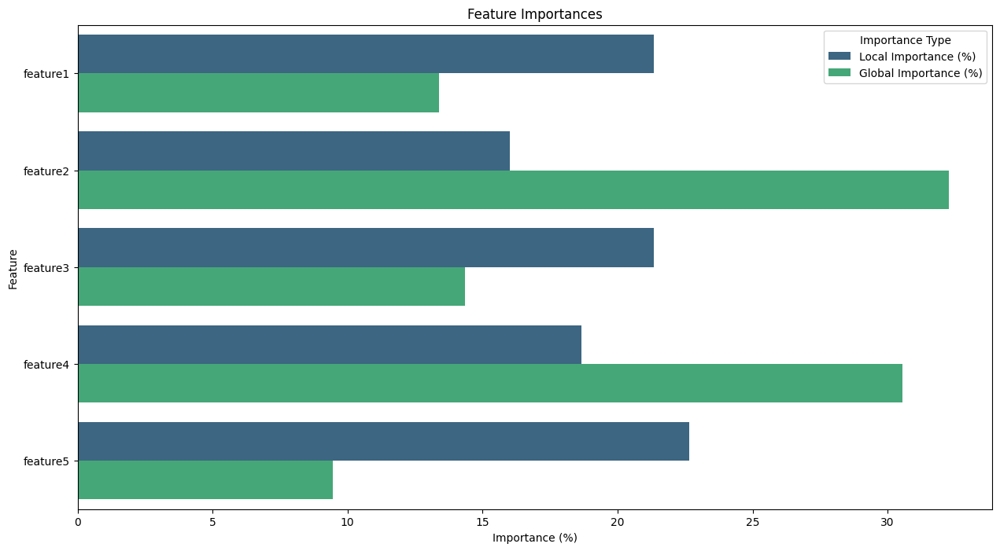

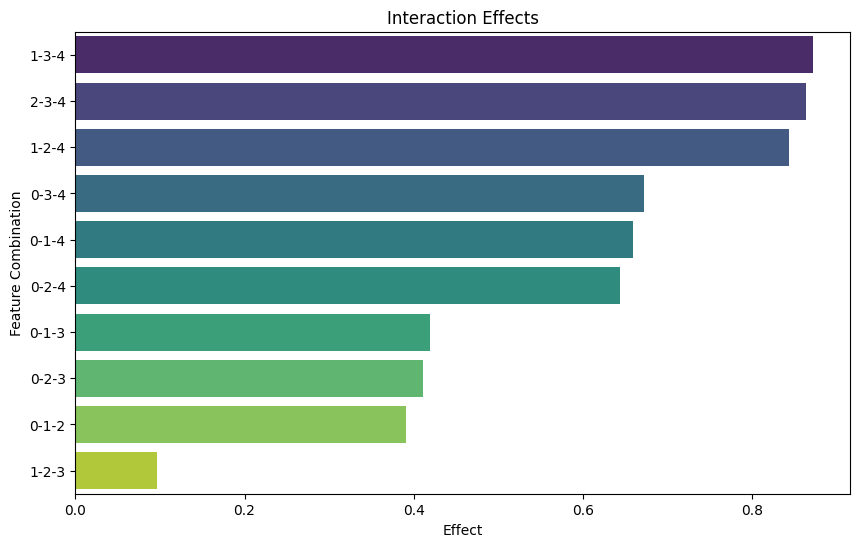

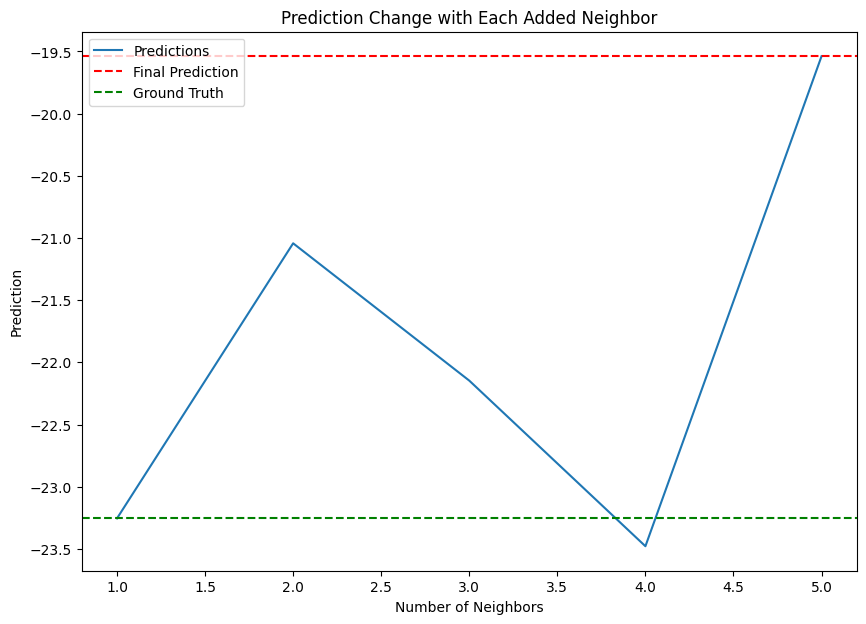

Neighbor Counts: Counter({0: 1, 401: 1, 339: 1, 188: 1, 46: 1})
Normalized global feature importances: [0.13393182 0.32258779 0.1435256  0.30541615 0.09453863]
Local feature importances for instance 0 : [0.21333333 0.16       0.21333333 0.18666667 0.22666667]
--------------------------------------------------
Feature combination: Feature Combination, Interaction effect: 0    0-1-2
1    0-1-3
2    0-1-4
3    0-2-3
4    0-2-4
5    0-3-4
6    1-2-3
7    1-2-4
8    1-3-4
9    2-3-4
Name: Feature Combination, dtype: object
Feature combination: Interaction Effect, Interaction effect: 0    0.390807
1    0.419428
2    0.660008
3    0.410707
4    0.643710
5    0.672330
6    0.096045
7    0.844361
8    0.872982
9    0.864261
Name: Interaction Effect, dtype: float64


In [24]:
import matplotlib.pyplot as plt
import seaborn as sns
import numpy as np
import pandas as pd
from collections import Counter

class LocalSPINEX(SPINEX):
    def get_local_explanation(self, X, instance_to_explain):
        # The existing part of the method remains the same...
        distances = self._calculate_feature_combination_distances(X[instance_to_explain].reshape(1, -1), self.X_train_)
        nearest_indices = np.argsort(distances, axis=1)[:, :self.n_neighbors].flatten()
        neighbor_counts = Counter(nearest_indices)
        feature_importances = np.zeros(X.shape[1])
        for feature_combination in self.feature_combinations:
            combination_distances = np.sum(np.abs(self.X_train_[:, feature_combination] - X[instance_to_explain, feature_combination]), axis=1)
            nearest_indices = np.argsort(combination_distances)[:self.n_neighbors]
            for feature in feature_combination:
                feature_importances[feature] += sum(neighbor_counts[index] for index in nearest_indices)
                
        # Normalize feature importances
        feature_importances = feature_importances / np.sum(feature_importances)
        
        return neighbor_counts, feature_importances

    def visualize_feature_importances(self, local_importances, global_importances, feature_names):
        # Convert feature importances to percentages
        local_importances_percentage = local_importances * 100
        global_importances_percentage = global_importances * 100

        # Create a DataFrame for easier plotting
        df = pd.DataFrame({
            'Feature': feature_names,
            'Local Importance (%)': local_importances_percentage,
            'Global Importance (%)': global_importances_percentage
        })

        # Melt the DataFrame for easier plotting
        df_melted = df.melt(id_vars='Feature', var_name='Importance Type', value_name='Importance (%)')

        # Create a bar plot of feature importances
        plt.figure(figsize=(15, 8))
        sns.barplot(data=df_melted, x='Importance (%)', y='Feature', hue='Importance Type', palette='viridis')
        plt.title('Feature Importances')
        plt.xlabel('Importance (%)')
        plt.ylabel('Feature')
        plt.show()

    def visualize_neighbor_counts(self, neighbor_counts):
        # Create a DataFrame for easier plotting
        df = pd.DataFrame({
            'Neighbor': list(neighbor_counts.keys()),
            'Count': list(neighbor_counts.values())
        })

        # Sort the DataFrame by count
        df = df.sort_values(by='Count', ascending=False)

        # Create a bar plot of neighbor counts
        plt.figure(figsize=(10, 6))
        sns.barplot(data=df, x='Count', y='Neighbor', palette='viridis')
        plt.title('Neighbor Counts')
        plt.xlabel('Count')
        plt.ylabel('Neighbor')
        plt.show()

    def get_local_interaction_effects(self, X, instance_to_explain):
        distances = self._calculate_feature_combination_distances(X[instance_to_explain].reshape(1, -1), self.X_train_)
        nearest_indices = np.argsort(distances, axis=1)[:, :self.n_neighbors].flatten()
        interaction_effects = []
        for feature_combination in self.feature_combinations:
            avg_neighbor_value = np.mean(self.X_train_[nearest_indices][:, feature_combination])
            instance_value = X[instance_to_explain, feature_combination]
            effect = np.abs(avg_neighbor_value - instance_value)
            mean_effect = np.mean(effect)
            interaction_effects.append({
                'Feature Combination': '-'.join(str(x) for x in feature_combination),
                'Interaction Effect': mean_effect
            })
        return pd.DataFrame(interaction_effects)

    def visualize_interaction_effects(self, interaction_effects_df):
        # Sort the DataFrame by interaction effect
        df = interaction_effects_df.sort_values(by='Interaction Effect', ascending=False)

        # Create a bar plot of interaction effects
        plt.figure(figsize=(10, 6))
        sns.barplot(data=df, x='Interaction Effect', y='Feature Combination', palette='viridis')
        plt.title('Interaction Effects')
        plt.xlabel('Effect')
        plt.ylabel('Feature Combination')
        plt.show()

    def plot_prediction_change(self, X, y, instance_to_explain):
        # Calculate distances based on feature combinations
        distances = self._calculate_feature_combination_distances(X[instance_to_explain].reshape(1, -1), self.X_train_)
        
        # Find the indices of the nearest neighbors in ascending order
        sorted_indices = np.argsort(distances, axis=1).flatten()
        
        # Calculate the prediction change with each added neighbor
        prediction_changes = np.zeros(self.n_neighbors)
        for i in range(self.n_neighbors):
            nearest_indices = sorted_indices[:i+1]
            decayed_distance_threshold = self.distance_threshold * self.distance_threshold_decay
            nearest_distances = distances[0, nearest_indices]
            weights = 1 / (nearest_distances + decayed_distance_threshold)
            nearest_targets = self.y_train_[nearest_indices]
            prediction = np.sum(nearest_targets * weights) / np.sum(weights)
            prediction_changes[i] = prediction
        
        # Get the final prediction and the ground truth
        final_prediction = self.predict(X[instance_to_explain].reshape(1, -1))
        ground_truth = y[instance_to_explain]
        
        # Plot the prediction change with each added neighbor
        plt.figure(figsize=(10, 7))
        plt.plot(range(1, self.n_neighbors+1), prediction_changes, label='Predictions')
        plt.axhline(final_prediction, color='r', linestyle='--', label='Final Prediction')
        plt.axhline(ground_truth, color='g', linestyle='--', label='Ground Truth')
        plt.title('Prediction Change with Each Added Neighbor')
        plt.xlabel('Number of Neighbors')
        plt.ylabel('Prediction')
        plt.legend()
        plt.show()



# Assume your data is in a pandas DataFrame
feature_names = ['feature'+str(i+1) for i in range(X.shape[1])]
X_df = pd.DataFrame(X, columns=feature_names)


# Assume you have a trained SPINEX model called `model`
# and a test dataset `X_test`
# Initialize your model
model = LocalSPINEX()

# Assume X_train and y_train are your training data and labels
model.fit(X, y)

# Generate local explanation
index_to_explain = 0
neighbor_counts, feature_importances = model.get_local_explanation(X_df.values, index_to_explain)
interaction_effects = model.get_local_interaction_effects(X_df.values, index_to_explain)
interaction_effects_df = model.get_local_interaction_effects(X_df.values, index_to_explain)
neighbor_counts, feature_importances = model.get_local_explanation(X, index_to_explain)

# Get feature names dynamically from the DataFrame
feature_names = X_df.columns.tolist()

# Get global feature importances
global_feature_importances, _ = model.get_feature_importance(X)

# Normalize global feature importances
global_feature_importances = global_feature_importances / np.sum(global_feature_importances)

# Visualize feature importances
model.visualize_feature_importances(feature_importances, global_feature_importances, feature_names)

# Visualize the interaction effects
model.visualize_interaction_effects(interaction_effects_df)

# Plot prediction change with each added neighbor
model.plot_prediction_change(X, y, index_to_explain)

# Visualize neighbor counts
#model.visualize_neighbor_counts(neighbor_counts)

# Print results
print("Neighbor Counts:", neighbor_counts)

# Compare with local feature importances
print('Normalized global feature importances:', global_feature_importances)
print('Local feature importances for instance', index_to_explain, ':', feature_importances)
print("--------------------------------------------------")  # print a line of dashes

# Print the interaction effects
for feature_combination, interaction_effect in interaction_effects.items():
    print(f"Feature combination: {feature_combination}, Interaction effect: {interaction_effect}")

In [25]:
from rulefit import RuleFit

# Fit the RuleFit model
rf = RuleFit()
rf.fit(X, y)

# Extract rules
rules = rf.get_rules()

# Filter out zero-coefficient rules
rules = rules[rules.coef != 0].sort_values(by='coef', ascending=False)

# Display the rules
print("Rule-based explanations:")
print(rules[['rule', 'coef']])


Rule-based explanations:
                                                   rule       coef
1                                             feature_1  74.689718
3                                             feature_3  62.300302
2                                             feature_2  27.097915
0                                             feature_0  25.029091
1241  feature_3 > -0.6913164854049683 & feature_1 > ...  22.407186
...                                                 ...        ...
517   feature_3 <= 1.6689537167549133 & feature_3 <=... -11.749298
869   feature_3 <= -2.1126028299331665 & feature_1 <... -13.990075
239   feature_3 <= -2.496369242668152 & feature_1 <=... -16.094667
169   feature_2 <= -0.899461954832077 & feature_2 <=... -18.992891
748   feature_4 <= 0.6095644533634186 & feature_1 <=... -28.623932

[209 rows x 2 columns]


In [26]:
from sklearn.linear_model import LinearRegression
from sklearn.model_selection import train_test_split
from sklearn.metrics import r2_score
import matplotlib.pyplot as plt

# Split the data into training and testing sets
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

# Create a linear regression model
linear_model = LinearRegression()

# Fit the model to the training data
linear_model.fit(X_train, y_train)

# Make predictions on the testing data
y_pred_train = linear_model.predict(X_train)
y_pred_test = linear_model.predict(X_test)

# Calculate the R^2 scores
r2_train = r2_score(y_train, y_pred_train)
r2_test = r2_score(y_test, y_pred_test)

# Display the R^2 scores
print(f"Linear model R^2 score (training): {r2_train:.4f}")
print(f"Linear model R^2 score (testing): {r2_test:.4f}")

# Display the coefficients
for i, coef in enumerate(linear_model.coef_):
    print(f"Feature_{i}: {coef:.4f}")


Linear model R^2 score (training): 1.0000
Linear model R^2 score (testing): 1.0000
Feature_0: 28.9199
Feature_1: 81.4131
Feature_2: 30.9847
Feature_3: 68.5187
Feature_4: 11.0372


Breakpoints: [-2.65096981  2.60168311]
Slopes: [24.01954632]


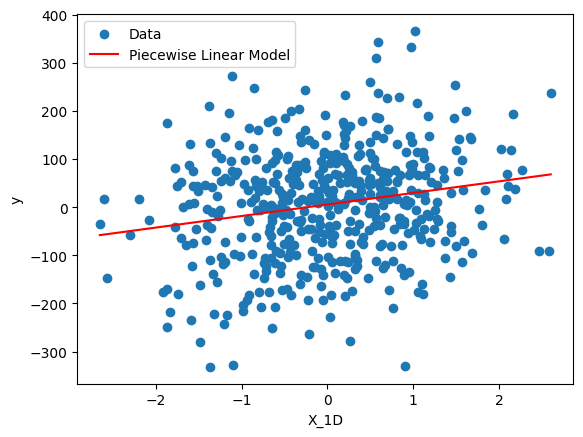

In [27]:
import pwlf
import numpy as np
import matplotlib.pyplot as plt

# Transform the X data into 1D for pwlf
X_1D = X[:, 0]  # Assuming we're using the first feature for the example

# Create a piecewise linear regression model
my_pwlf = pwlf.PiecewiseLinFit(X_1D, y)

# Determine the optimal number of line segments using the Bayesian Information Criterion (BIC)
n_segments = 3  # Start with a reasonable number of segments
bic = []

for n in range(1, n_segments + 1):
    my_pwlf.fit(n)
    rss = np.sum((y - my_pwlf.predict(X_1D))**2)
    k = n + 1  # number of parameters (n segments + 1 breakpoint)
    n_data = len(X_1D)
    curr_bic = n_data * np.log(rss / n_data) + k * np.log(n_data)
    bic.append(curr_bic)

optimal_n_segments = np.argmin(bic) + 1

# Fit the optimal piecewise linear model
my_pwlf.fit(optimal_n_segments)

# Get the breakpoints and slopes
breakpoints = my_pwlf.fit_breaks
slopes = my_pwlf.calc_slopes()

print("Breakpoints:", breakpoints)
print("Slopes:", slopes)

# Make predictions on the testing data
y_pred_piecewise = my_pwlf.predict(X_1D)

# Generate x values for plotting
x_plot = np.linspace(min(X_1D), max(X_1D), num=100)

# Predict y values using the piecewise linear model
y_plot = my_pwlf.predict(x_plot)

# Plot the data and the piecewise linear model
plt.scatter(X_1D, y, label='Data')
plt.plot(x_plot, y_plot, color='red', label='Piecewise Linear Model')
plt.xlabel('X_1D')
plt.ylabel('y')
plt.legend()
plt.show()


In [28]:
import numpy as np
from scipy.optimize import curve_fit
from sklearn.metrics import r2_score, mean_squared_error
from gplearn.genetic import SymbolicRegressor
from gplearn.functions import make_function
import sympy as sp

# Create an instance of the SPINEX class
model_instance = SPINEX()

# Fit/train the model with training data
model_instance.fit(X, y)

# Call the predict_contributions method on the instance
final_predictions, contributions, interaction_effects = model_instance.predict_contributions(X, instances_to_predict=None)

# Calculate the mean interaction effects (excluding diagonal elements)
interaction_effects_no_diag = interaction_effects.copy()
np.fill_diagonal(interaction_effects_no_diag, 0)
interaction_effects_mean = interaction_effects_no_diag.mean(axis=0).mean(axis=0)

# Calculate the sum of contributions
sum_of_contributions = contributions.sum(axis=1)

# Concatenate sum_of_contributions and interaction_effects_mean to form the predictor variable matrix X
X = np.column_stack((sum_of_contributions, interaction_effects_mean))

# Use the target variable y directly in the regression analysis
y = final_predictions

# Define the nonlinear functions
def linear_combination(x, beta0, beta1, beta2):
    contributions, interactions = x.T
    return beta0 + beta1 * contributions + beta2 * interactions

def polynomial(x, beta0, beta1, beta2, beta3, beta4):
    contributions, interactions = x.T
    return beta0 + beta1 * contributions + beta2 * contributions**2 + beta3 * interactions + beta4 * interactions**2

def exponential(x, beta0, beta1, beta2, beta3):
    contributions, interactions = x.T
    return beta0 + beta1 * np.exp(beta2 * contributions + beta3 * interactions)

def logarithmic(x, beta0, beta1, beta2, beta3):
    contributions, interactions = x.T
    return beta0 + beta1 * np.log(beta2 * contributions + beta3 * interactions + 1)

def sigmoid(x, beta0, beta1, beta2, beta3):
    contributions, interactions = x.T
    return beta0 + beta1 / (1 + np.exp(-(beta2 * contributions + beta3 * interactions)))

def interaction(x, beta0, beta1, beta2, beta3):
    contributions, interactions = x.T
    return beta0 + beta1 * contributions + beta2 * interactions + beta3 * (contributions * interactions)

# List of models and their names
models = [linear_combination, polynomial, exponential, logarithmic, sigmoid, interaction]
model_names = ['Linear Combination', 'Polynomial', 'Exponential', 'Logarithmic', 'Sigmoid', 'Interaction']

# Define symbols for contributions and interactions
c, i = sp.symbols('c i')

# Fit and evaluate each model
for model, model_name in zip(models, model_names):
    try:
        # Fit the model using curve_fit
        params, _ = curve_fit(model, X, y, maxfev=10000)
        y_pred = model(X, *params)

        # Check if y_pred contains NaN values
        if np.isnan(y_pred).any():
            print(f"Model: {model_name}")
            print("  Prediction contains NaN values. Skipping evaluation.")
            continue

        # Evaluate the model
        r2 = r2_score(y, y_pred)
        mse = mean_squared_error(y, y_pred)

        # Print the evaluation metrics
        print(f"Model: {model_name}")
        print(f"  R-squared (R2): {r2:.4f}")
        print(f"  Mean Squared Error (MSE): {mse:.4f}")

        # Generate symbolic equation for each model
        if model_name == 'Linear Combination':
            equation = sp.Eq(params[0] + params[1] * c + params[2] * i, 0)
        elif model_name == 'Polynomial':
            equation = sp.Eq(params[0] + params[1] * c + params[2] * c**2 + params[3] * i + params[4] * i**2, 0)

        # Generate symbolic equations for other functional forms
        elif model_name == 'Exponential':
            equation = sp.Eq(params[0] + params[1] * sp.exp(params[2] * c + params[3] * i), 0)
        elif model_name == 'Logarithmic':
            equation = sp.Eq(params[0] + params[1] * sp.log(params[2] * c + params[3] * i + 1), 0)
        elif model_name == 'Sigmoid':
            equation = sp.Eq(params[0] + params[1] / (1 + sp.exp(-(params[2] * c + params[3] * i))), 0)
        elif model_name == 'Interaction':
            equation = sp.Eq(params[0] + params[1] * c + params[2] * i + params[3] * (c * i), 0)

        # Print the symbolic equation
        print(f"  Equation: {sp.pretty(equation)}")

    except Exception as e:
        print(f"Model: {model_name}")
        print(f"  Error: {str(e)}")

# Define a custom function that combines both X0 and X1 using addition
def combine_X0_X1(X0, X1):
    return X0 + X1

# Create the custom function for use with gplearn
combine_func = make_function(function=combine_X0_X1, name='combine', arity=2)

# Instantiate the SymbolicRegressor with the custom function set
symbolic_regressor = SymbolicRegressor(
    function_set=['add', 'sub', 'mul', 'div', combine_func], # Include the custom function
    population_size=500,
    generations=25,
    stopping_criteria=0.01,
    p_crossover=0.7,
    p_subtree_mutation=0.1,
    p_hoist_mutation=0.05,
    p_point_mutation=0.1,
    max_samples=0.9,
    verbose=1,
    parsimony_coefficient=0.01,
    random_state=42
)

# Fit the symbolic regressor
symbolic_regressor.fit(X, y)

# Predict using the symbolic regressor
y_pred_symbolic = symbolic_regressor.predict(X)

# Evaluate the symbolic regressor
r2_symbolic = r2_score(y, y_pred_symbolic)
mse_symbolic = mean_squared_error(y, y_pred_symbolic)

# Print the results
print('Model: Symbolic Regression')
print(f'  Best Symbolic Expression: {symbolic_regressor._program}')
print(f'  R-squared (R2): {r2_symbolic:.4f}')
print(f'  Mean Squared Error (MSE): {mse_symbolic:.4f}')

# Print the equation for the symbolic regression model
print(f"  Equation: {sp.pretty(symbolic_regressor._program)}")

# Analyze all instances in X
#final_predictions, contributions, interaction_effects = my_model.predict_contributions(X, instances_to_predict=None)
# Analyze only the first, third, and fifth instances in X
#final_predictions, contributions, interaction_effects = my_model.predict_contributions(X, instances_to_predict=[0, 2, 4])
# Analyze a range of instances, e.g., the first 10 instances in X
#final_predictions, contributions, interaction_effects = my_model.predict_contributions(X, instances_to_predict=range(10))

Model: Linear Combination
  R-squared (R2): 0.9750
  Mean Squared Error (MSE): 300.5815
  Equation: 0.884439067557664⋅c + 3.34392647194897⋅i + 5.03982016979484 = 0
Model: Polynomial
  R-squared (R2): 0.9759
  Mean Squared Error (MSE): 290.5524
  Equation:                        2                                             2        
- 8.12074991320823e-5⋅c  + 0.885052357857343⋅c - 0.0085277636701826⋅i  + 3.361

                                    
57188657176⋅i + 7.02128598453039 = 0
Model: Exponential
  R-squared (R2): -inf
  Mean Squared Error (MSE): inf
  Equation:                         0.999999999797248⋅c + 1.00000000043701⋅i              
- 3.34882144653883e-15⋅ℯ                                         - 2.454075152

              
60393e+116 = 0
Model: Logarithmic
  Prediction contains NaN values. Skipping evaluation.
Model: Sigmoid
  R-squared (R2): 0.9768
  Mean Squared Error (MSE): 279.4341
  Equation:                                      1098.70317495013                    

c:\Users\mznas\AppData\Local\Programs\Python\Python310\lib\site-packages\scipy\optimize\_minpack_py.py:862: RuntimeWarning: overflow encountered in square
  cost = np.sum(infodict['fvec'] ** 2)
c:\Users\mznas\AppData\Local\Programs\Python\Python310\lib\site-packages\scipy\optimize\_minpack_py.py:900: RuntimeWarning: invalid value encountered in multiply
  pcov = pcov * s_sq
c:\Users\mznas\AppData\Local\Programs\Python\Python310\lib\site-packages\sklearn\metrics\_regression.py:927: RuntimeWarning: overflow encountered in square
  numerator = (weight * (y_true - y_pred) ** 2).sum(axis=0, dtype=np.float64)
c:\Users\mznas\AppData\Local\Programs\Python\Python310\lib\site-packages\sklearn\metrics\_regression.py:446: RuntimeWarning: overflow encountered in square
  output_errors = np.average((y_true - y_pred) ** 2, axis=0, weights=sample_weight)
C:\Users\mznas\AppData\Local\Temp\ipykernel_6536\3834087700.py:46: RuntimeWarning: invalid value encountered in log
  return beta0 + beta1 * np.log(b

   0    37.54      1.48346e+12        7          22.0795          21.6823      8.90s
   1    13.37          77260.5        7          18.7578          22.1833      5.91s
   2    14.05          238.659       13          17.3591          19.2029      5.74s
   3    16.82          259.674       27          17.0972           19.517      5.37s
   4    18.30      5.69622e+07       27          16.8737          23.0267      4.98s
   5    19.96          259.908       27          16.8443          20.8844      5.00s
   6    21.37       6.4866e+07       25          15.3444          12.6206      5.07s
   7    23.61          557.892       25          14.6677          14.6117      4.76s
   8    24.28          799.888       29          13.8744          19.7221      4.84s
   9    27.36      3.49549e+06       33          13.8275          17.8244      4.64s
  10    31.34          283.825       33          13.8613          17.5255      4.73s
  11    31.83          420.823       31          13.8506         

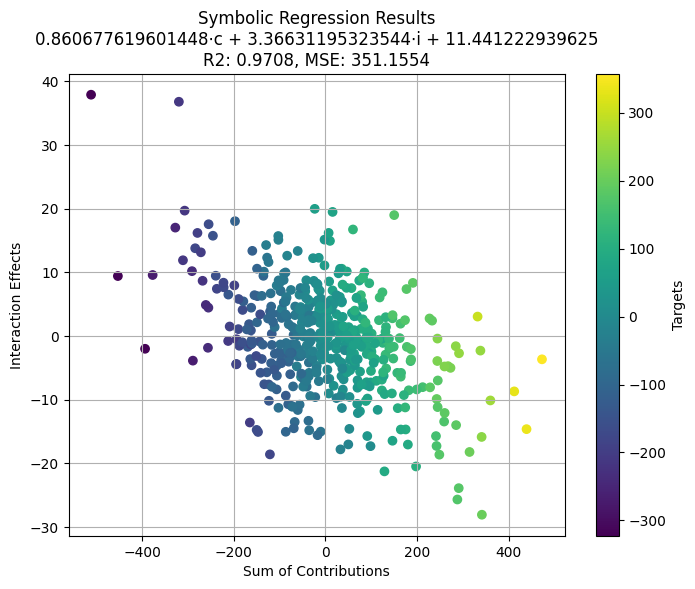

In [29]:
import matplotlib.pyplot as plt

def plot_symbolic_regression_results(X, y_original, best_expr, selected_indices=None):
    # If selected_indices is not provided, use the full dataset
    if selected_indices is None:
        selected_indices = range(X.shape[0])
    
    # Extract selected data points
    X_selected = X[selected_indices]
    y_selected = y_original[selected_indices]
    
    # Compute contributions and interactions
    contributions = X_selected[:, 0]
    interactions = X_selected[:, 1]
    
    # Replace "⋅" character with "*" in the equation
    best_expr = best_expr.replace("⋅", "*")

    # Parse the symbolic expression using sympy
    c, i = sp.symbols('c i')
    best_expr = sp.sympify(best_expr)
    
    # Convert the symbolic expression into a NumPy function
    expr_numpy = sp.lambdify((c, i), best_expr, 'numpy')
    
    # Evaluate the best symbolic expression on the selected data
    y_pred = expr_numpy(contributions, interactions)
    
    # Compute the metrics
    r2 = r2_score(y_selected, y_pred)
    mse = mean_squared_error(y_selected, y_pred)
    
    # Plot the actual vs predicted values
    plt.figure(figsize=(8, 6))
    plt.scatter(contributions, interactions, c=y_selected, cmap='viridis', label='Actual')
    plt.colorbar(label='Targets')
    
    # Customize the plot
    plt.xlabel('Sum of Contributions')
    plt.ylabel('Interaction Effects')
    plt.title(f"Symbolic Regression Results\n{sp.pretty(best_expr)}\nR2: {r2:.4f}, MSE: {mse:.4f}")
    plt.grid(True)
    plt.show()

# Define the equation as a string
best_expr = "- 1.81334605380188e-5⋅c  + 0.860695753061986⋅c - 0.00674615741860855⋅i  + 3.37305811065405⋅i + 11.441222939625"  # Replace this with your desired equation

# Use the function to plot the results (using the full dataset)
plot_symbolic_regression_results(X, y, best_expr)


In [30]:
from sklearn.datasets import make_regression
from sklearn.model_selection import GridSearchCV

# Create a synthetic regression dataset
X, y = make_regression(n_samples=500, n_features=4, noise=0.1, random_state=42)

# Instantiate the SPINEX class with default parameters
model = SPINEX()

# Define the hyperparameter grid
param_grid = {
    'n_neighbors': [3, 5, 7, 9, 15],
    'distance_threshold': [0.05, 0.1, 0.5, 1.0],
    'distance_threshold_decay': [0.05, 0.1, 0.5, 1.0],
    #'ensemble_method': [None, 'bagging', 'boosting'],
    #'n_features_to_select': [None, 2],
    #'auto_select_features': [True, False],
    #'use_local_search': [True, False],
    #'prioritized_features': [None, [0, 2]],
    #'missing_data_method': ['mean_imputation', 'deletion'],
    #'outlier_handling_method': ['z_score_outlier_handling', 'iqr_outlier_handling'],
    #'exclude_method': ['zero', 'mean']
}


# Create the grid search object with R^2 as the scoring metric
grid_search = GridSearchCV(estimator=model, param_grid=param_grid, cv=5, scoring='r2')

# Fit the grid search object to the data
grid_search.fit(X, y)

# Print the best hyperparameters
print("Best hyperparameters:", grid_search.best_params_)

# Print the best score (R^2)
print("Best R^2 score:", grid_search.best_score_)

# Get the best estimator
best_model = grid_search.best_estimator_

Best hyperparameters: {'distance_threshold': 0.05, 'distance_threshold_decay': 0.05, 'n_neighbors': 3}
Best R^2 score: 0.9144337271440115
